In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r tau
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 350s - loss: 3.1122e-04
Epoch 2/10
 - 327s - loss: 5.2128e-05
Epoch 3/10
 - 327s - loss: 4.5893e-05
Epoch 4/10
 - 328s - loss: 4.3490e-05
Epoch 5/10
 - 327s - loss: 4.2008e-05
Epoch 6/10
 - 327s - loss: 4.1407e-05
Epoch 7/10
 - 327s - loss: 3.9963e-05
Epoch 8/10
 - 327s - loss: 3.9743e-05
Epoch 9/10
 - 327s - loss: 3.9147e-05
Epoch 10/10
 - 327s - loss: 3.9565e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.0383 RMSE


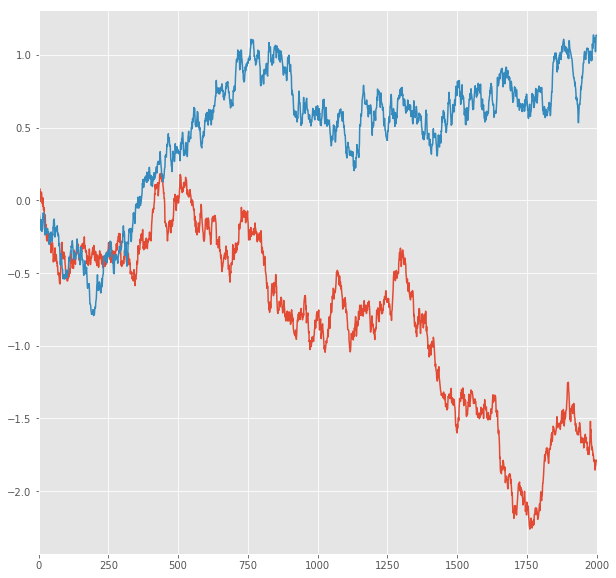

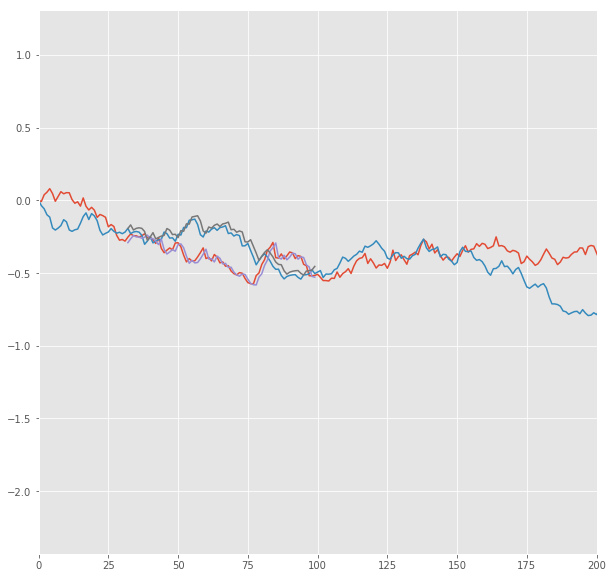

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.0444 RMSE
Predict Score for 1 -steps forecast: 0.0455 RMSE
Error Test Score for 1 -steps forecast: 0.1036 RMSE
RT Test Score for 1 -steps forecast: 0.1062 RMSE
Error Test Corr for 1 -steps forecast: 0.9855
RT Test Corr for 1 -steps forecast: 0.9551


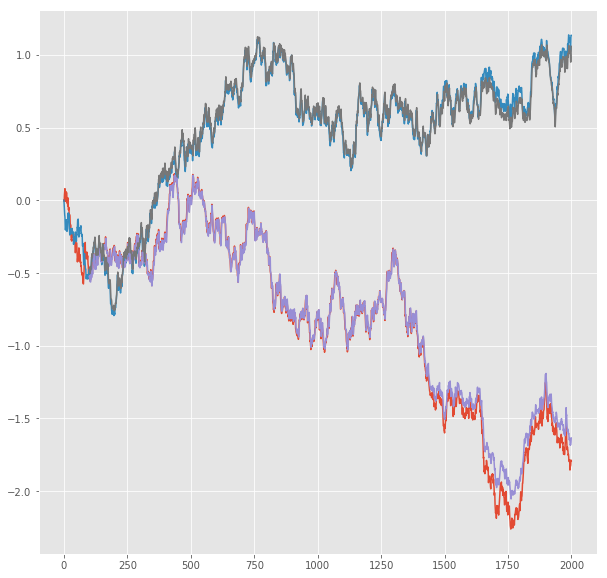

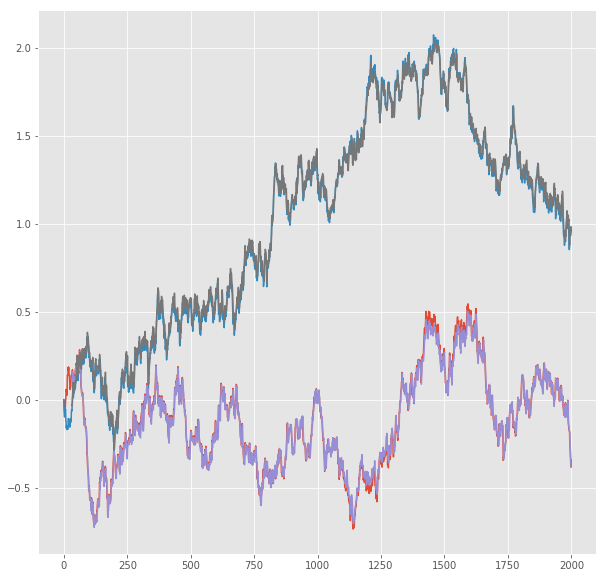

R^2 score for regression on Error: 0.9712
k = 0.9670


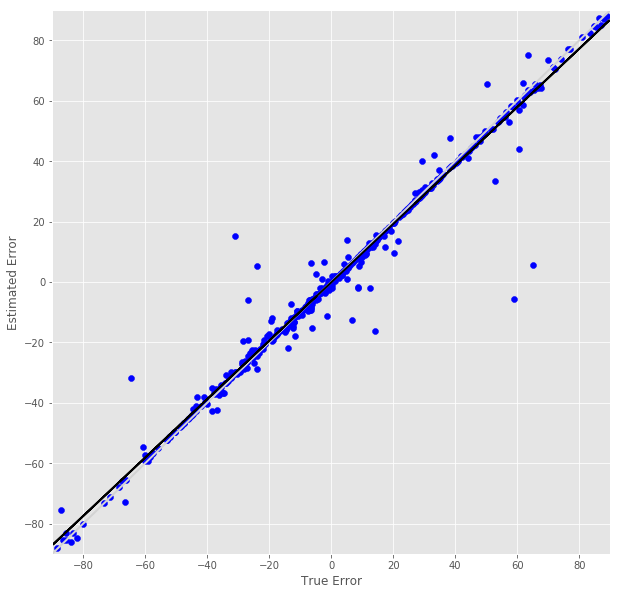

R^2 score for regression on RT: 0.9122
k = 0.9761


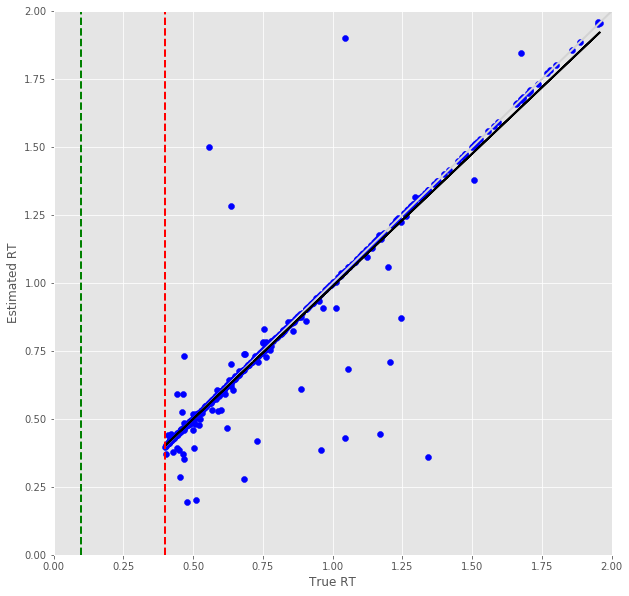

Error Prediction Score: 0.0803 RMSE
RT Prediction Score: 0.0445 RMSE
Error Prediction Corr: 0.9897
RT Prediction Corr: 0.9898
R^2 score for regression on Error: 0.9796
k = 0.9600


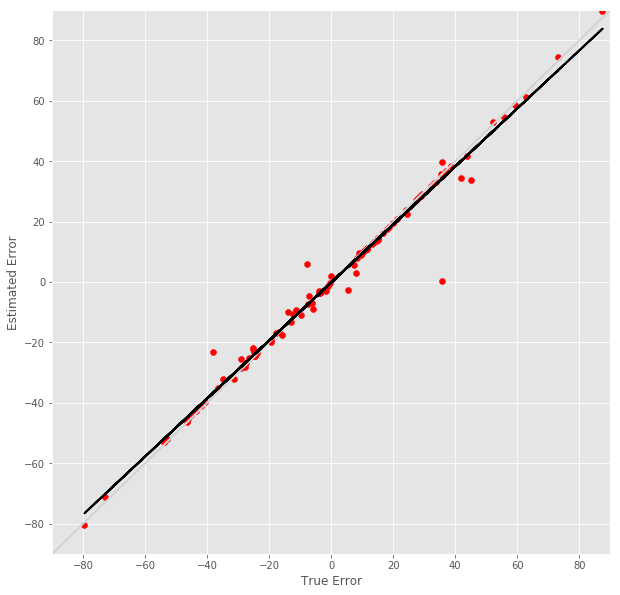

R^2 score for regression on RT: 0.9797
k = 1.0022


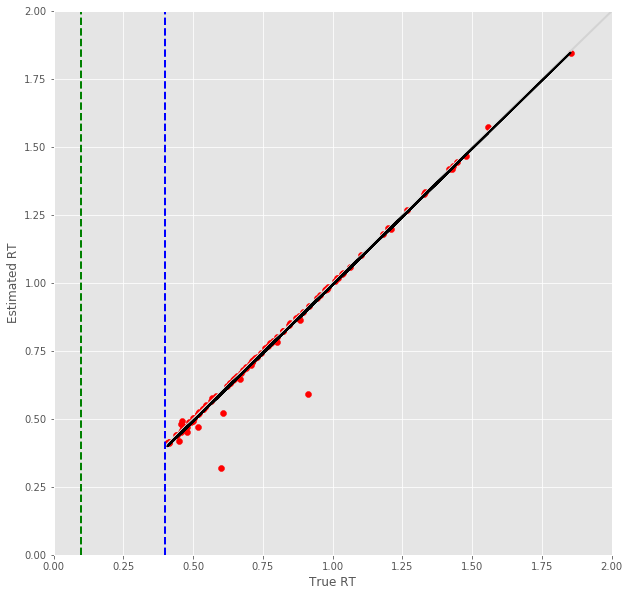

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.0717 RMSE
Predict Score for 2 -steps forecast: 0.0731 RMSE
Error Test Score for 2 -steps forecast: 0.1846 RMSE
RT Test Score for 2 -steps forecast: 0.1753 RMSE
Error Test Corr for 2 -steps forecast: 0.9532
RT Test Corr for 2 -steps forecast: 0.8819


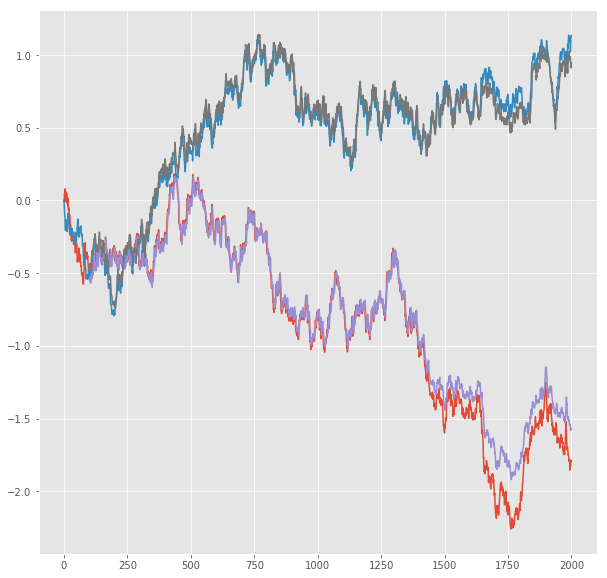

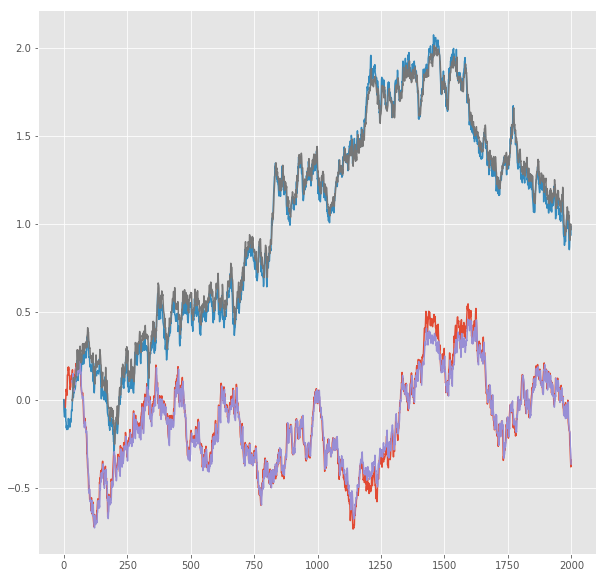

R^2 score for regression on Error: 0.9087
k = 0.9135


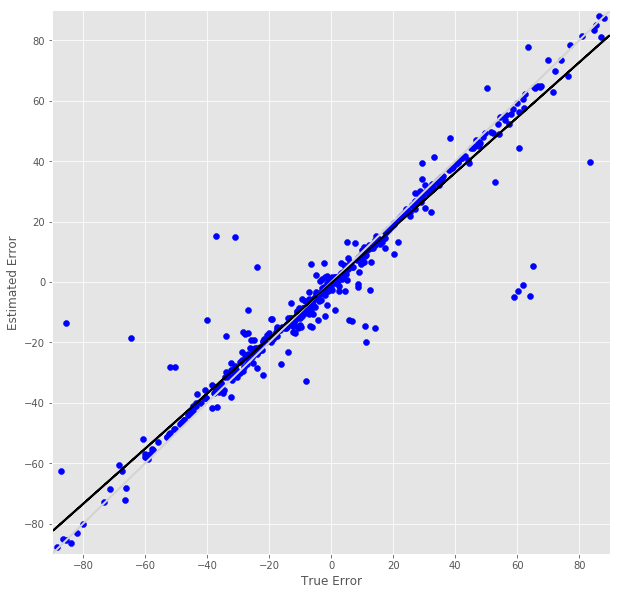

R^2 score for regression on RT: 0.7777
k = 0.9294


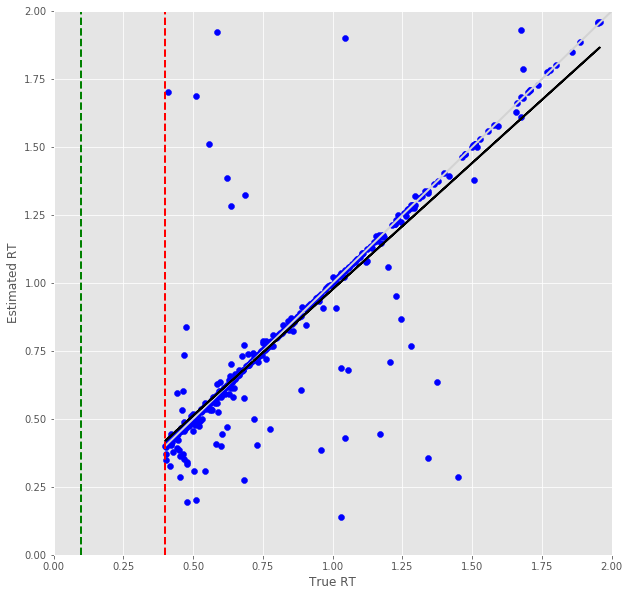

Error Prediction Score: 0.2177 RMSE
RT Prediction Score: 0.1185 RMSE
Error Prediction Corr: 0.9219
RT Prediction Corr: 0.9310
R^2 score for regression on Error: 0.8498
k = 0.8660


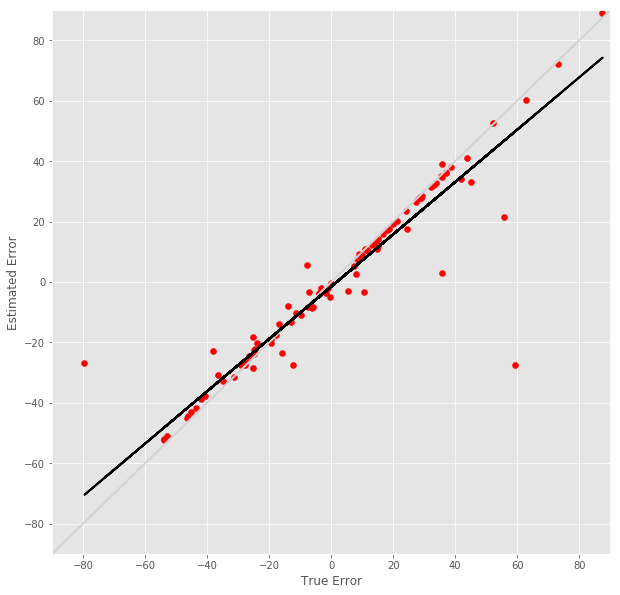

R^2 score for regression on RT: 0.8668
k = 0.9934


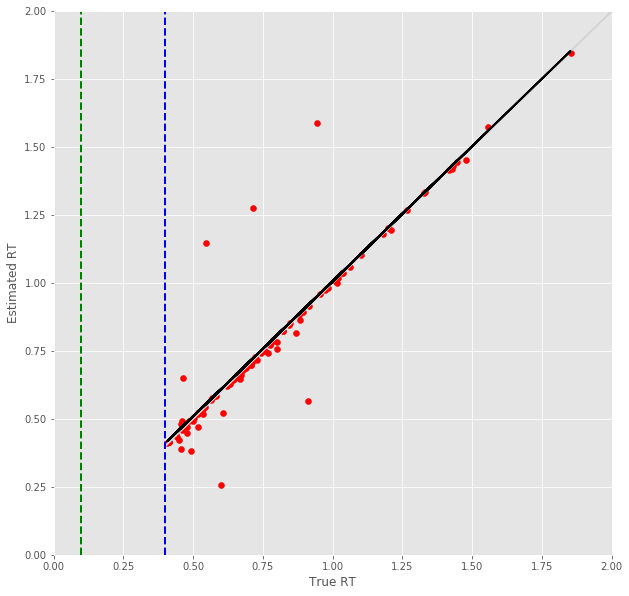

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.0967 RMSE
Predict Score for 3 -steps forecast: 0.0983 RMSE
Error Test Score for 3 -steps forecast: 0.2371 RMSE
RT Test Score for 3 -steps forecast: 0.2251 RMSE
Error Test Corr for 3 -steps forecast: 0.9228
RT Test Corr for 3 -steps forecast: 0.8033


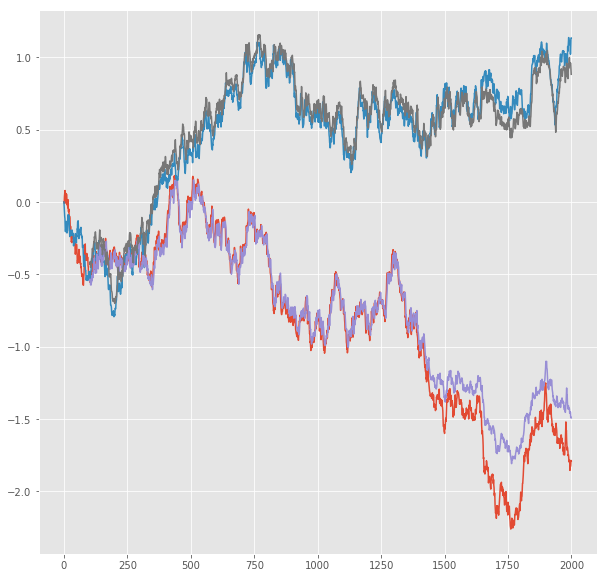

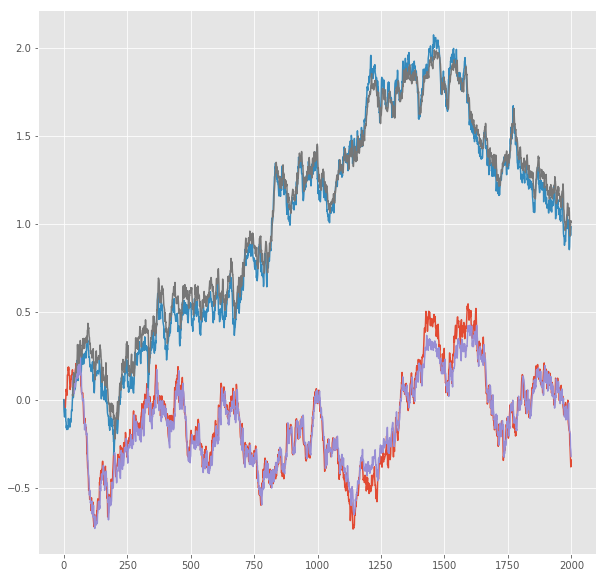

R^2 score for regression on Error: 0.8515
k = 0.8784


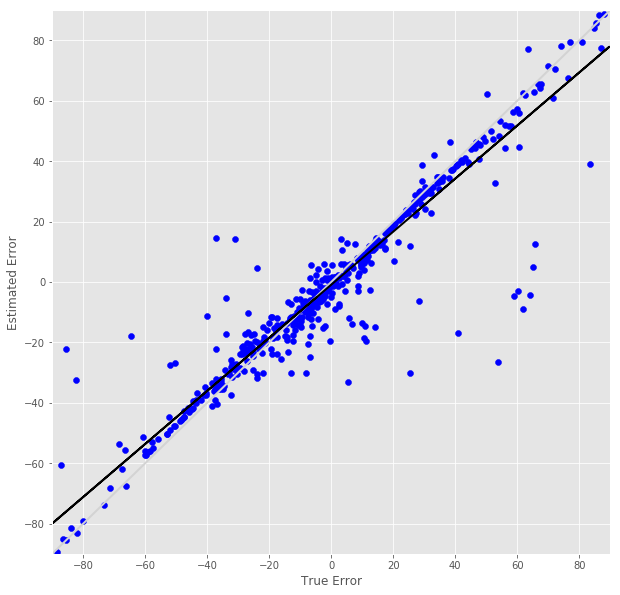

R^2 score for regression on RT: 0.6453
k = 0.8438


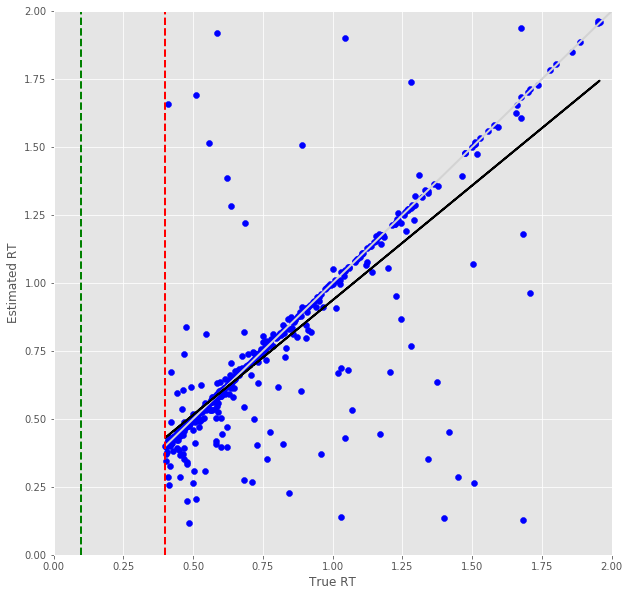

Error Prediction Score: 0.2446 RMSE
RT Prediction Score: 0.2003 RMSE
Error Prediction Corr: 0.8999
RT Prediction Corr: 0.8056
R^2 score for regression on Error: 0.8099
k = 0.8041


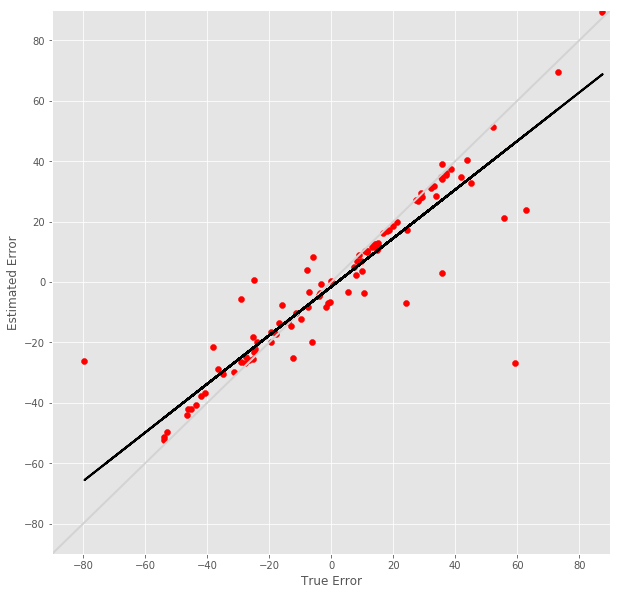

R^2 score for regression on RT: 0.6489
k = 0.8785


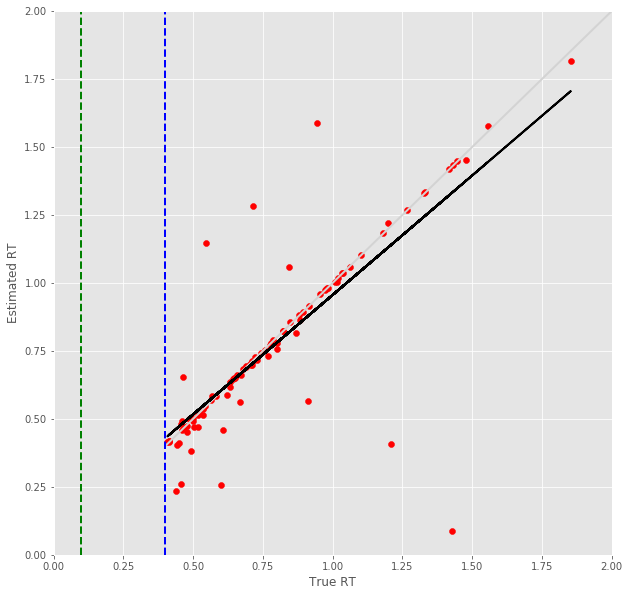

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.1199 RMSE
Predict Score for 4 -steps forecast: 0.1216 RMSE
Error Test Score for 4 -steps forecast: 0.2925 RMSE
RT Test Score for 4 -steps forecast: 0.2530 RMSE
Error Test Corr for 4 -steps forecast: 0.8825
RT Test Corr for 4 -steps forecast: 0.7519


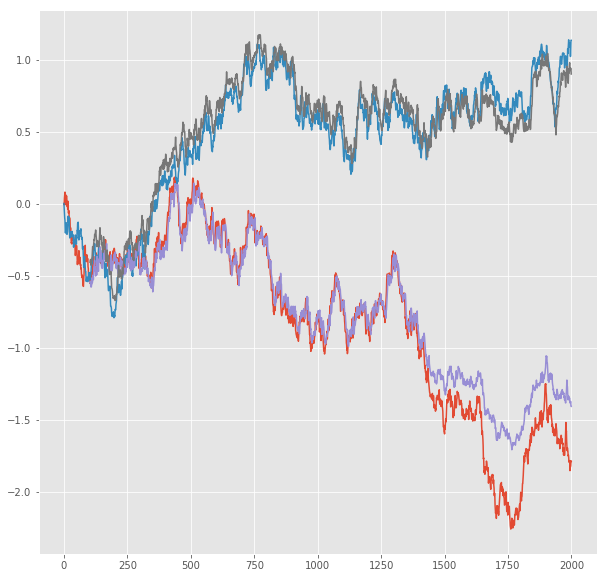

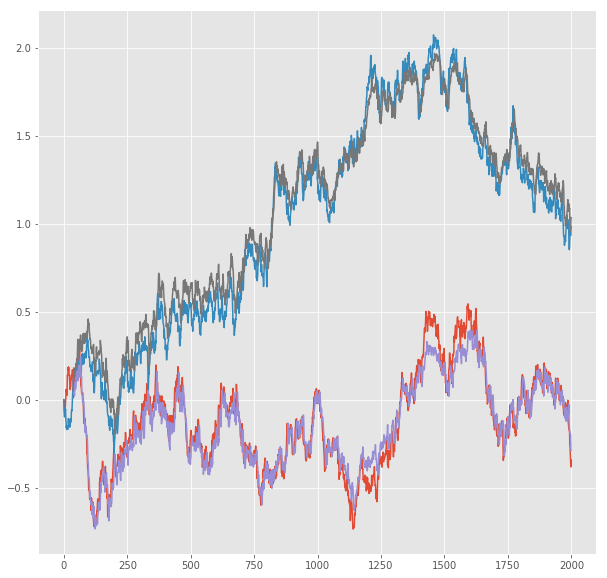

R^2 score for regression on Error: 0.7789
k = 0.8509


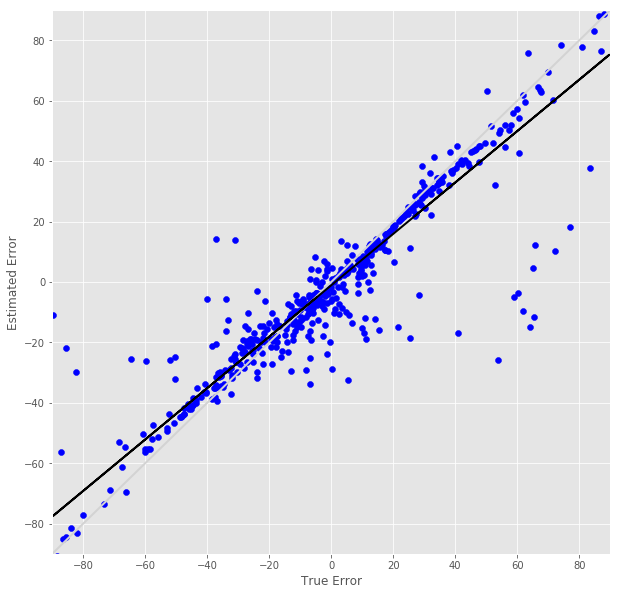

R^2 score for regression on RT: 0.5654
k = 0.7861


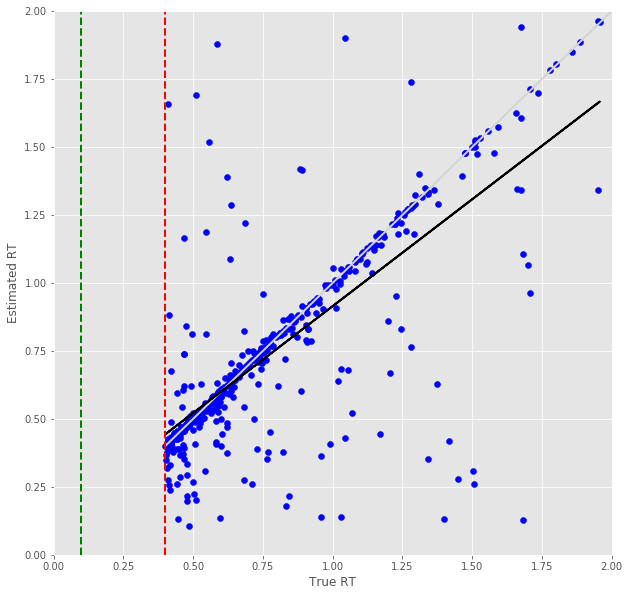

Error Prediction Score: 0.2603 RMSE
RT Prediction Score: 0.2155 RMSE
Error Prediction Corr: 0.8867
RT Prediction Corr: 0.7867
R^2 score for regression on Error: 0.7862
k = 0.7738


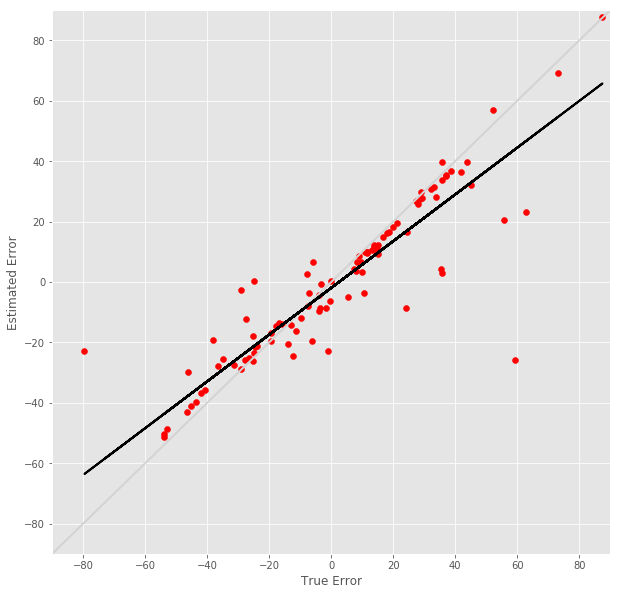

R^2 score for regression on RT: 0.6190
k = 0.8810


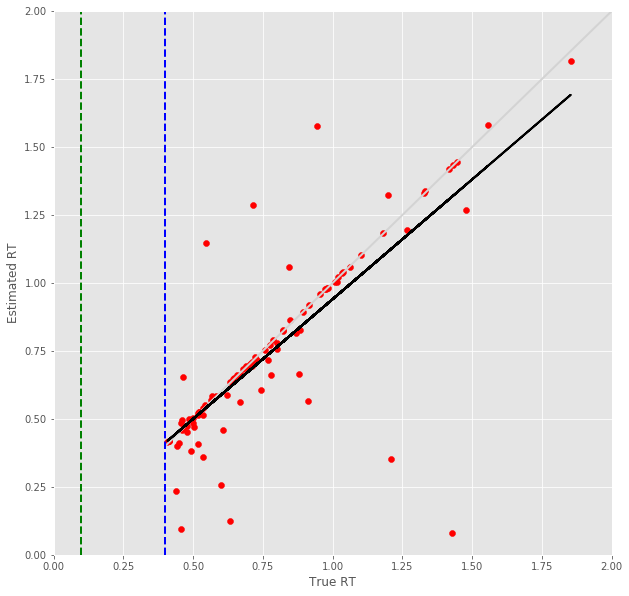

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.1418 RMSE
Predict Score for 5 -steps forecast: 0.1435 RMSE
Error Test Score for 5 -steps forecast: 0.3195 RMSE
RT Test Score for 5 -steps forecast: 0.2798 RMSE
Error Test Corr for 5 -steps forecast: 0.8544
RT Test Corr for 5 -steps forecast: 0.7037


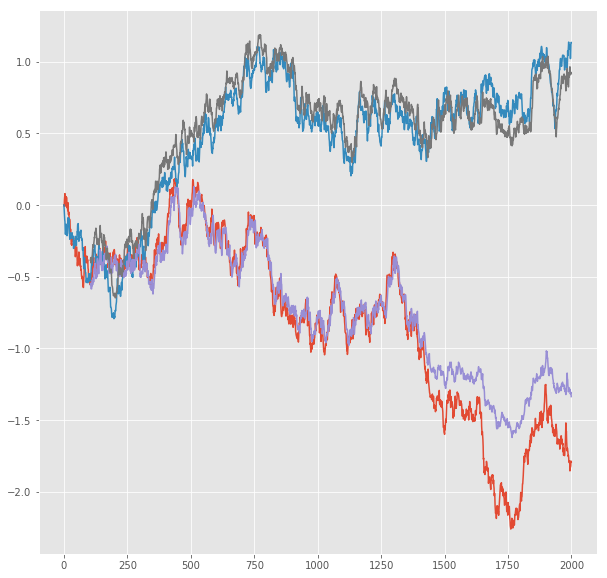

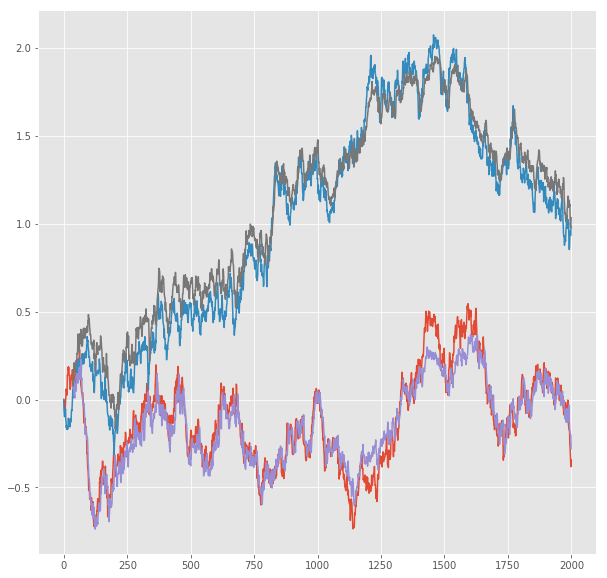

R^2 score for regression on Error: 0.7299
k = 0.7690


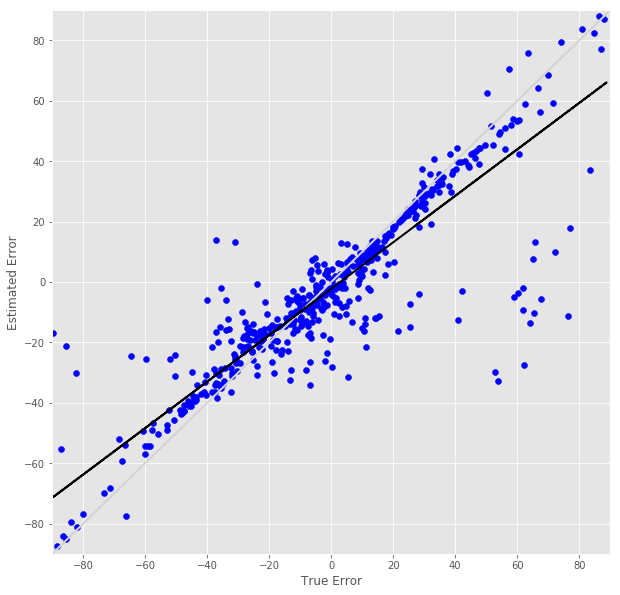

R^2 score for regression on RT: 0.4952
k = 0.7539


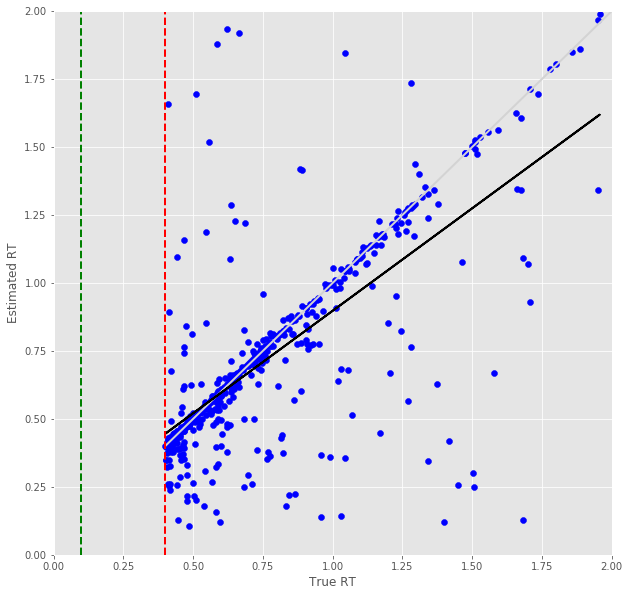

Error Prediction Score: 0.2984 RMSE
RT Prediction Score: 0.2475 RMSE
Error Prediction Corr: 0.8498
RT Prediction Corr: 0.7260
R^2 score for regression on Error: 0.7222
k = 0.7257


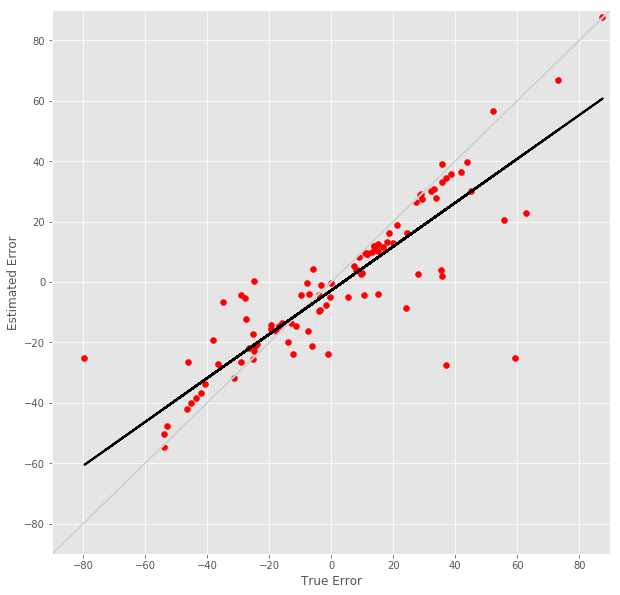

R^2 score for regression on RT: 0.5271
k = 0.8165


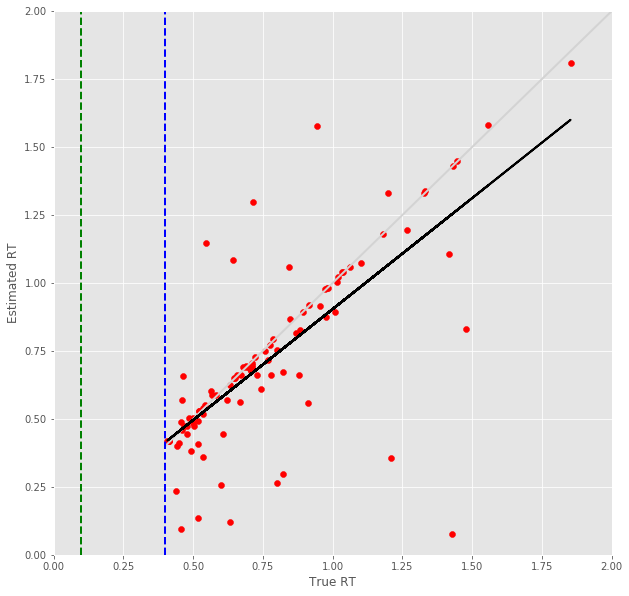

6 -step(s) forecast:
Test Score for 6 -steps forecast: 0.1626 RMSE
Predict Score for 6 -steps forecast: 0.1643 RMSE
Error Test Score for 6 -steps forecast: 0.3313 RMSE
RT Test Score for 6 -steps forecast: 0.3040 RMSE
Error Test Corr for 6 -steps forecast: 0.8446
RT Test Corr for 6 -steps forecast: 0.6522


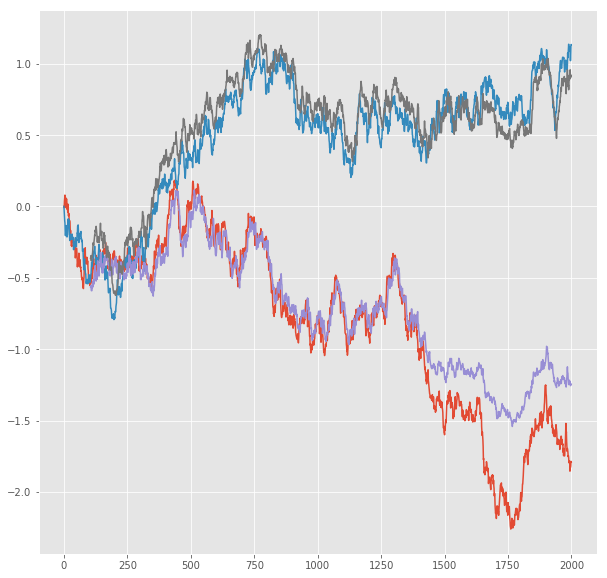

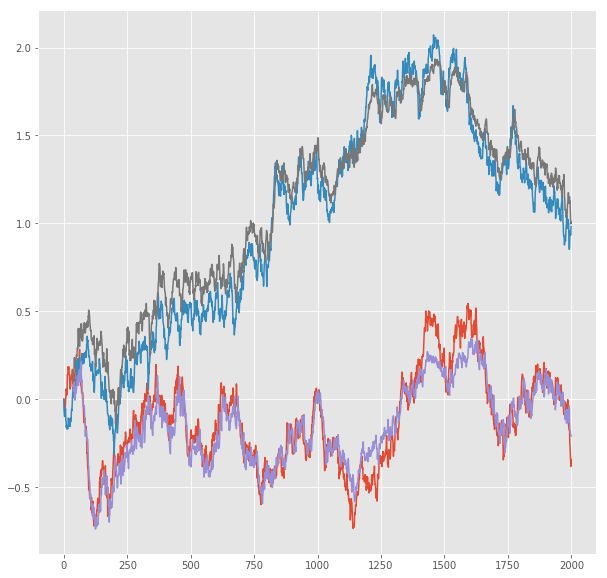

R^2 score for regression on Error: 0.7133
k = 0.7779


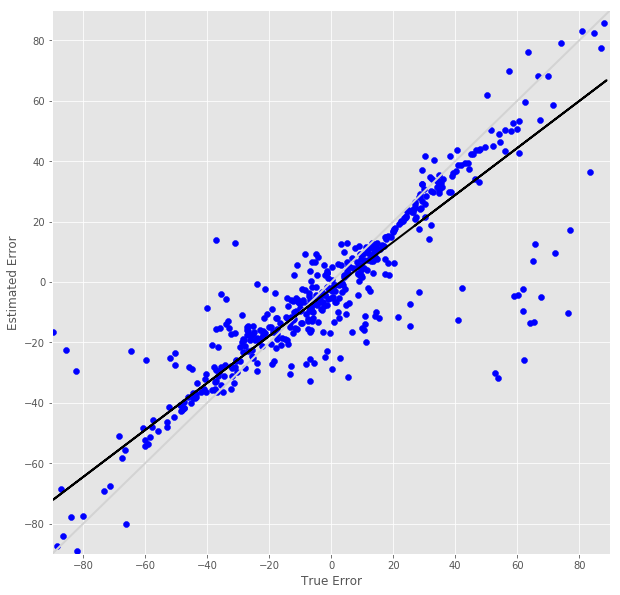

R^2 score for regression on RT: 0.4253
k = 0.7004


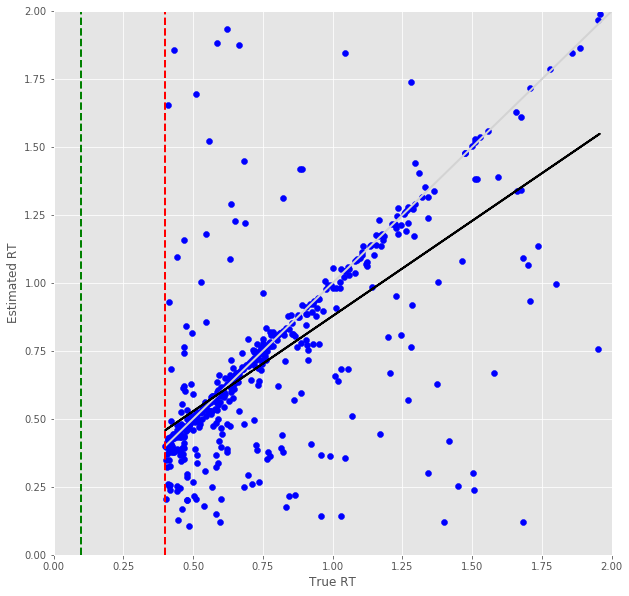

Error Prediction Score: 0.3076 RMSE
RT Prediction Score: 0.2933 RMSE
Error Prediction Corr: 0.8403
RT Prediction Corr: 0.6355
R^2 score for regression on Error: 0.7060
k = 0.7053


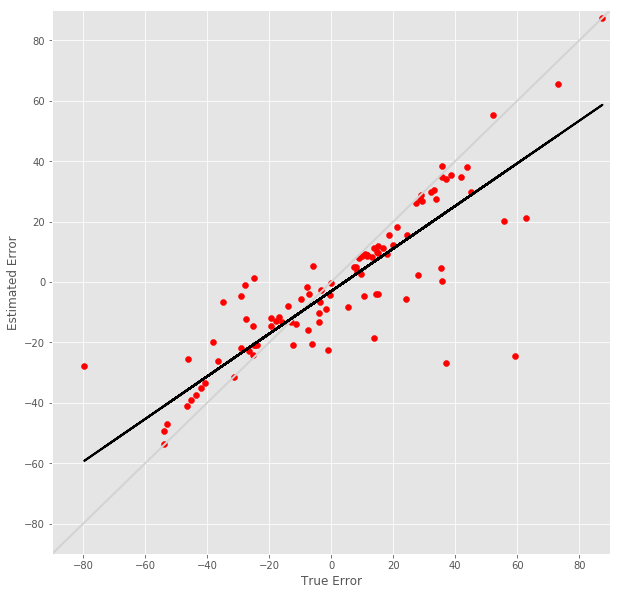

R^2 score for regression on RT: 0.4039
k = 0.7308


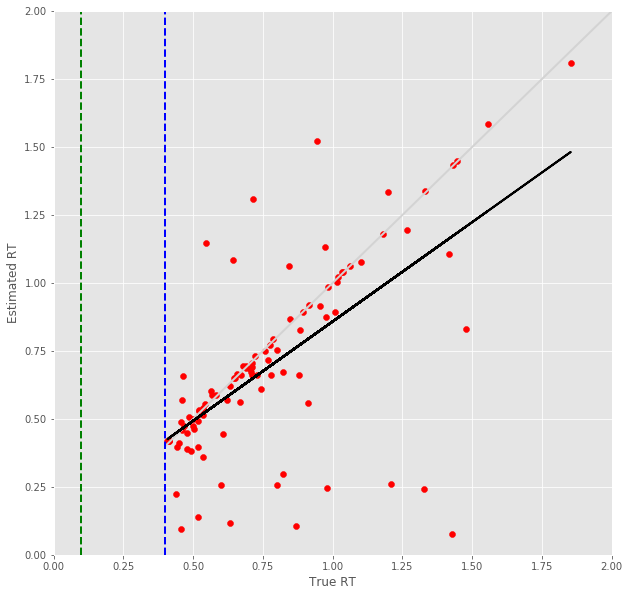

7 -step(s) forecast:
Test Score for 7 -steps forecast: 0.1825 RMSE
Predict Score for 7 -steps forecast: 0.1841 RMSE
Error Test Score for 7 -steps forecast: 0.3585 RMSE
RT Test Score for 7 -steps forecast: 0.3167 RMSE
Error Test Corr for 7 -steps forecast: 0.8144
RT Test Corr for 7 -steps forecast: 0.6352


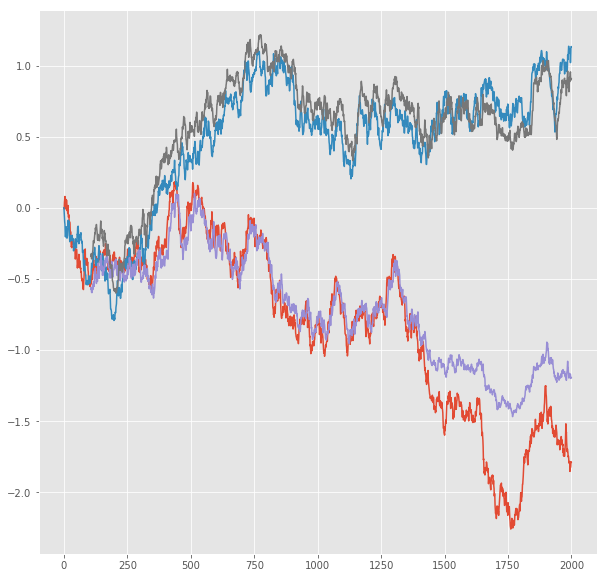

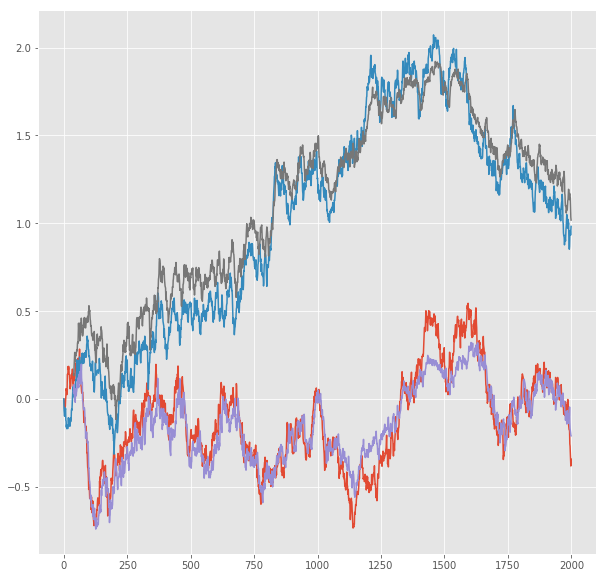

R^2 score for regression on Error: 0.6632
k = 0.7176


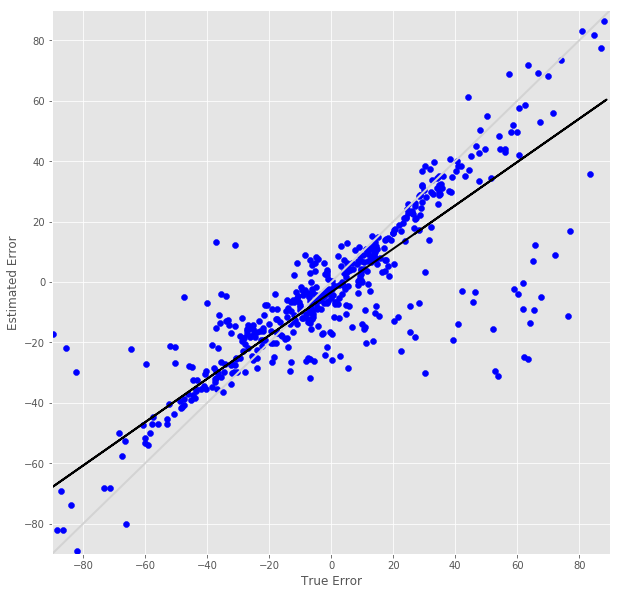

R^2 score for regression on RT: 0.4034
k = 0.6895


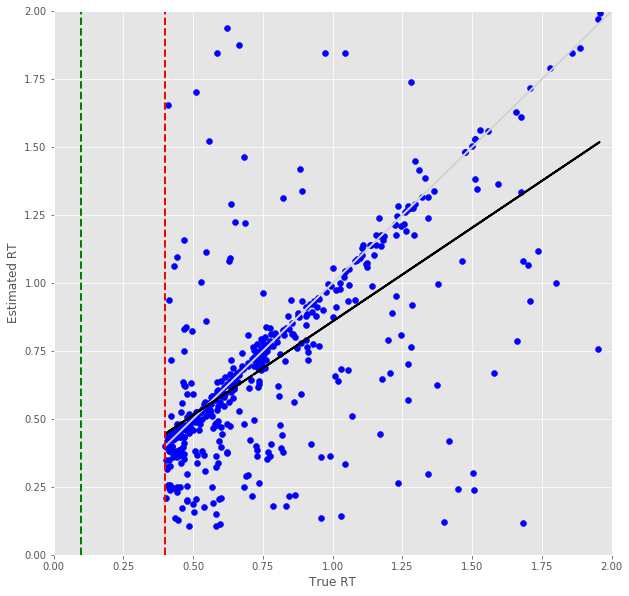

Error Prediction Score: 0.3052 RMSE
RT Prediction Score: 0.3074 RMSE
Error Prediction Corr: 0.8368
RT Prediction Corr: 0.6071
R^2 score for regression on Error: 0.7002
k = 0.7019


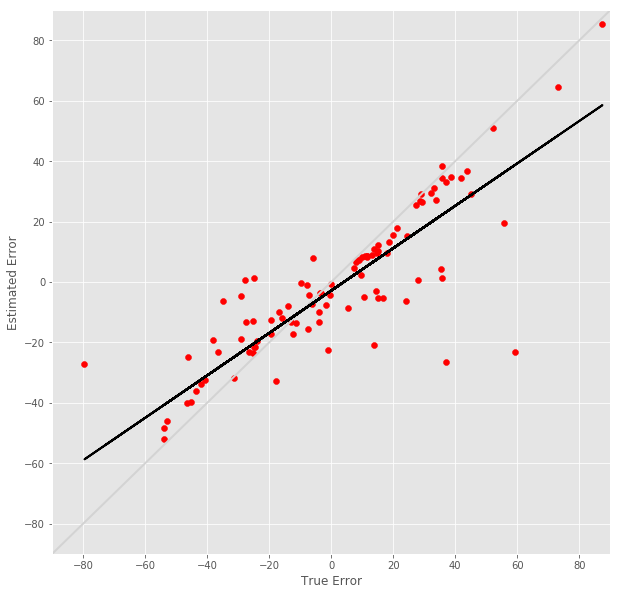

R^2 score for regression on RT: 0.3685
k = 0.6918


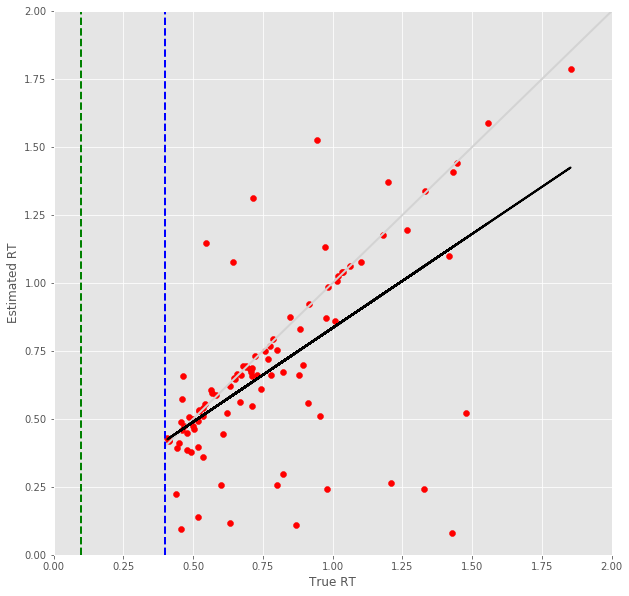

8 -step(s) forecast:
Test Score for 8 -steps forecast: 0.2018 RMSE
Predict Score for 8 -steps forecast: 0.2033 RMSE
Error Test Score for 8 -steps forecast: 0.3814 RMSE
RT Test Score for 8 -steps forecast: 0.3426 RMSE
Error Test Corr for 8 -steps forecast: 0.7816
RT Test Corr for 8 -steps forecast: 0.5730


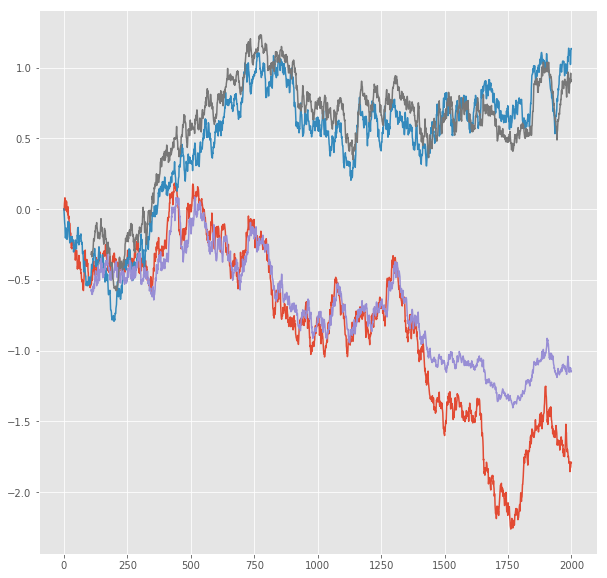

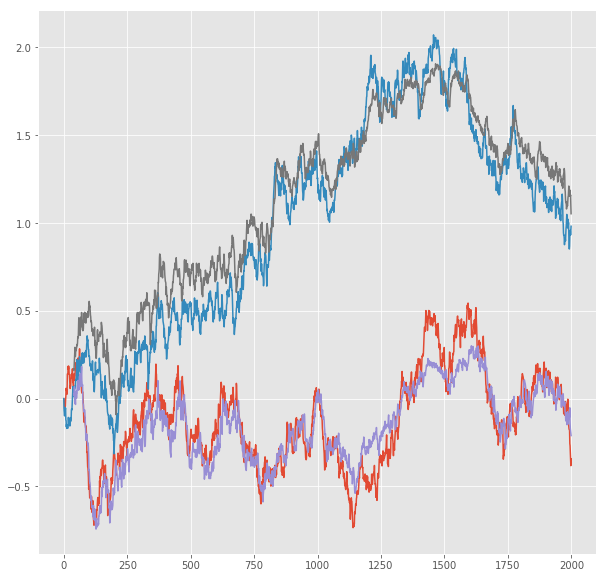

R^2 score for regression on Error: 0.6110
k = 0.7081


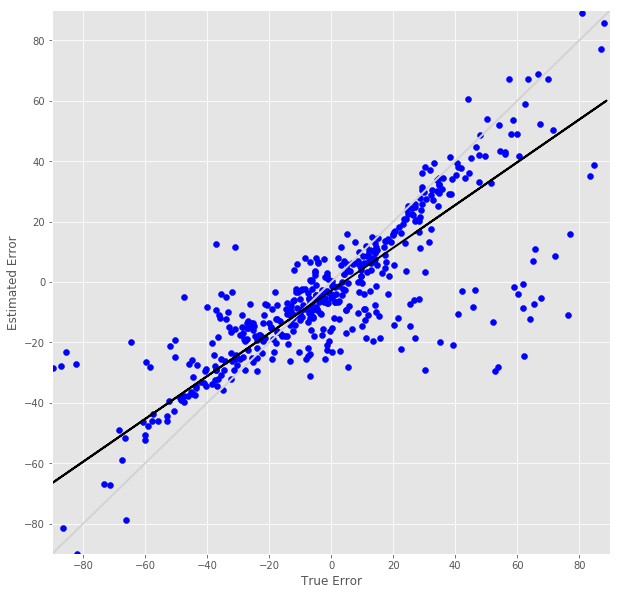

R^2 score for regression on RT: 0.3283
k = 0.6390


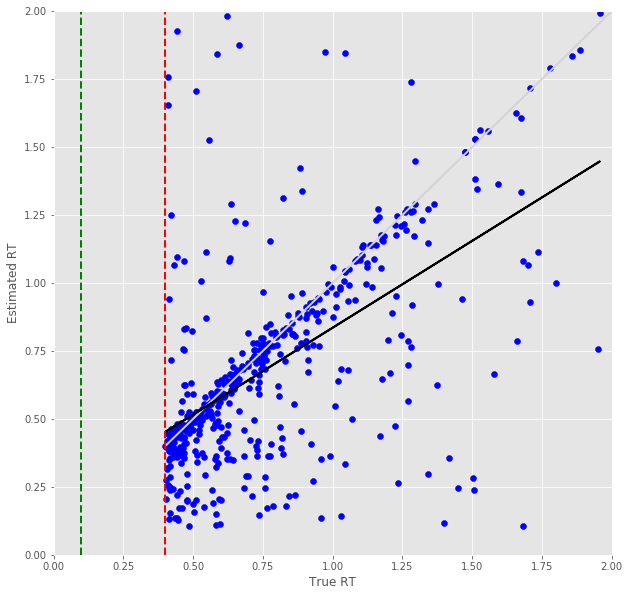

Error Prediction Score: 0.3267 RMSE
RT Prediction Score: 0.3245 RMSE
Error Prediction Corr: 0.8171
RT Prediction Corr: 0.5736
R^2 score for regression on Error: 0.6677
k = 0.6636


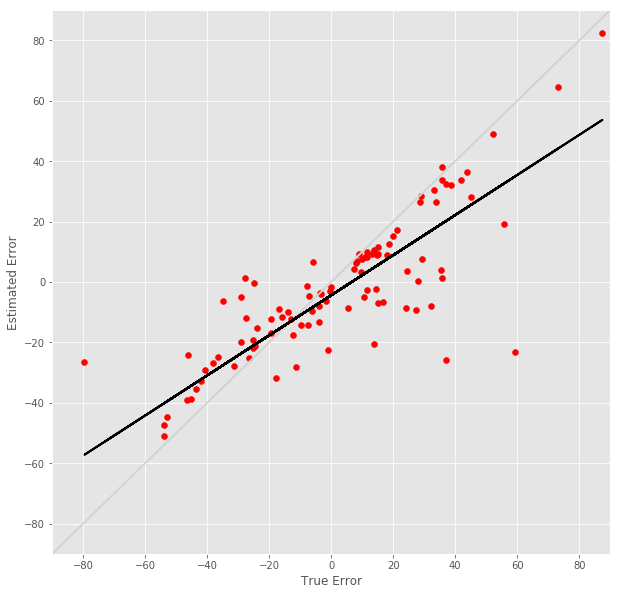

R^2 score for regression on RT: 0.3291
k = 0.6468


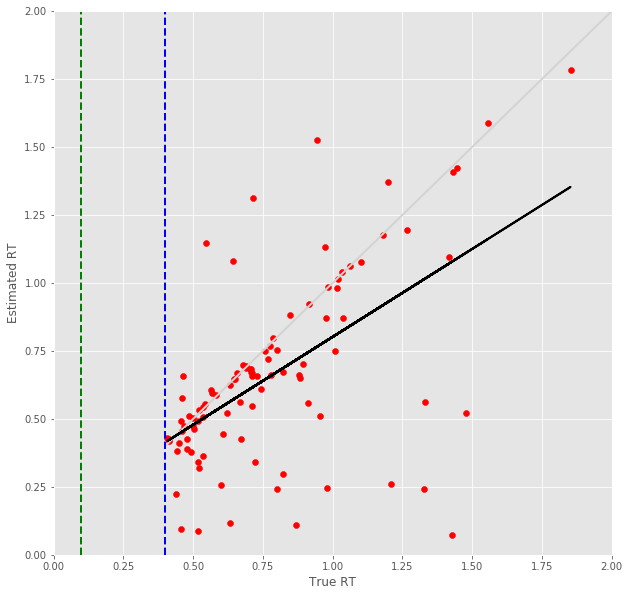

9 -step(s) forecast:
Test Score for 9 -steps forecast: 0.2204 RMSE
Predict Score for 9 -steps forecast: 0.2217 RMSE
Error Test Score for 9 -steps forecast: 0.4094 RMSE
RT Test Score for 9 -steps forecast: 0.3794 RMSE
Error Test Corr for 9 -steps forecast: 0.7521
RT Test Corr for 9 -steps forecast: 0.5041


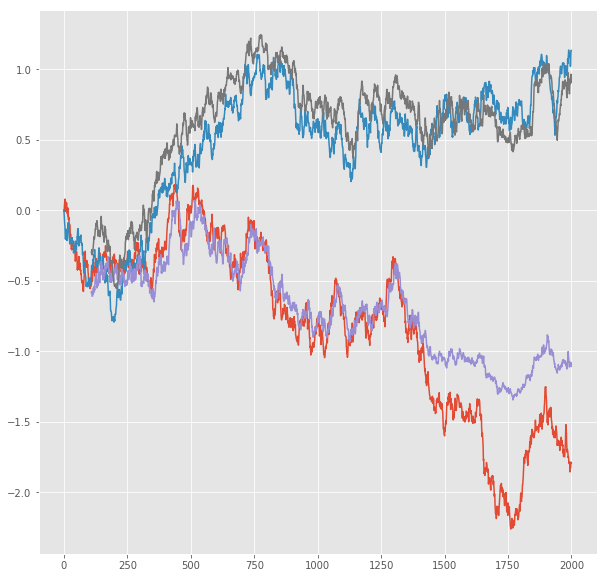

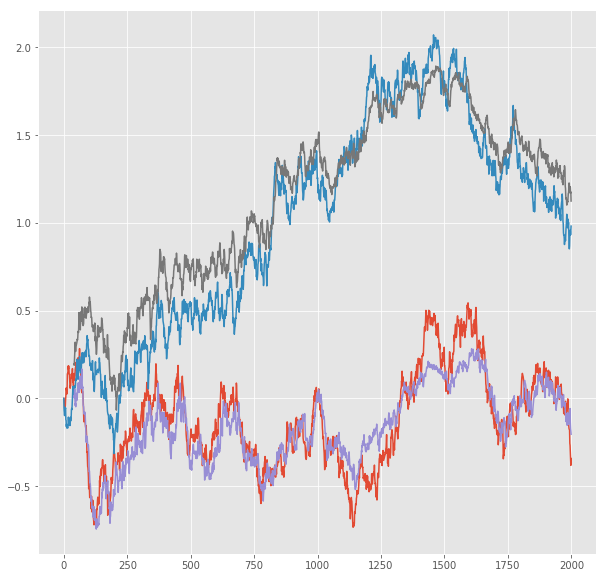

R^2 score for regression on Error: 0.5657
k = 0.6961


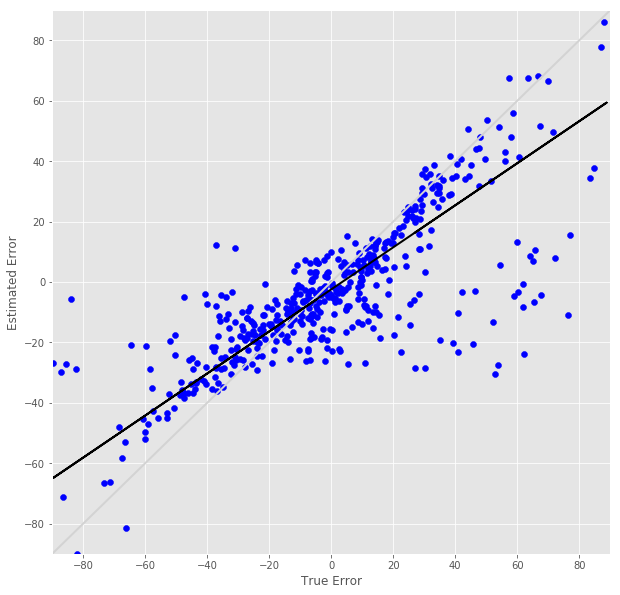

R^2 score for regression on RT: 0.2541
k = 0.5845


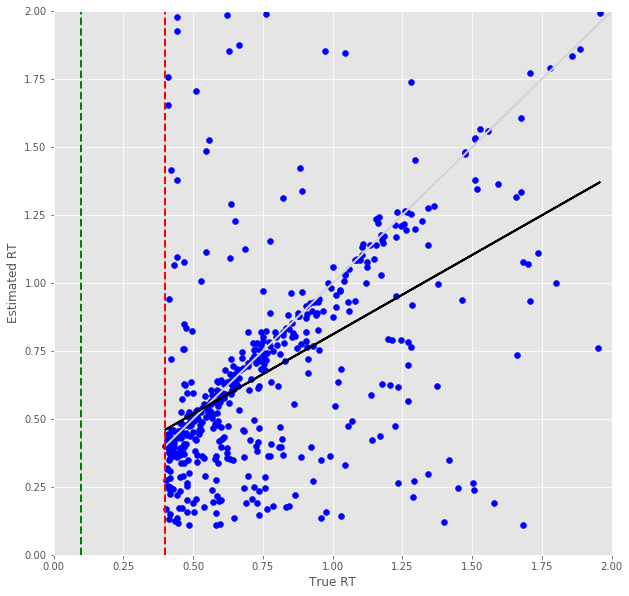

Error Prediction Score: 0.3322 RMSE
RT Prediction Score: 0.3401 RMSE
Error Prediction Corr: 0.8000
RT Prediction Corr: 0.5519
R^2 score for regression on Error: 0.6399
k = 0.6288


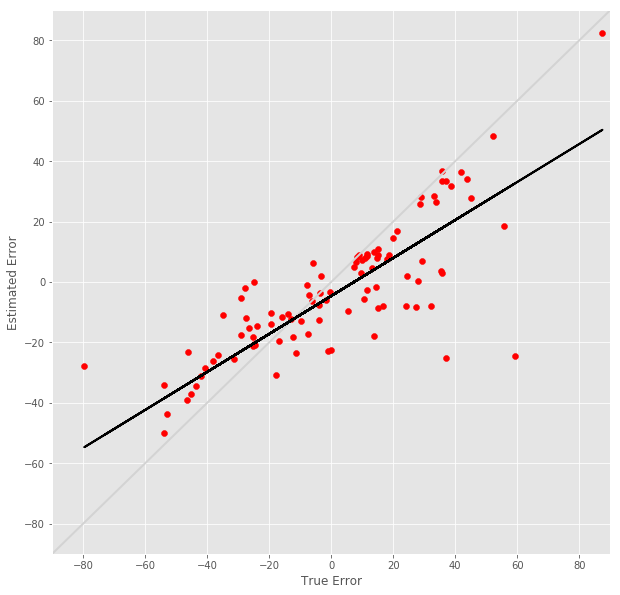

R^2 score for regression on RT: 0.3046
k = 0.6262


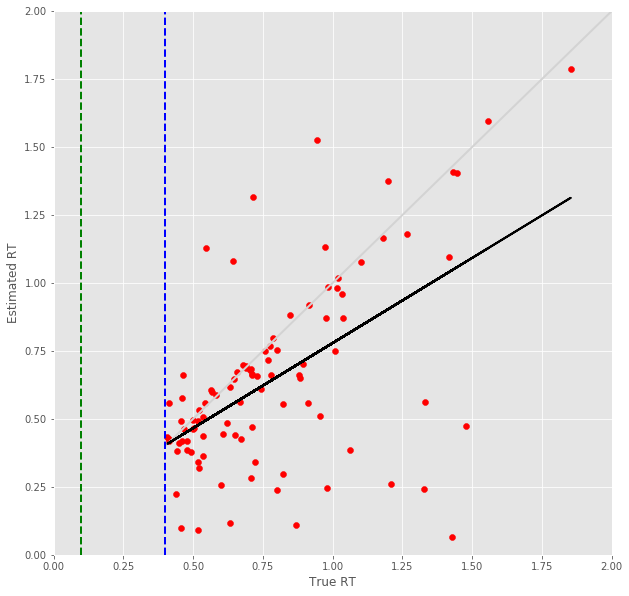

10 -step(s) forecast:
Test Score for 10 -steps forecast: 0.2384 RMSE
Predict Score for 10 -steps forecast: 0.2397 RMSE
Error Test Score for 10 -steps forecast: 0.4220 RMSE
RT Test Score for 10 -steps forecast: 0.4054 RMSE
Error Test Corr for 10 -steps forecast: 0.7223
RT Test Corr for 10 -steps forecast: 0.4564


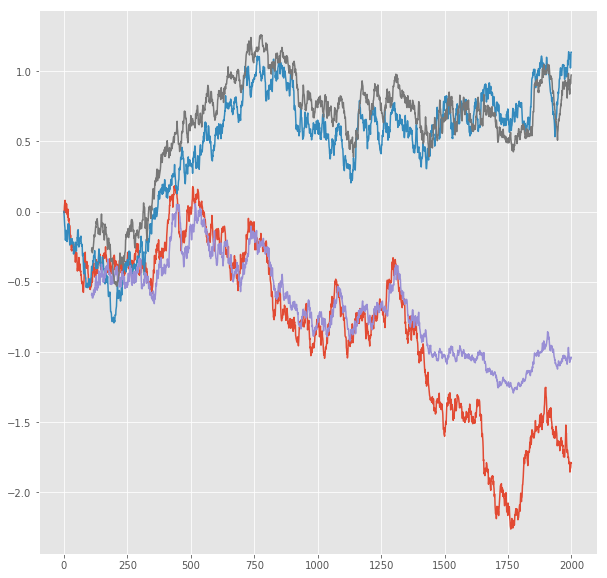

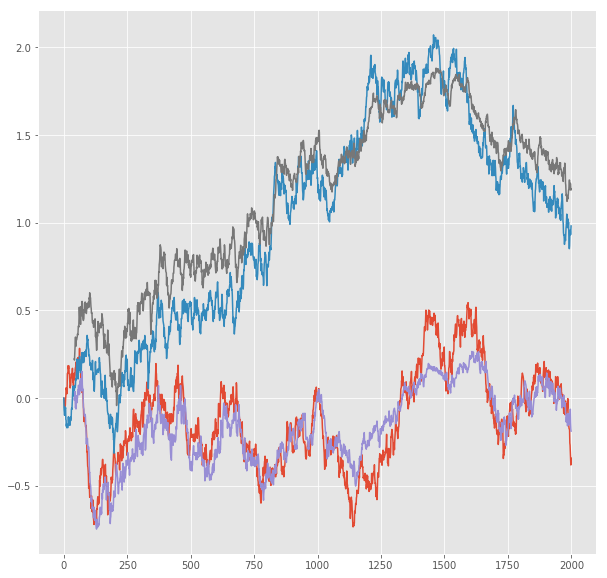

R^2 score for regression on Error: 0.5217
k = 0.6135


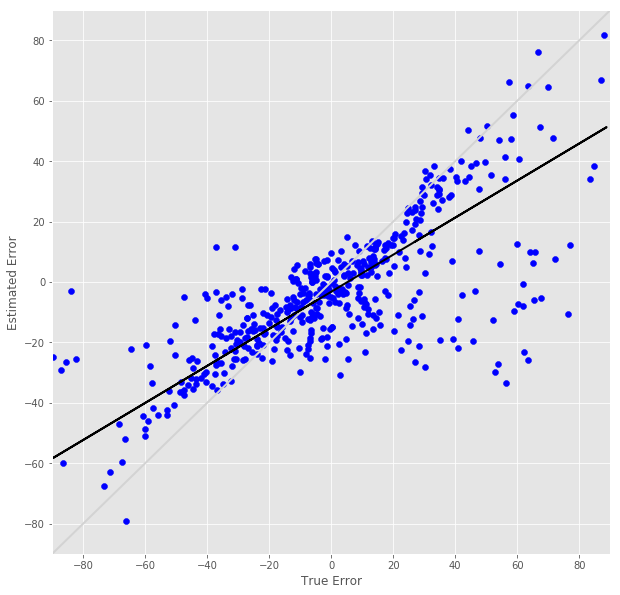

R^2 score for regression on RT: 0.2083
k = 0.5382


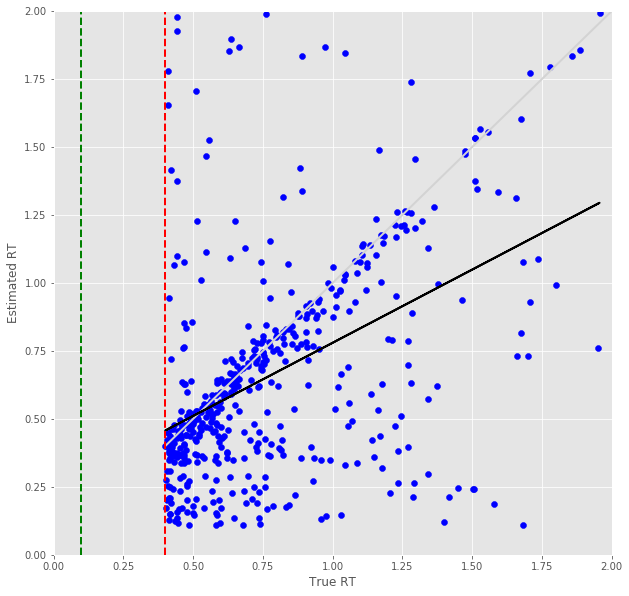

Error Prediction Score: 0.3782 RMSE
RT Prediction Score: 0.3786 RMSE
Error Prediction Corr: 0.7395
RT Prediction Corr: 0.4727
R^2 score for regression on Error: 0.5468
k = 0.5373


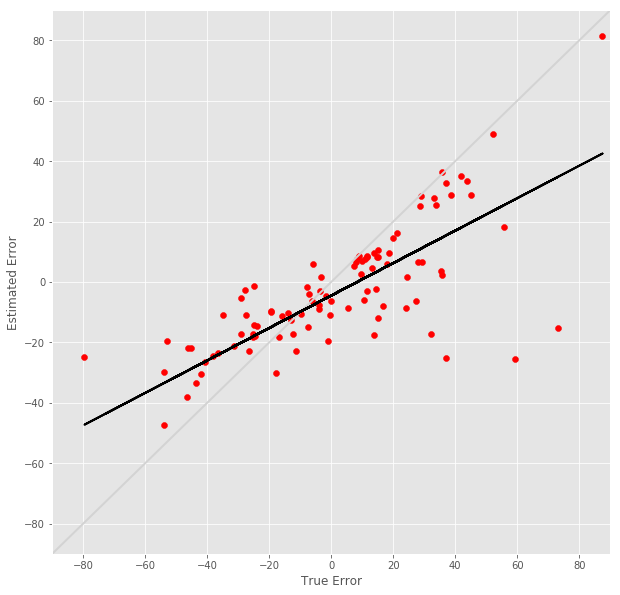

R^2 score for regression on RT: 0.2235
k = 0.5720


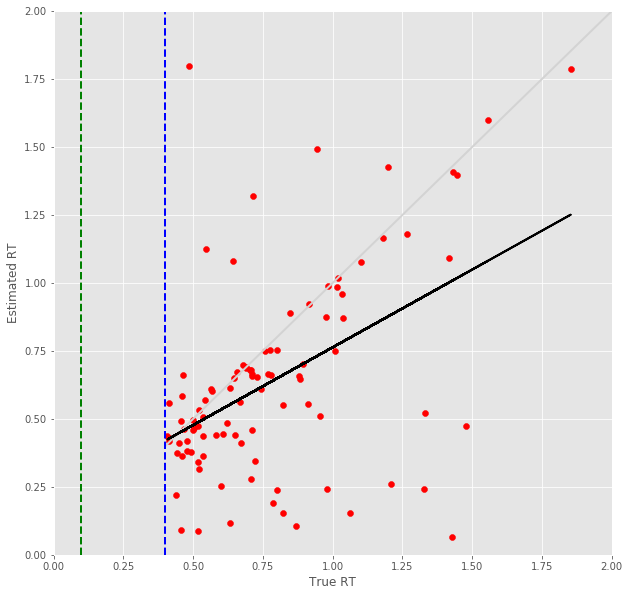

11 -step(s) forecast:
Test Score for 11 -steps forecast: 0.2560 RMSE
Predict Score for 11 -steps forecast: 0.2571 RMSE
Error Test Score for 11 -steps forecast: 0.4352 RMSE
RT Test Score for 11 -steps forecast: 0.4218 RMSE
Error Test Corr for 11 -steps forecast: 0.7030
RT Test Corr for 11 -steps forecast: 0.4213


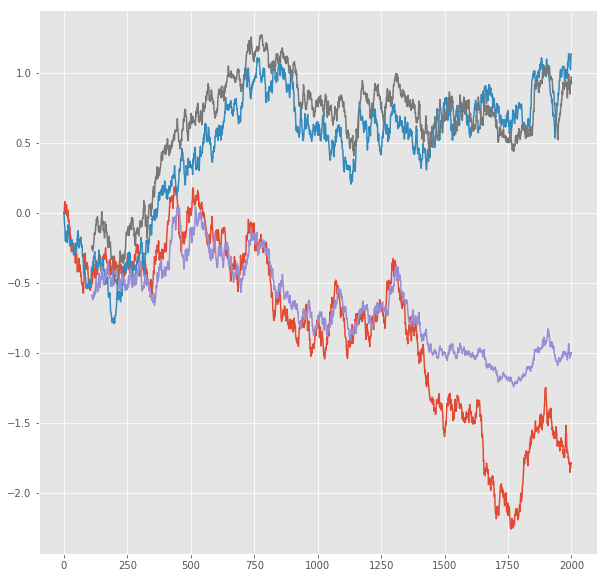

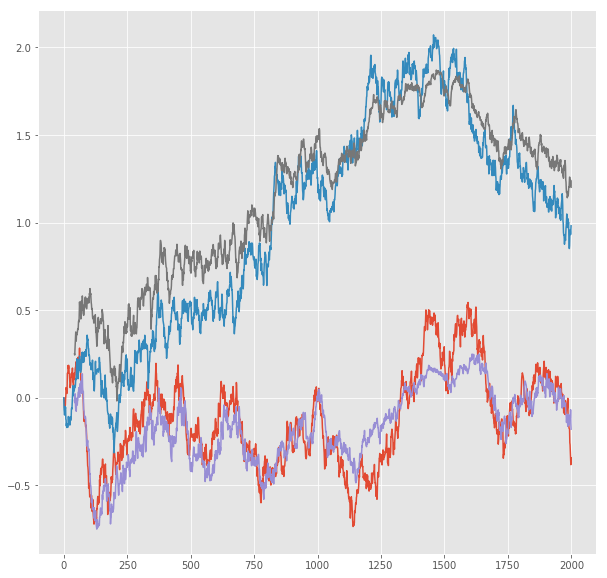

R^2 score for regression on Error: 0.4943
k = 0.5957


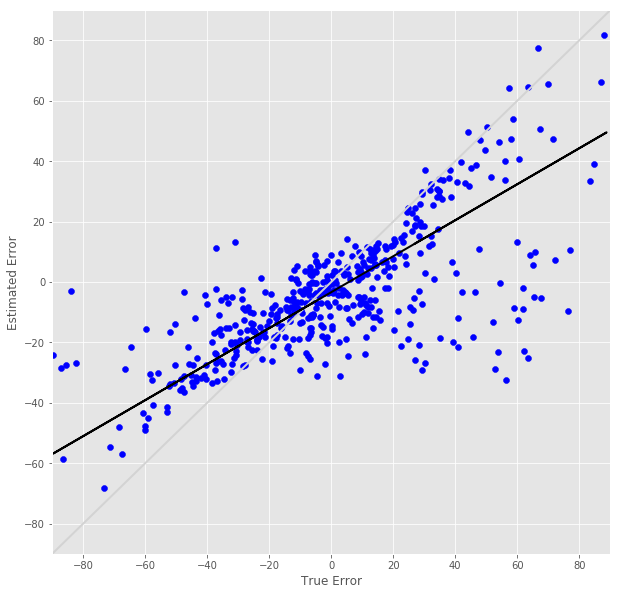

R^2 score for regression on RT: 0.1775
k = 0.5005


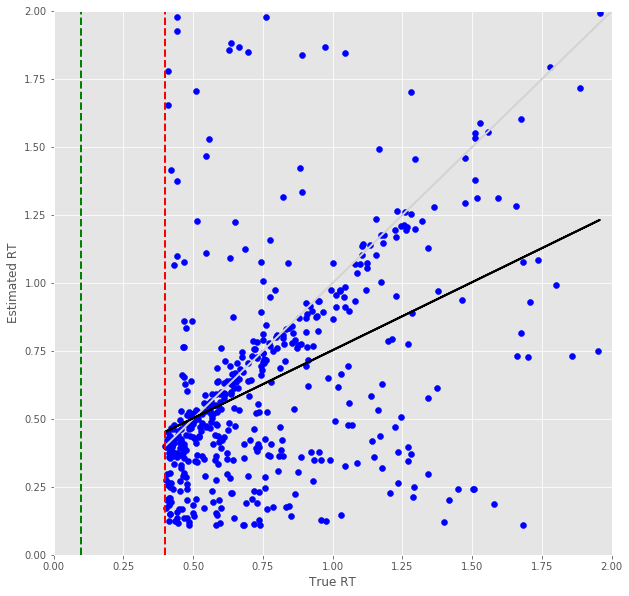

Error Prediction Score: 0.4048 RMSE
RT Prediction Score: 0.4066 RMSE
Error Prediction Corr: 0.6954
RT Prediction Corr: 0.4175
R^2 score for regression on Error: 0.4835
k = 0.4945


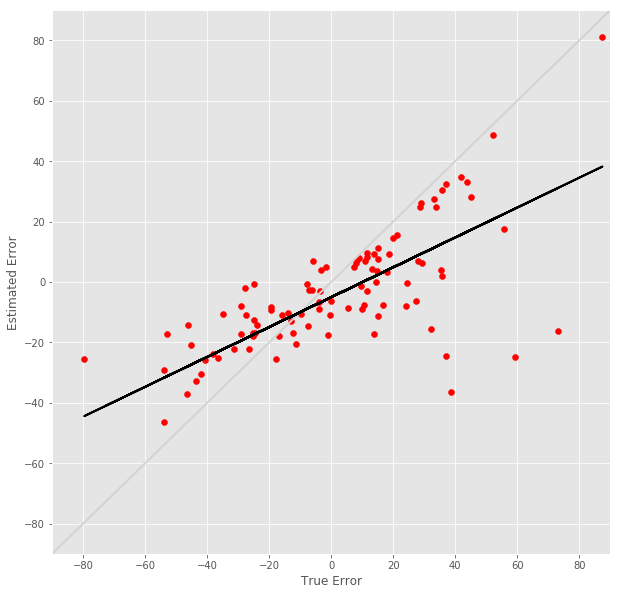

R^2 score for regression on RT: 0.1743
k = 0.5360


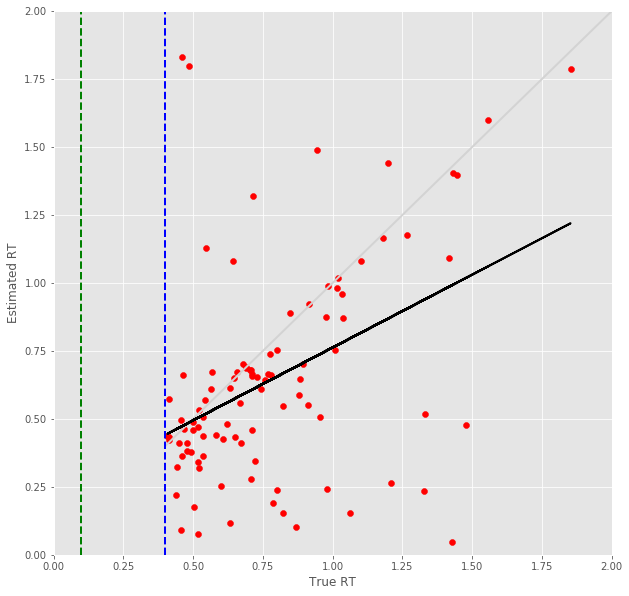

12 -step(s) forecast:
Test Score for 12 -steps forecast: 0.2731 RMSE
Predict Score for 12 -steps forecast: 0.2741 RMSE
Error Test Score for 12 -steps forecast: 0.4493 RMSE
RT Test Score for 12 -steps forecast: 0.4508 RMSE
Error Test Corr for 12 -steps forecast: 0.6656
RT Test Corr for 12 -steps forecast: 0.3647


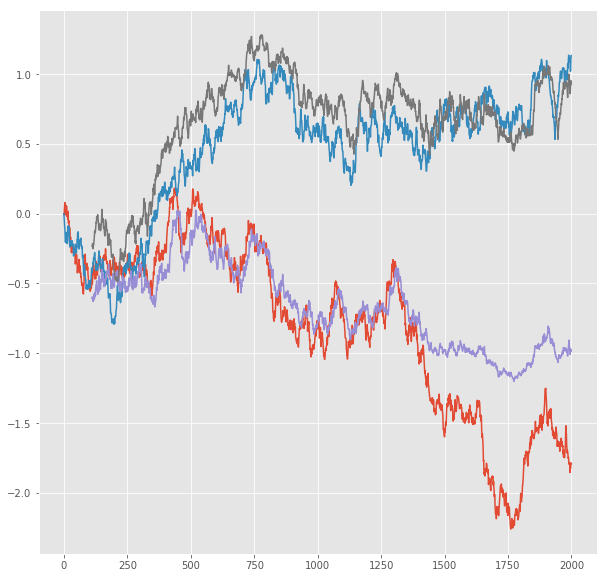

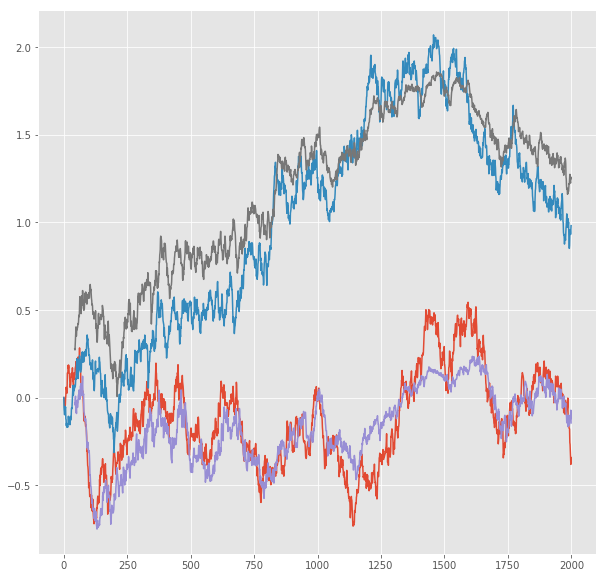

R^2 score for regression on Error: 0.4431
k = 0.5235


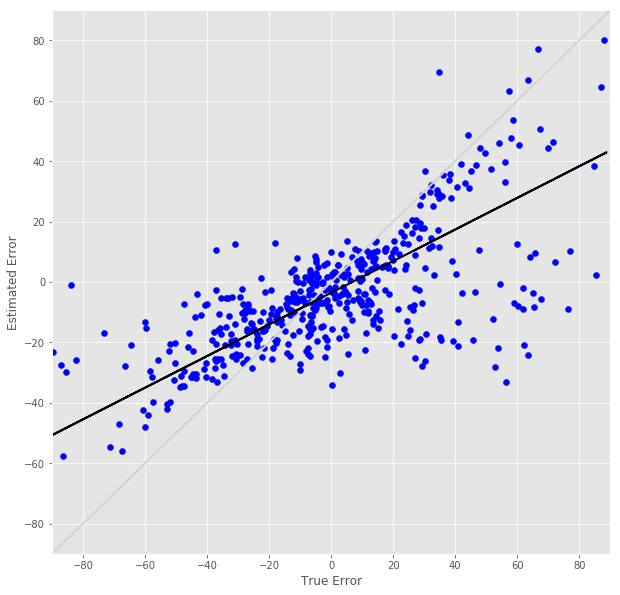

R^2 score for regression on RT: 0.1330
k = 0.4265


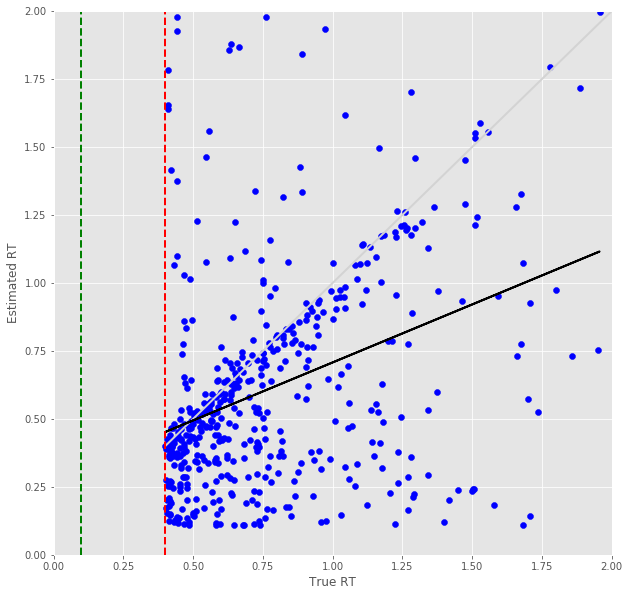

Error Prediction Score: 0.4203 RMSE
RT Prediction Score: 0.4182 RMSE
Error Prediction Corr: 0.6586
RT Prediction Corr: 0.4010
R^2 score for regression on Error: 0.4338
k = 0.4490


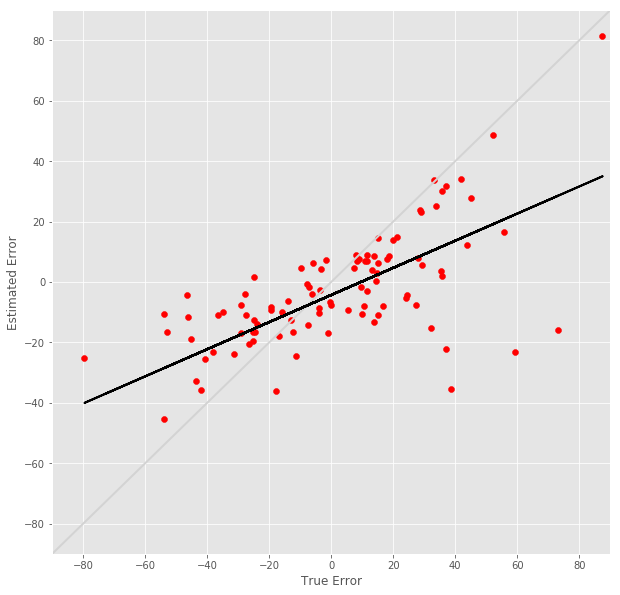

R^2 score for regression on RT: 0.1608
k = 0.5160


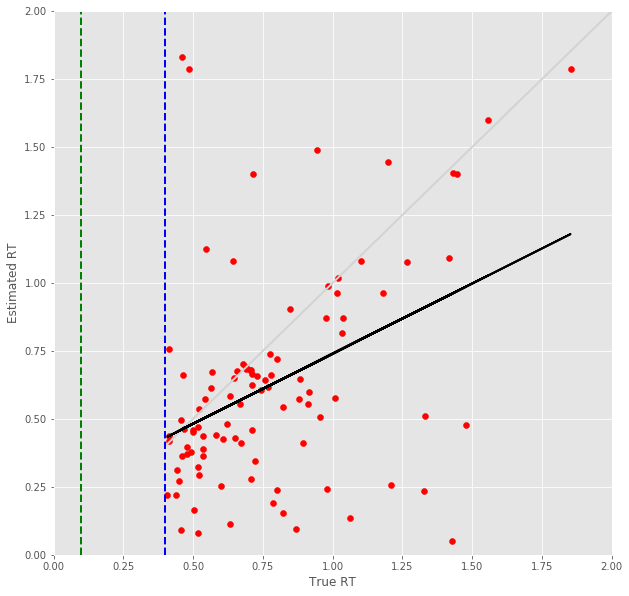

13 -step(s) forecast:
Test Score for 13 -steps forecast: 0.2899 RMSE
Predict Score for 13 -steps forecast: 0.2908 RMSE
Error Test Score for 13 -steps forecast: 0.4607 RMSE
RT Test Score for 13 -steps forecast: 0.4618 RMSE
Error Test Corr for 13 -steps forecast: 0.6444
RT Test Corr for 13 -steps forecast: 0.3450


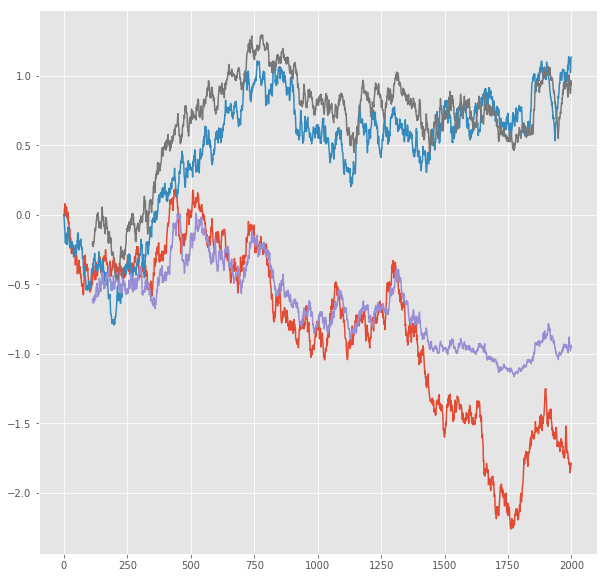

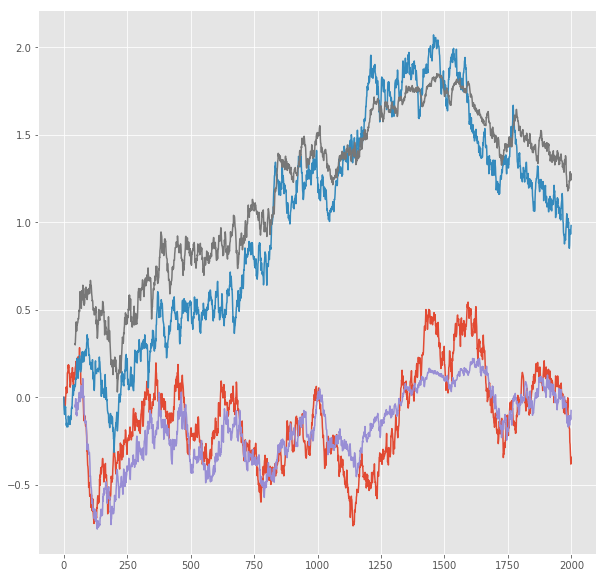

R^2 score for regression on Error: 0.4152
k = 0.4957


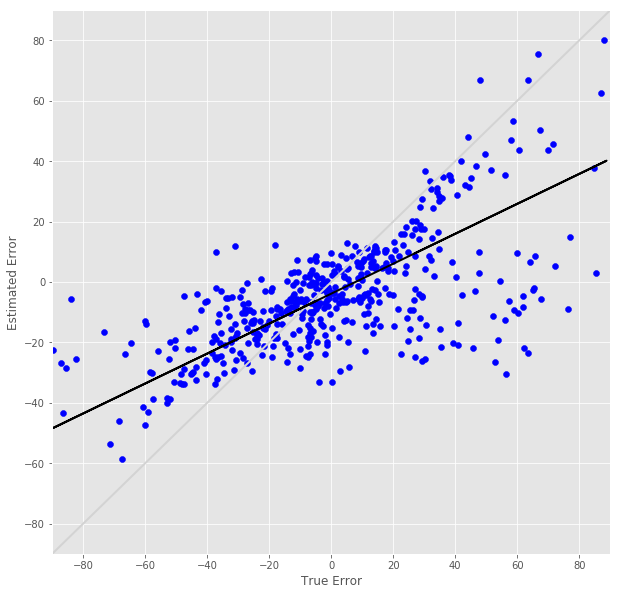

R^2 score for regression on RT: 0.1190
k = 0.4023


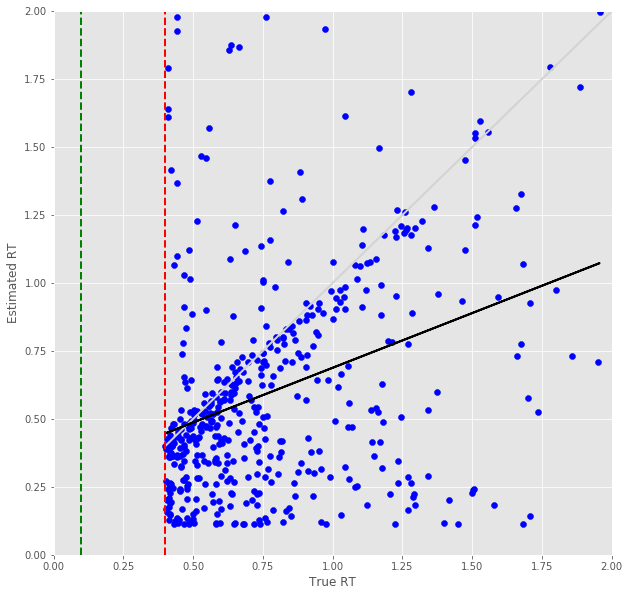

Error Prediction Score: 0.4593 RMSE
RT Prediction Score: 0.4529 RMSE
Error Prediction Corr: 0.6081
RT Prediction Corr: 0.3672
R^2 score for regression on Error: 0.3698
k = 0.4815


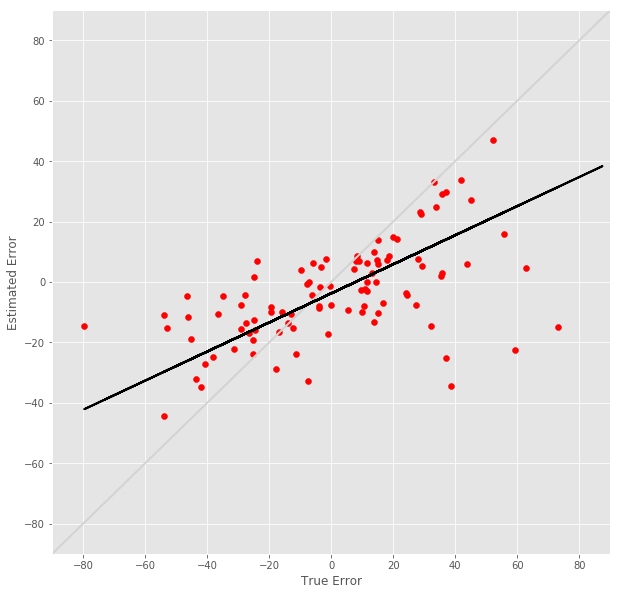

R^2 score for regression on RT: 0.1348
k = 0.5206


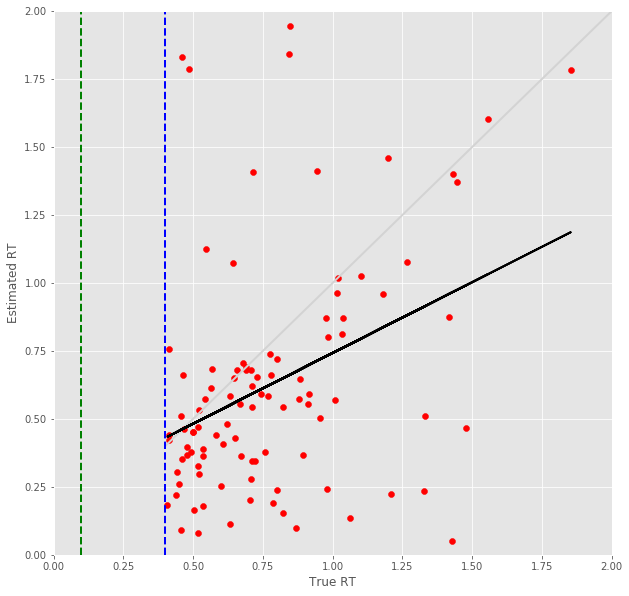

14 -step(s) forecast:
Test Score for 14 -steps forecast: 0.3063 RMSE
Predict Score for 14 -steps forecast: 0.3071 RMSE
Error Test Score for 14 -steps forecast: 0.4824 RMSE
RT Test Score for 14 -steps forecast: 0.4819 RMSE
Error Test Corr for 14 -steps forecast: 0.6155
RT Test Corr for 14 -steps forecast: 0.3150


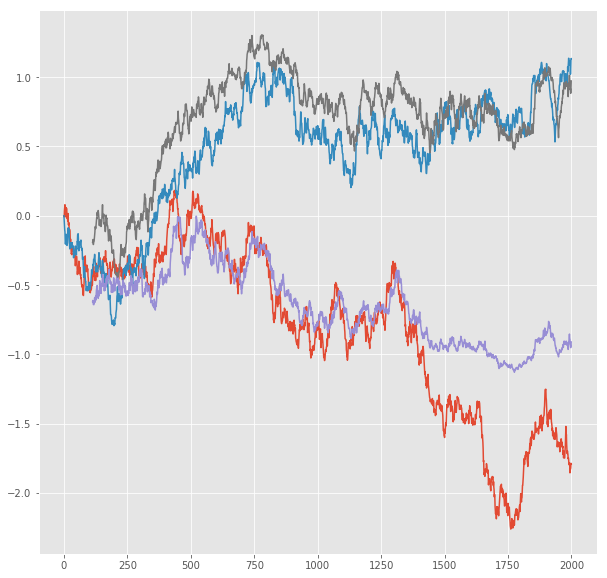

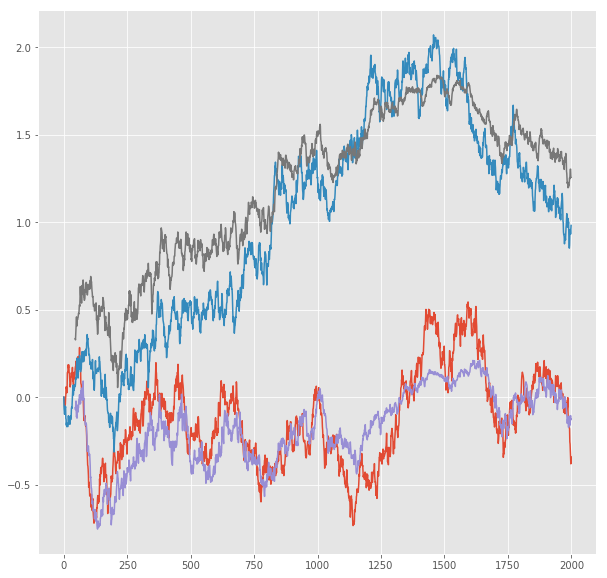

R^2 score for regression on Error: 0.3789
k = 0.4737


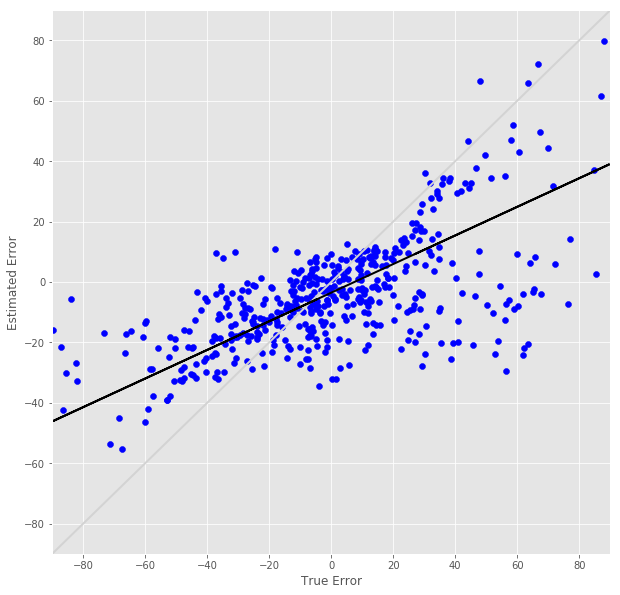

R^2 score for regression on RT: 0.0992
k = 0.3635


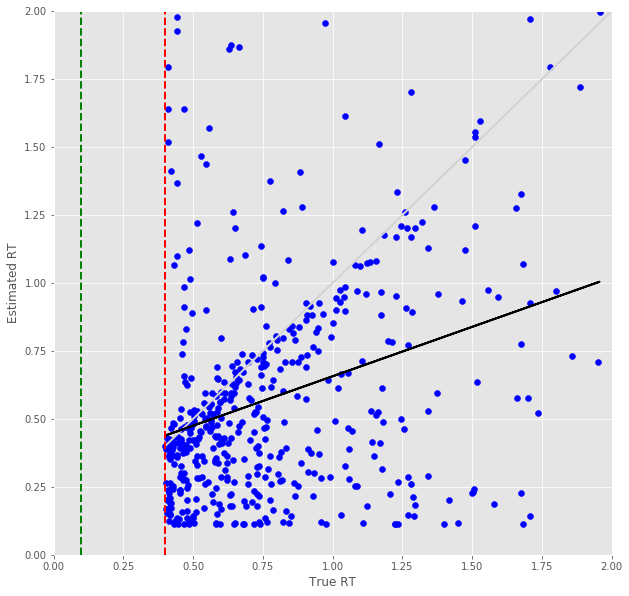

Error Prediction Score: 0.4753 RMSE
RT Prediction Score: 0.4895 RMSE
Error Prediction Corr: 0.5737
RT Prediction Corr: 0.2603
R^2 score for regression on Error: 0.3291
k = 0.4398


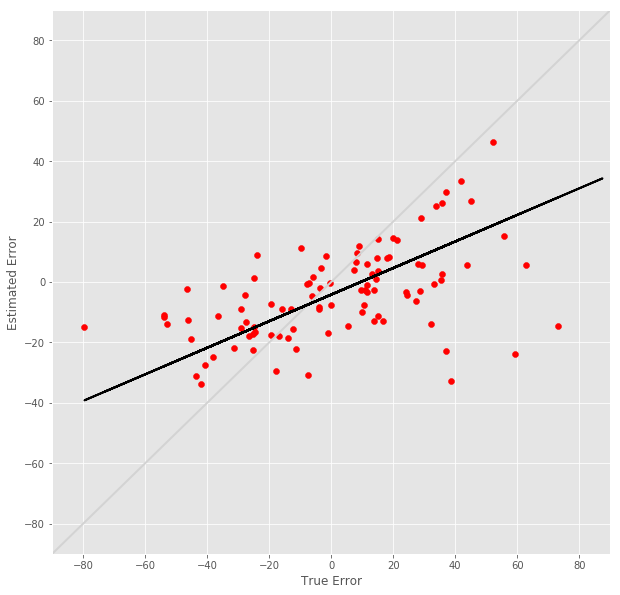

R^2 score for regression on RT: 0.0678
k = 0.3605


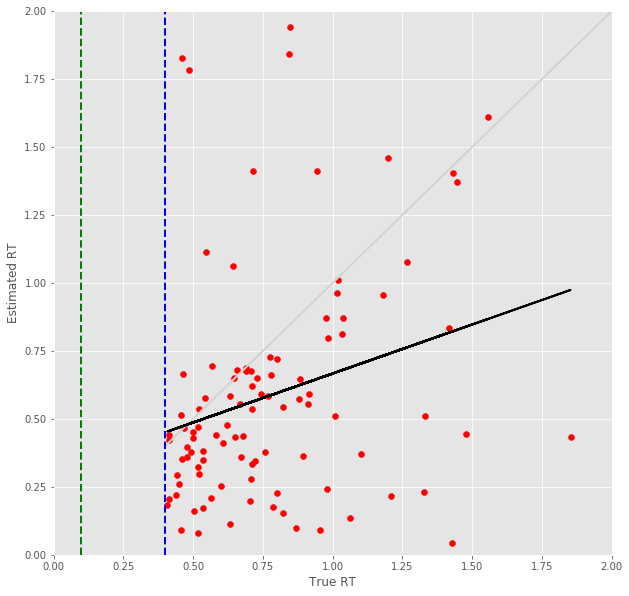

15 -step(s) forecast:
Test Score for 15 -steps forecast: 0.3223 RMSE
Predict Score for 15 -steps forecast: 0.3231 RMSE
Error Test Score for 15 -steps forecast: 0.5018 RMSE
RT Test Score for 15 -steps forecast: 0.4986 RMSE
Error Test Corr for 15 -steps forecast: 0.5871
RT Test Corr for 15 -steps forecast: 0.2690


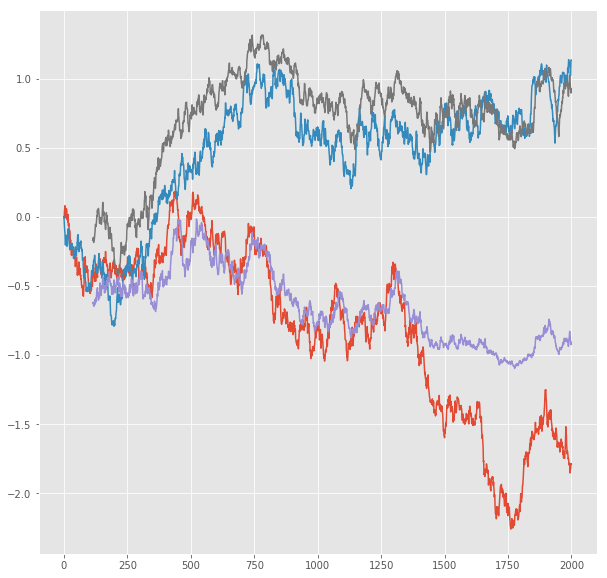

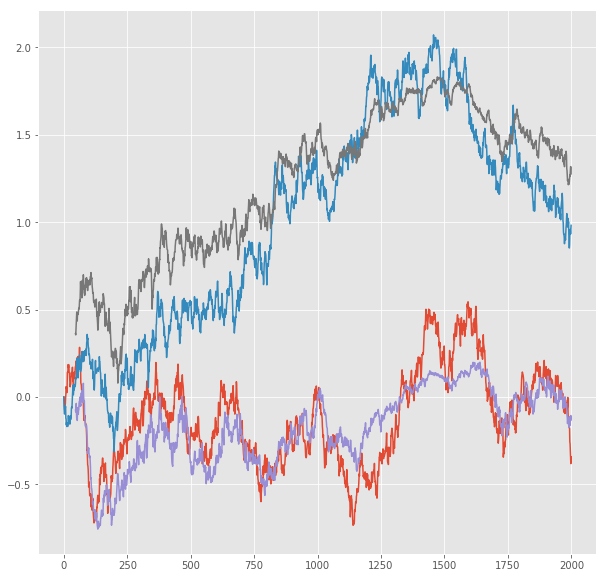

R^2 score for regression on Error: 0.3447
k = 0.4522


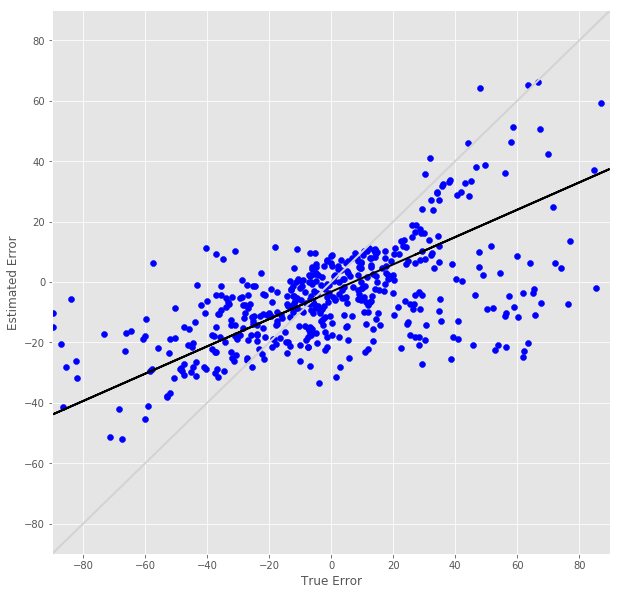

R^2 score for regression on RT: 0.0724
k = 0.2863


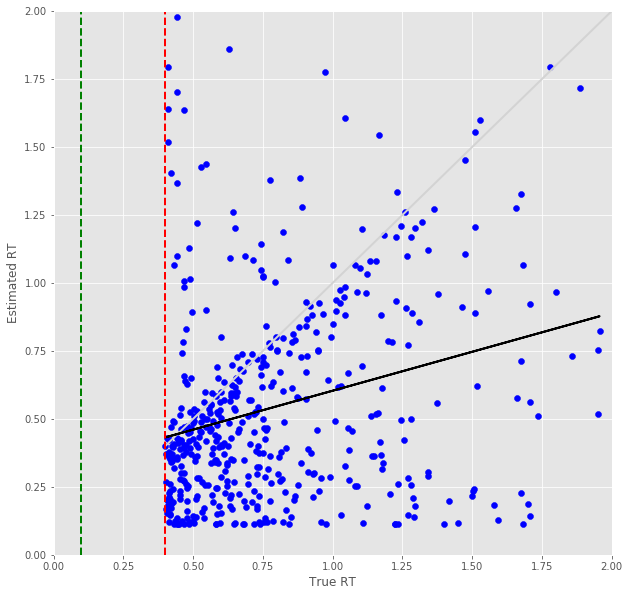

Error Prediction Score: 0.4863 RMSE
RT Prediction Score: 0.5189 RMSE
Error Prediction Corr: 0.5528
RT Prediction Corr: 0.1813
R^2 score for regression on Error: 0.3056
k = 0.4132


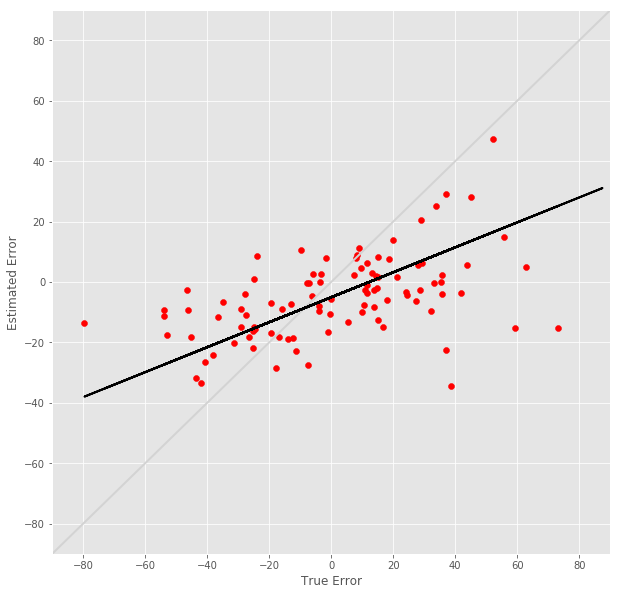

R^2 score for regression on RT: 0.0329
k = 0.2516


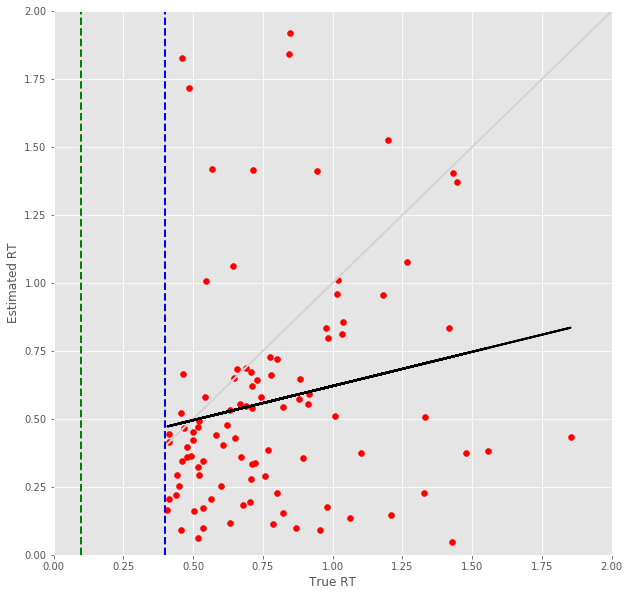

16 -step(s) forecast:
Test Score for 16 -steps forecast: 0.3381 RMSE
Predict Score for 16 -steps forecast: 0.3388 RMSE
Error Test Score for 16 -steps forecast: 0.5131 RMSE
RT Test Score for 16 -steps forecast: 0.5116 RMSE
Error Test Corr for 16 -steps forecast: 0.5795
RT Test Corr for 16 -steps forecast: 0.2523


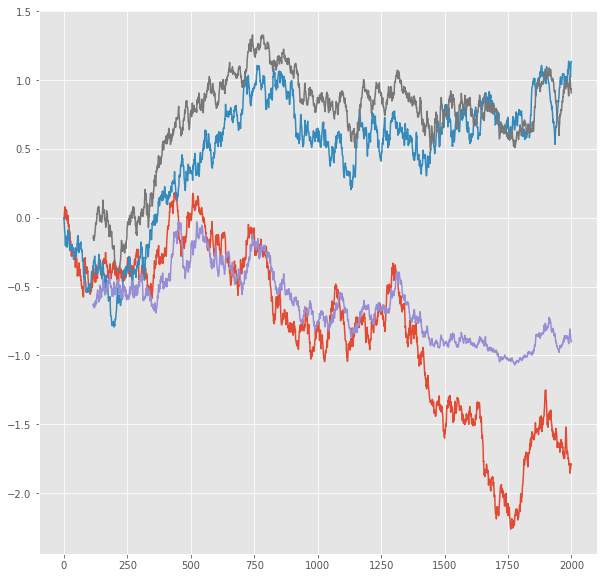

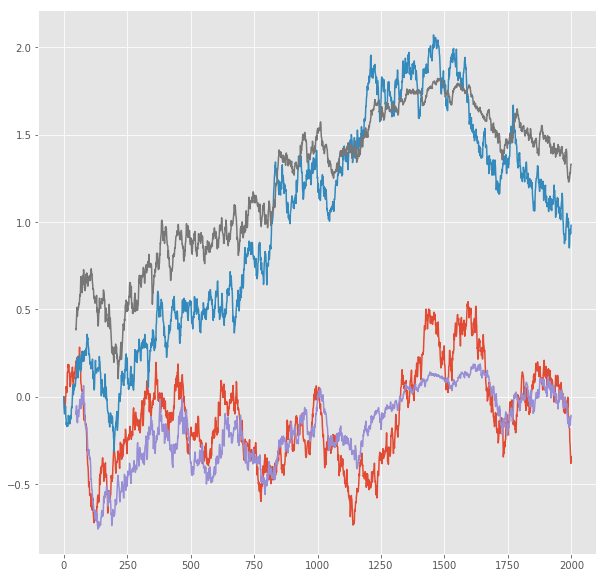

R^2 score for regression on Error: 0.3358
k = 0.4526


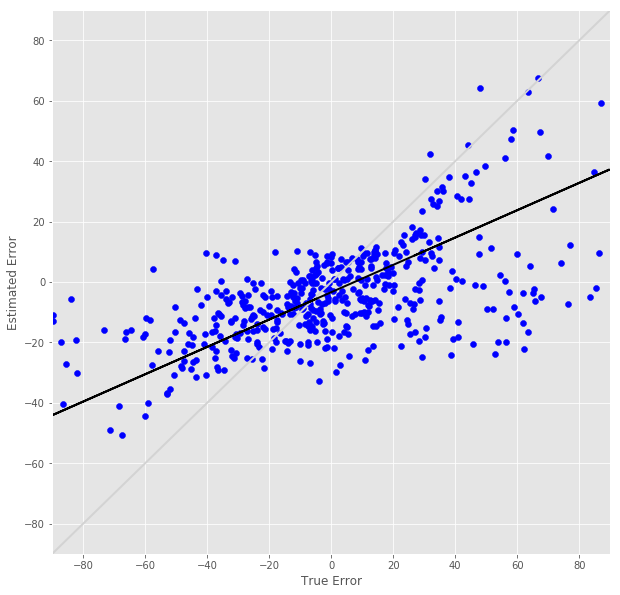

R^2 score for regression on RT: 0.0637
k = 0.2650


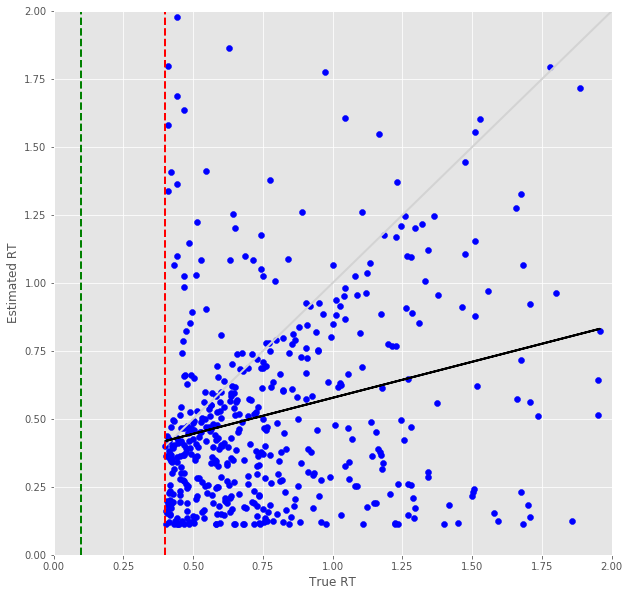

Error Prediction Score: 0.4917 RMSE
RT Prediction Score: 0.5313 RMSE
Error Prediction Corr: 0.5395
RT Prediction Corr: 0.1686
R^2 score for regression on Error: 0.2911
k = 0.4020


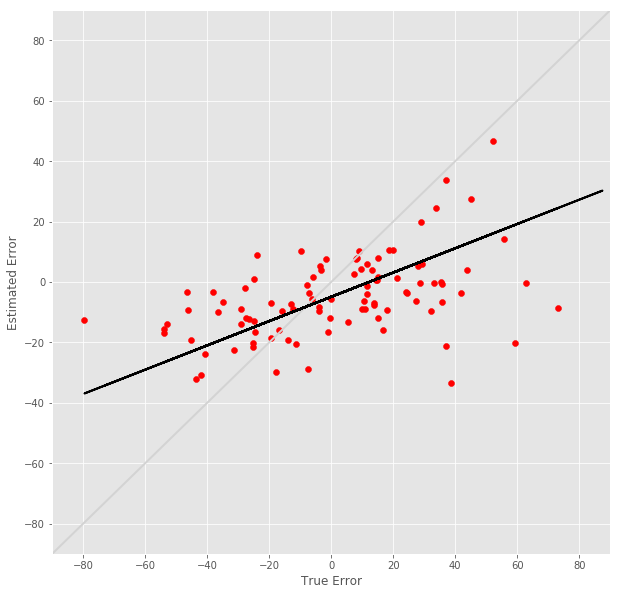

R^2 score for regression on RT: 0.0284
k = 0.2305


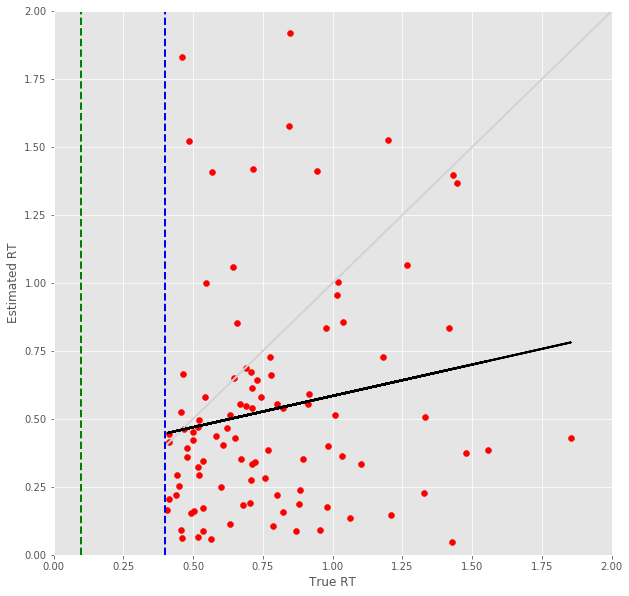

17 -step(s) forecast:
Test Score for 17 -steps forecast: 0.3536 RMSE
Predict Score for 17 -steps forecast: 0.3542 RMSE
Error Test Score for 17 -steps forecast: 0.5202 RMSE
RT Test Score for 17 -steps forecast: 0.5418 RMSE
Error Test Corr for 17 -steps forecast: 0.5699
RT Test Corr for 17 -steps forecast: 0.1855


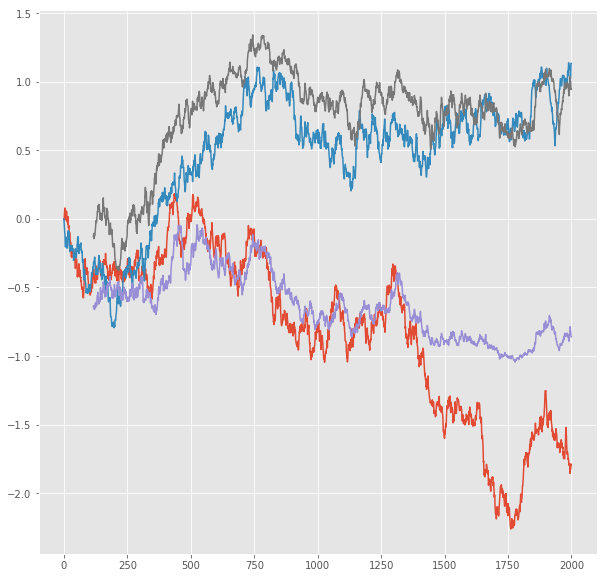

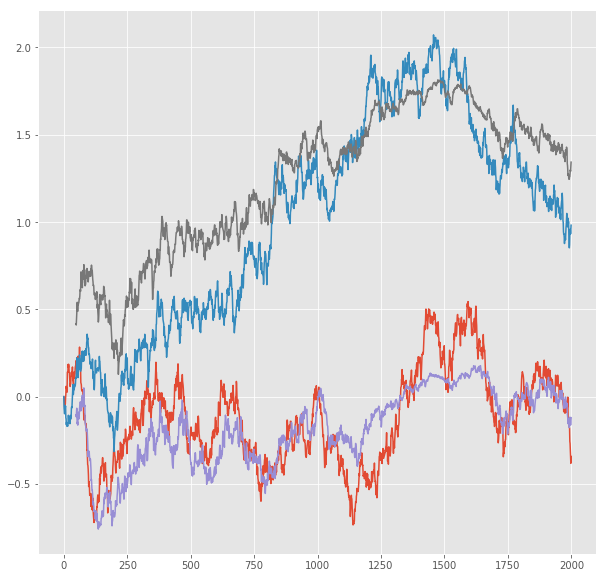

R^2 score for regression on Error: 0.3248
k = 0.4352


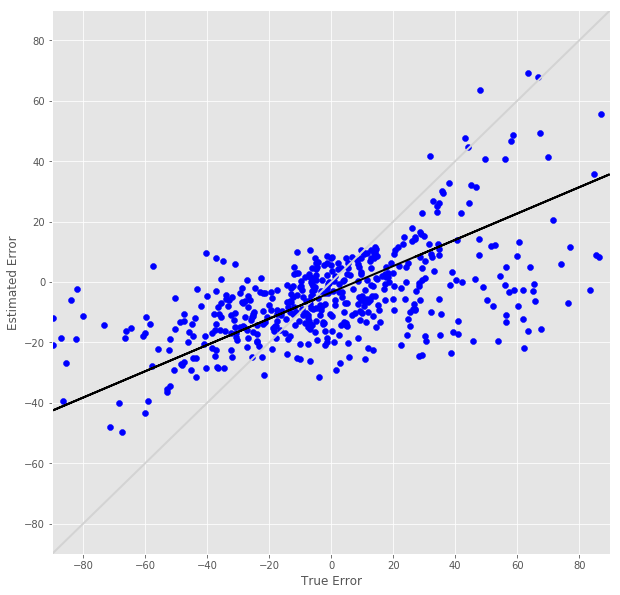

R^2 score for regression on RT: 0.0344
k = 0.1948


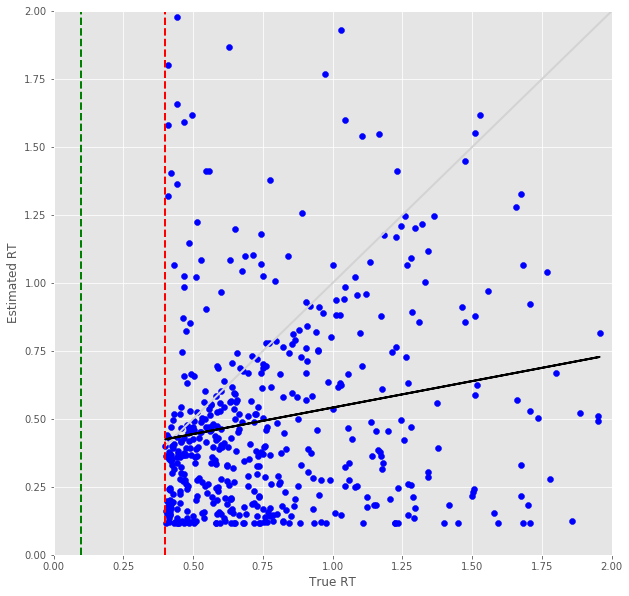

Error Prediction Score: 0.4930 RMSE
RT Prediction Score: 0.5351 RMSE
Error Prediction Corr: 0.5359
RT Prediction Corr: 0.1545
R^2 score for regression on Error: 0.2871
k = 0.3968


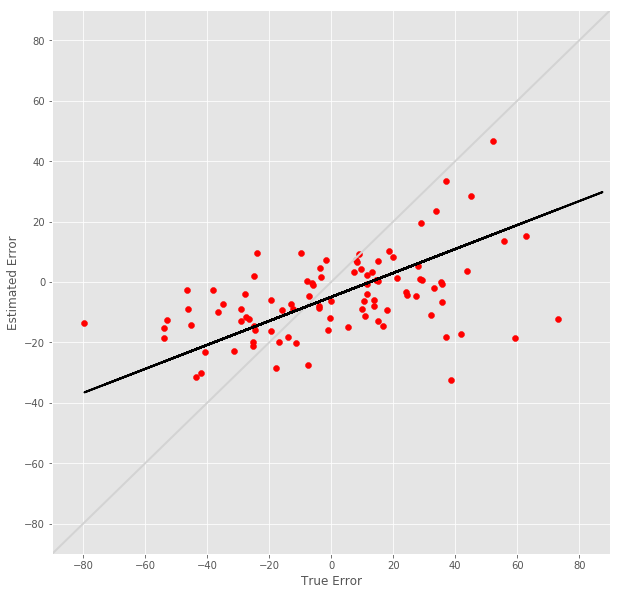

R^2 score for regression on RT: 0.0239
k = 0.2063


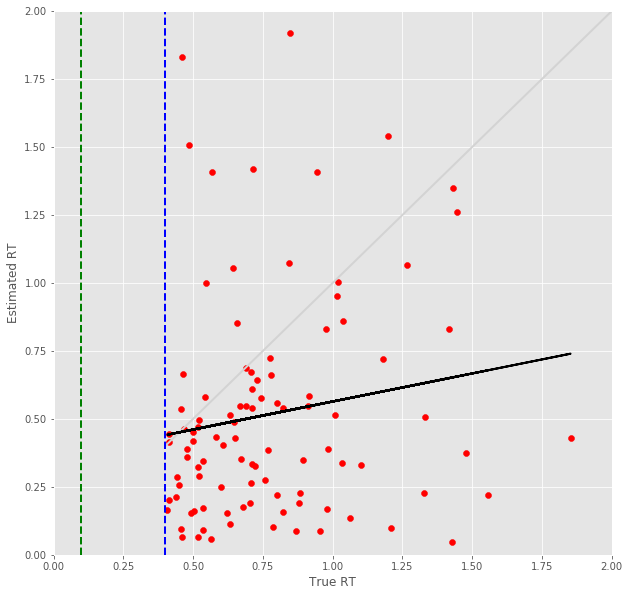

18 -step(s) forecast:
Test Score for 18 -steps forecast: 0.3688 RMSE
Predict Score for 18 -steps forecast: 0.3694 RMSE
Error Test Score for 18 -steps forecast: 0.5256 RMSE
RT Test Score for 18 -steps forecast: 0.5438 RMSE
Error Test Corr for 18 -steps forecast: 0.5570
RT Test Corr for 18 -steps forecast: 0.1946


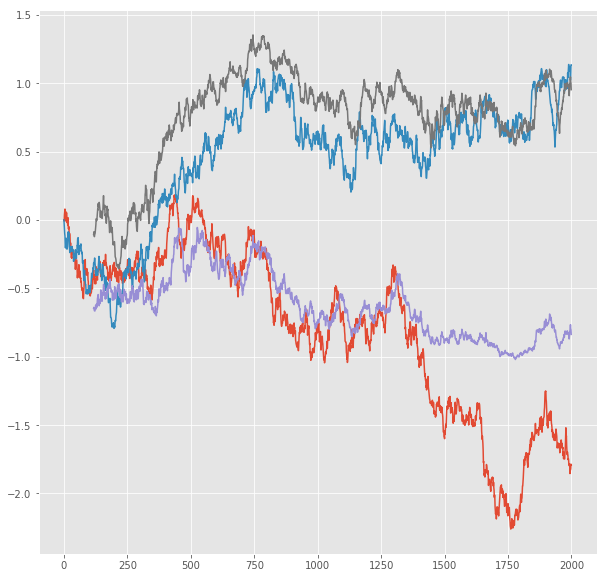

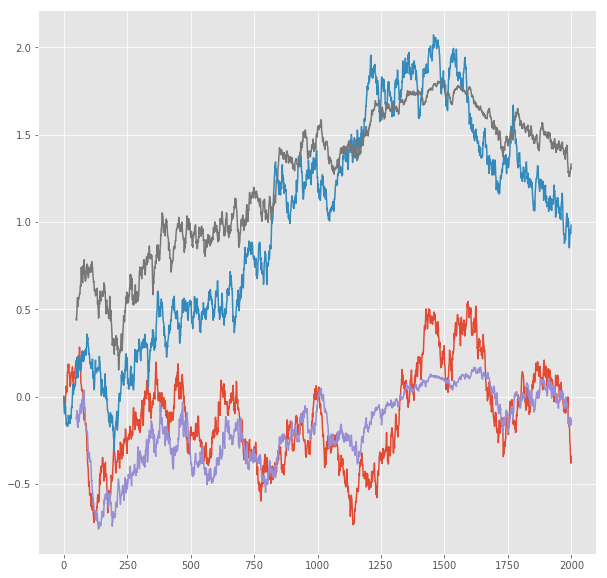

R^2 score for regression on Error: 0.3102
k = 0.4204


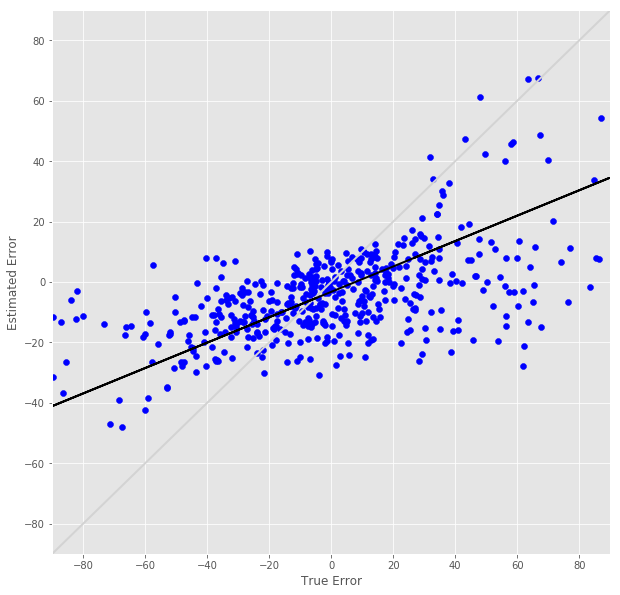

R^2 score for regression on RT: 0.0379
k = 0.1983


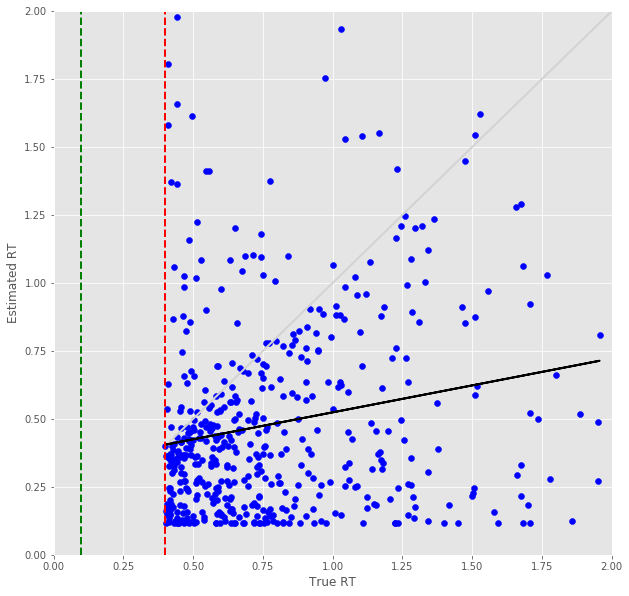

Error Prediction Score: 0.5003 RMSE
RT Prediction Score: 0.5546 RMSE
Error Prediction Corr: 0.5158
RT Prediction Corr: 0.1389
R^2 score for regression on Error: 0.2660
k = 0.3705


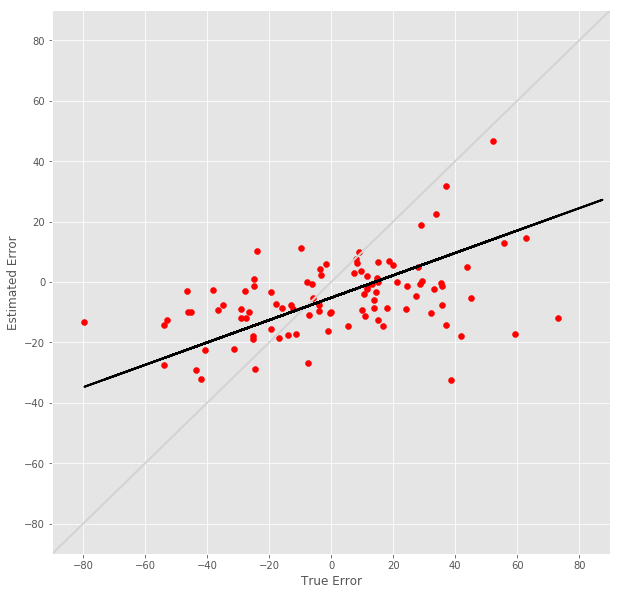

R^2 score for regression on RT: 0.0193
k = 0.1900


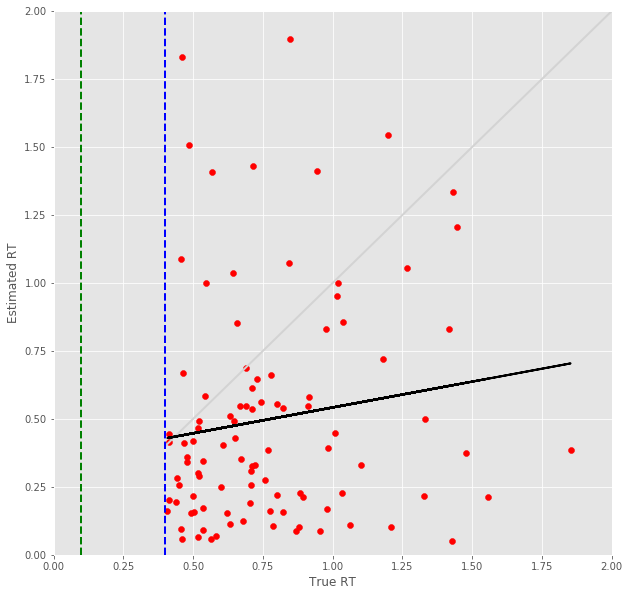

19 -step(s) forecast:
Test Score for 19 -steps forecast: 0.3838 RMSE
Predict Score for 19 -steps forecast: 0.3843 RMSE
Error Test Score for 19 -steps forecast: 0.5372 RMSE
RT Test Score for 19 -steps forecast: 0.5596 RMSE
Error Test Corr for 19 -steps forecast: 0.5310
RT Test Corr for 19 -steps forecast: 0.1605


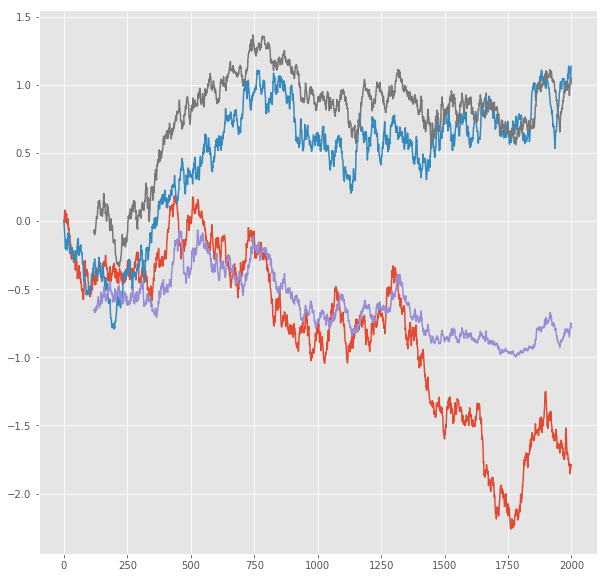

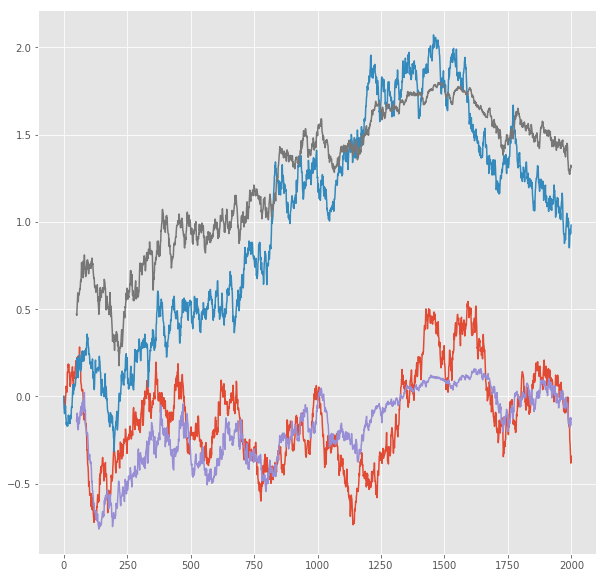

R^2 score for regression on Error: 0.2820
k = 0.3924


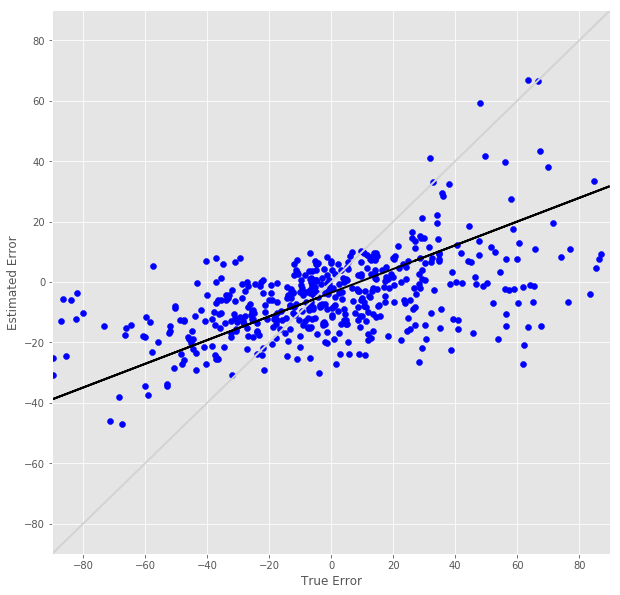

R^2 score for regression on RT: 0.0258
k = 0.1611


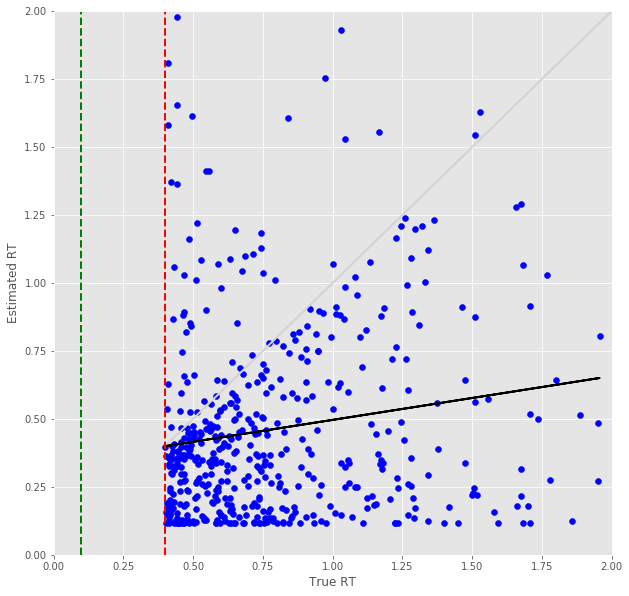

Error Prediction Score: 0.4959 RMSE
RT Prediction Score: 0.5470 RMSE
Error Prediction Corr: 0.5153
RT Prediction Corr: 0.1959
R^2 score for regression on Error: 0.2655
k = 0.3572


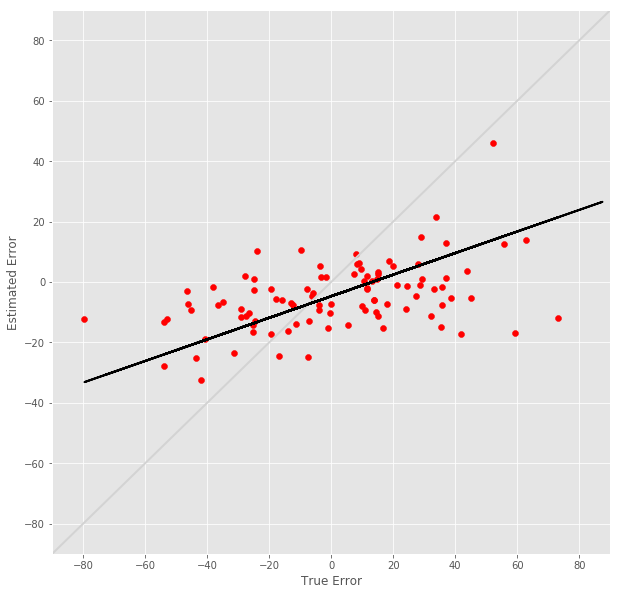

R^2 score for regression on RT: 0.0384
k = 0.2596


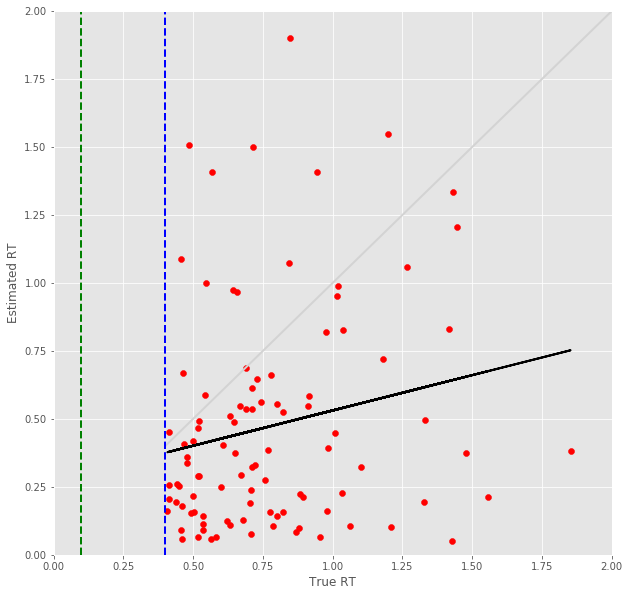

20 -step(s) forecast:
Test Score for 20 -steps forecast: 0.3985 RMSE
Predict Score for 20 -steps forecast: 0.3990 RMSE
Error Test Score for 20 -steps forecast: 0.5490 RMSE
RT Test Score for 20 -steps forecast: 0.5753 RMSE
Error Test Corr for 20 -steps forecast: 0.5048
RT Test Corr for 20 -steps forecast: 0.1288


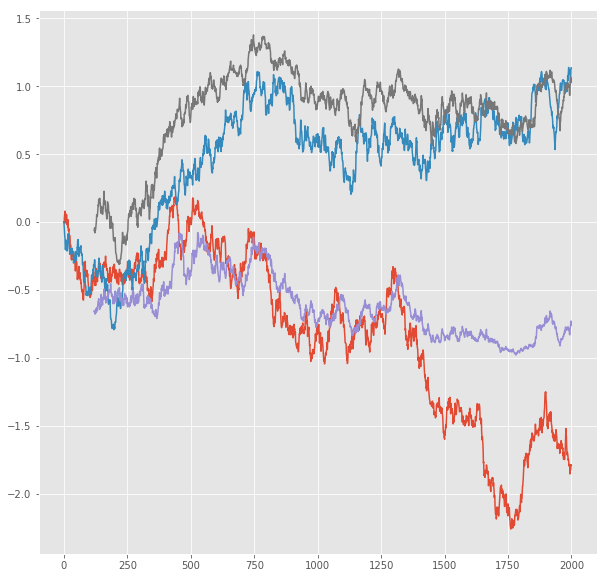

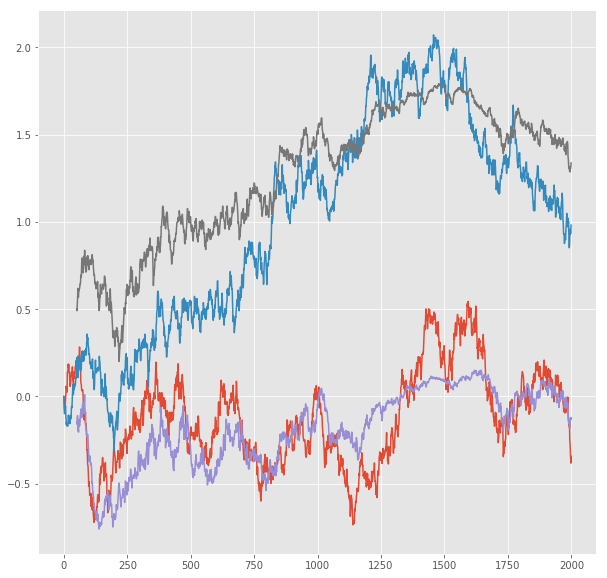

R^2 score for regression on Error: 0.2548
k = 0.3661


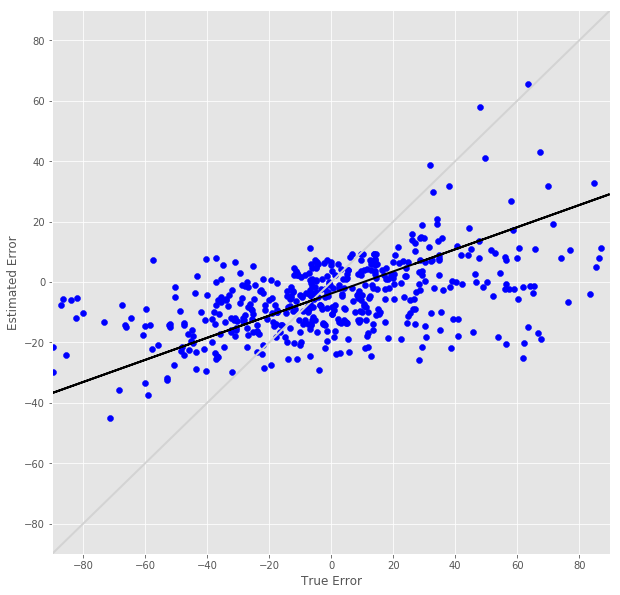

R^2 score for regression on RT: 0.0166
k = 0.1267


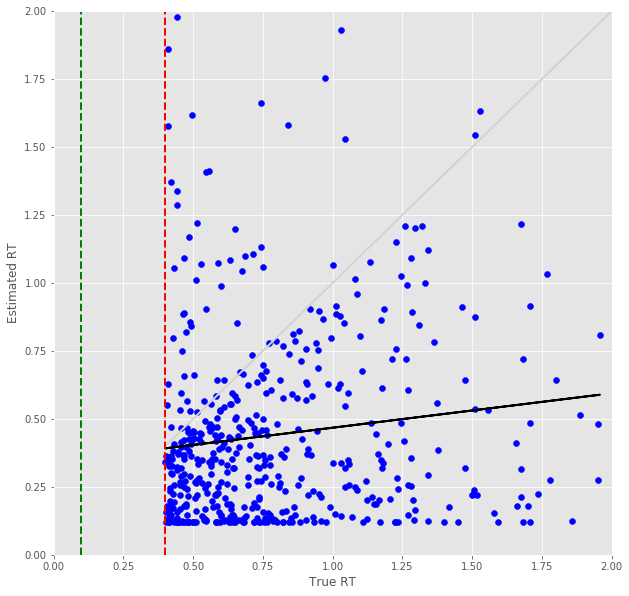

Error Prediction Score: 0.5030 RMSE
RT Prediction Score: 0.5562 RMSE
Error Prediction Corr: 0.4988
RT Prediction Corr: 0.1867
R^2 score for regression on Error: 0.2488
k = 0.3440


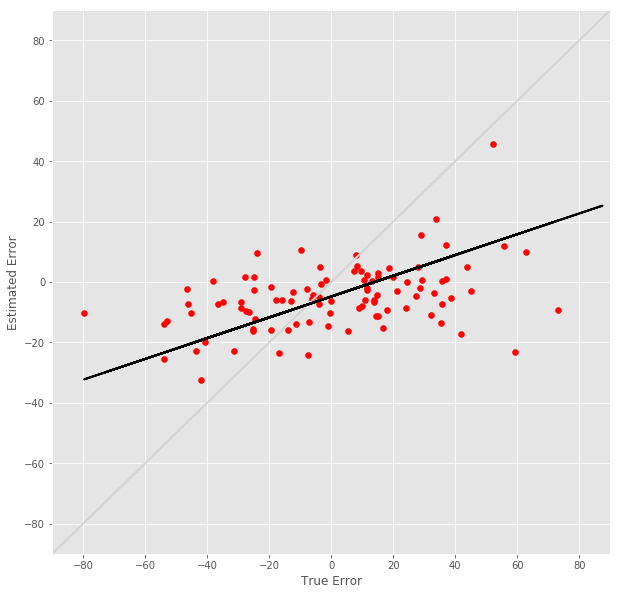

R^2 score for regression on RT: 0.0349
k = 0.2456


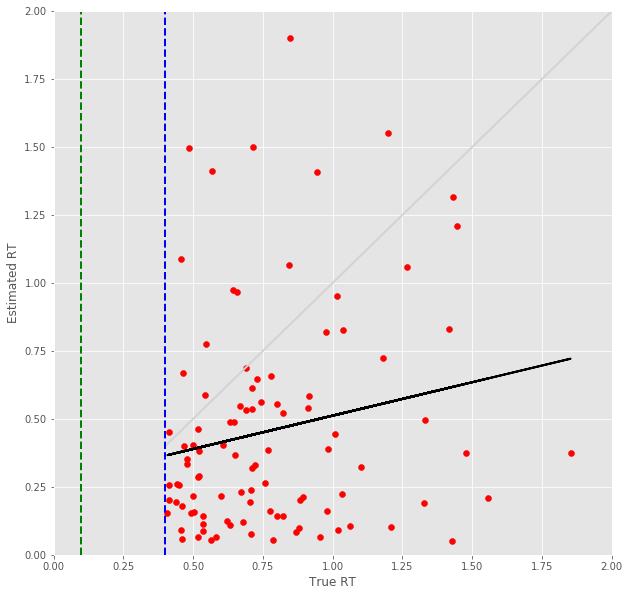

21 -step(s) forecast:
Test Score for 21 -steps forecast: 0.4129 RMSE
Predict Score for 21 -steps forecast: 0.4134 RMSE
Error Test Score for 21 -steps forecast: 0.5588 RMSE
RT Test Score for 21 -steps forecast: 0.5917 RMSE
Error Test Corr for 21 -steps forecast: 0.4784
RT Test Corr for 21 -steps forecast: 0.0800


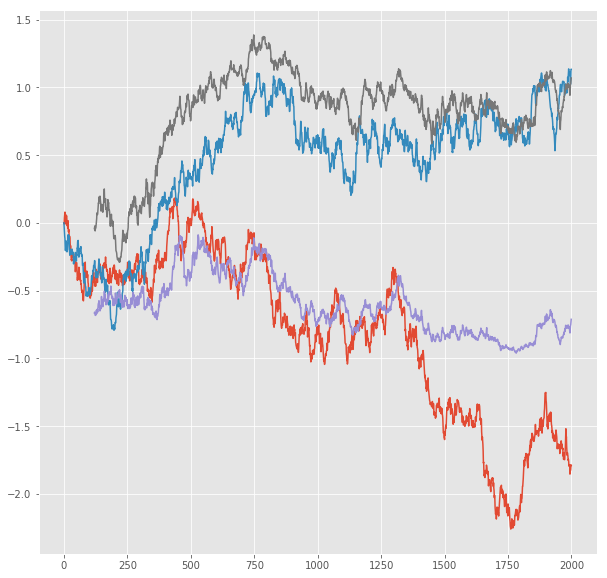

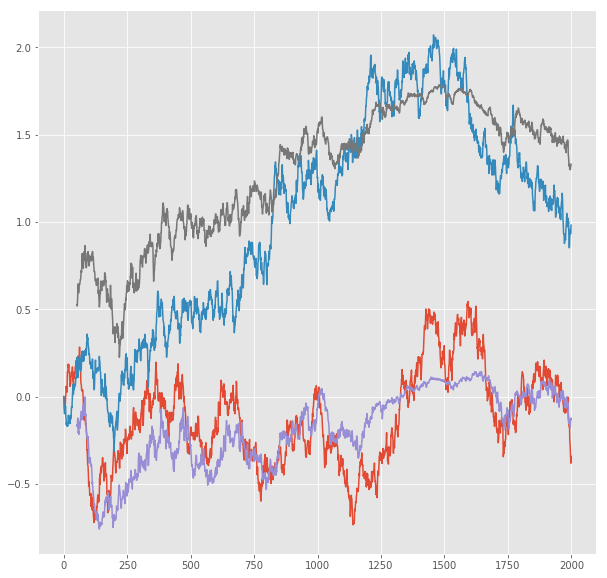

R^2 score for regression on Error: 0.2289
k = 0.3423


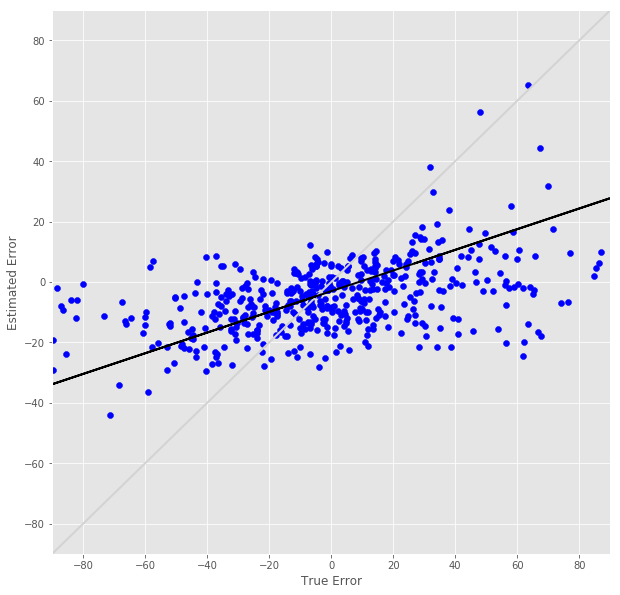

R^2 score for regression on RT: 0.0064
k = 0.0742


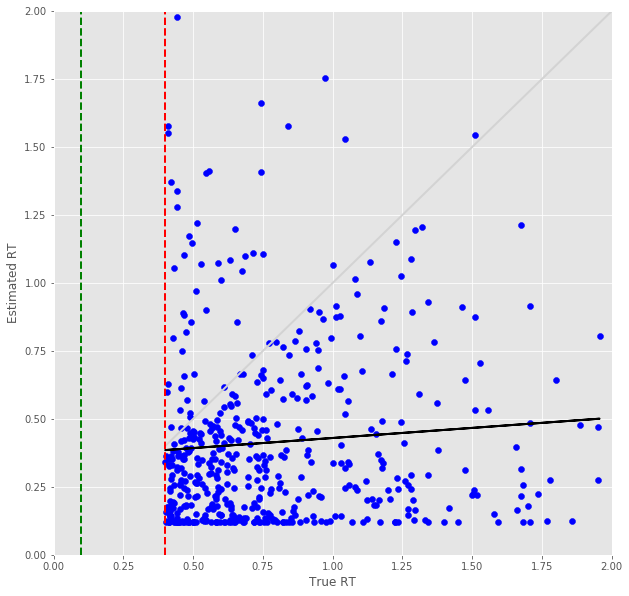

Error Prediction Score: 0.5038 RMSE
RT Prediction Score: 0.5678 RMSE
Error Prediction Corr: 0.4959
RT Prediction Corr: 0.1877
R^2 score for regression on Error: 0.2459
k = 0.3419


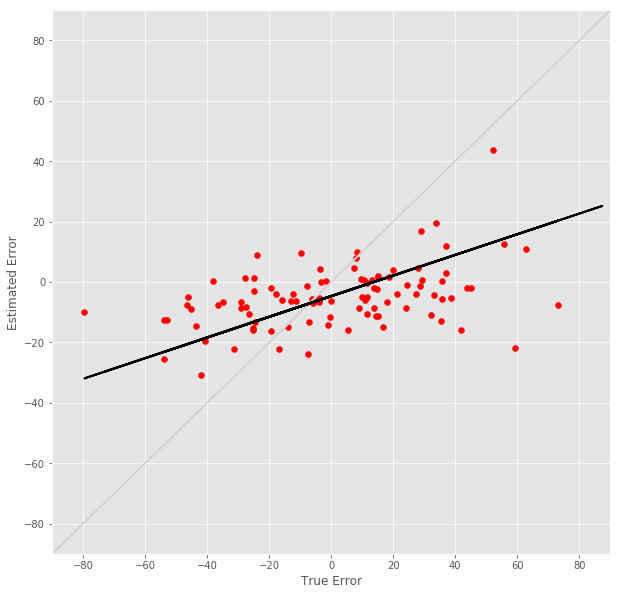

R^2 score for regression on RT: 0.0352
k = 0.2505


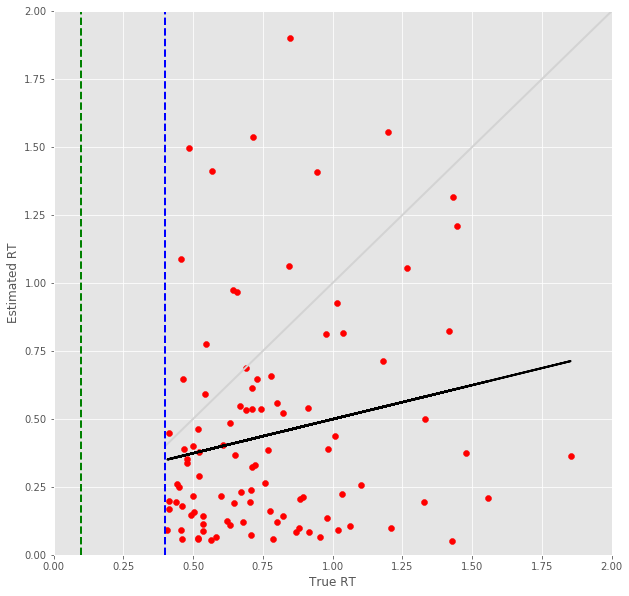

22 -step(s) forecast:
Test Score for 22 -steps forecast: 0.4271 RMSE
Predict Score for 22 -steps forecast: 0.4276 RMSE
Error Test Score for 22 -steps forecast: 0.5646 RMSE
RT Test Score for 22 -steps forecast: 0.6073 RMSE
Error Test Corr for 22 -steps forecast: 0.4697
RT Test Corr for 22 -steps forecast: 0.0481


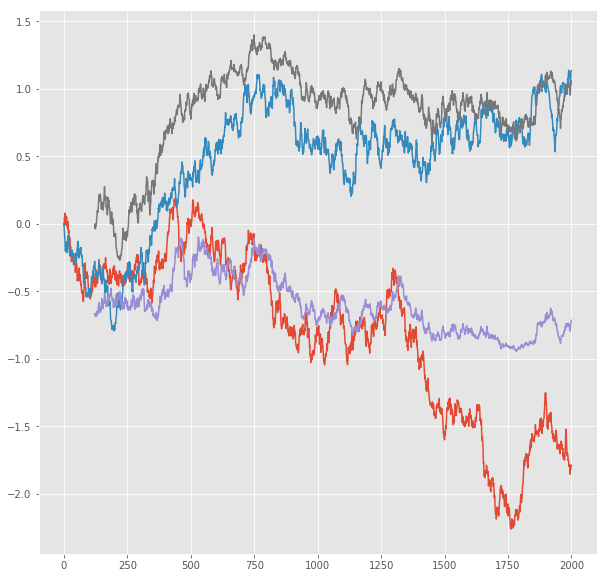

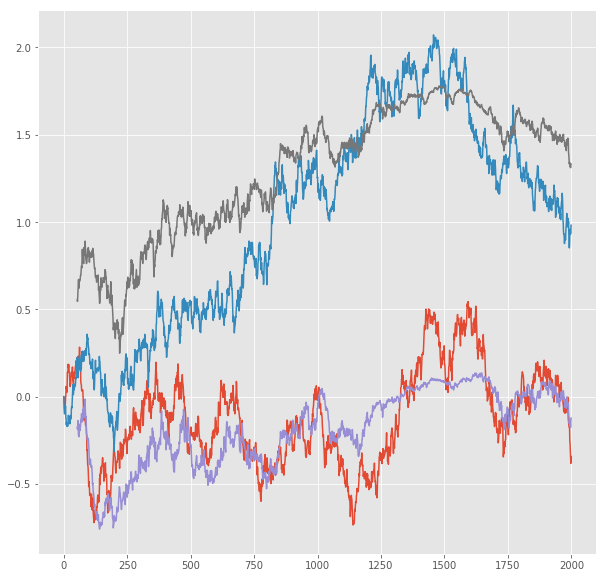

R^2 score for regression on Error: 0.2206
k = 0.3311


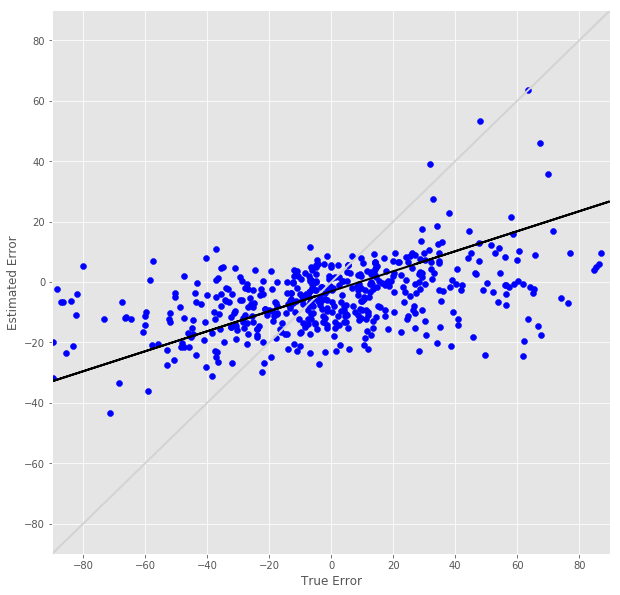

R^2 score for regression on RT: 0.0023
k = 0.0441


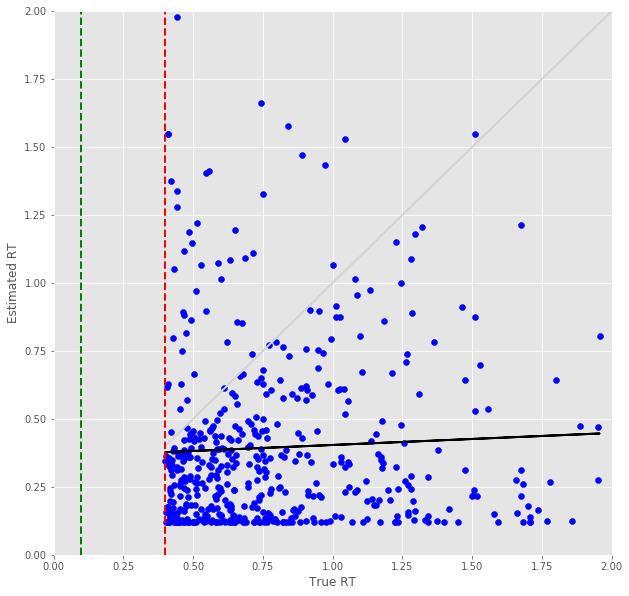

Error Prediction Score: 0.5060 RMSE
RT Prediction Score: 0.5787 RMSE
Error Prediction Corr: 0.4882
RT Prediction Corr: 0.1869
R^2 score for regression on Error: 0.2384
k = 0.3357


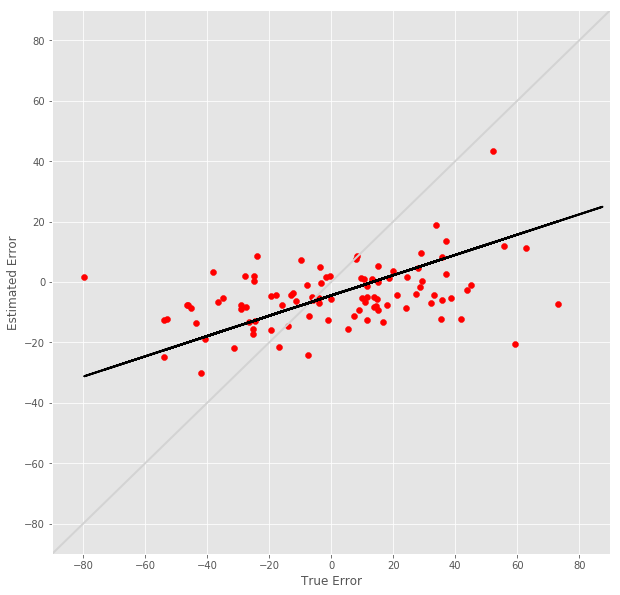

R^2 score for regression on RT: 0.0349
k = 0.2355


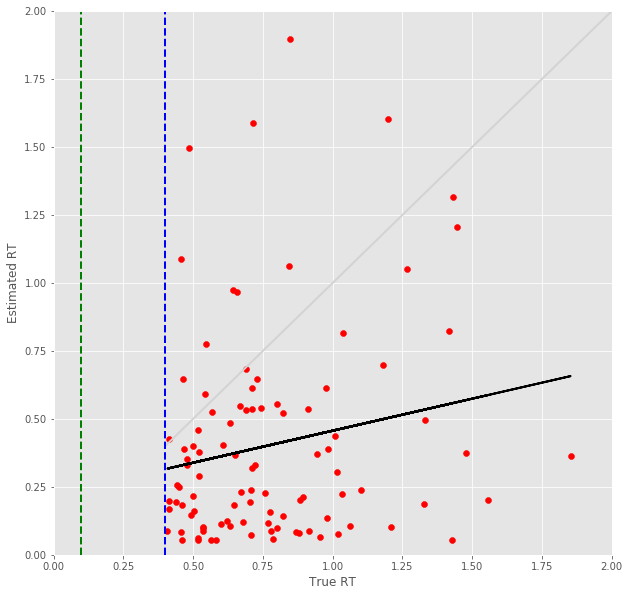

23 -step(s) forecast:
Test Score for 23 -steps forecast: 0.4411 RMSE
Predict Score for 23 -steps forecast: 0.4416 RMSE
Error Test Score for 23 -steps forecast: 0.5721 RMSE
RT Test Score for 23 -steps forecast: 0.6131 RMSE
Error Test Corr for 23 -steps forecast: 0.4425
RT Test Corr for 23 -steps forecast: 0.0675


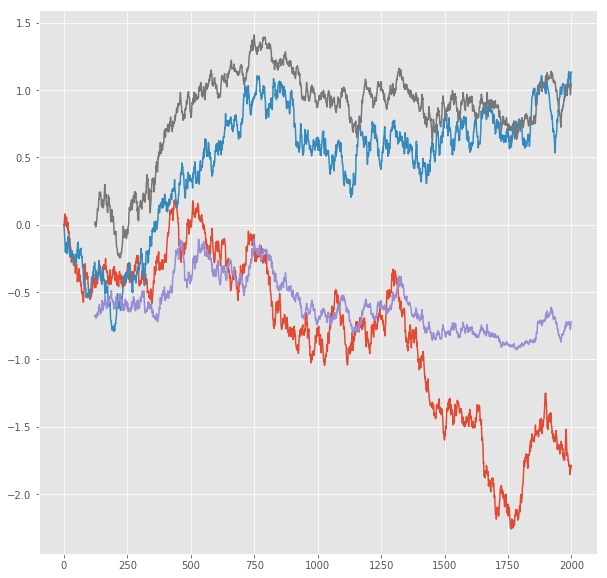

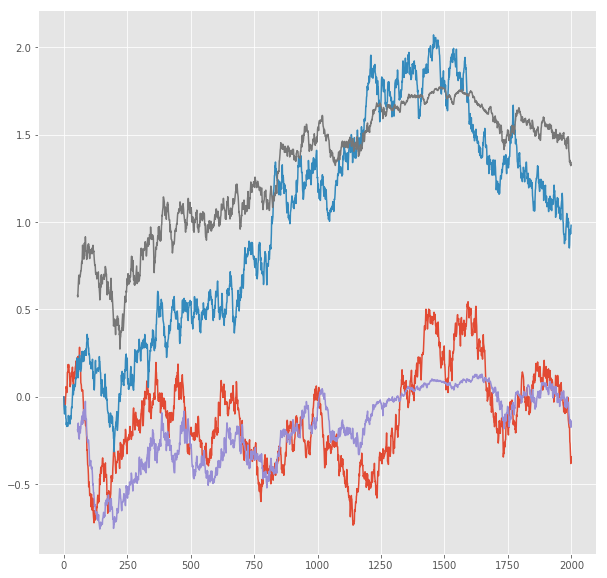

R^2 score for regression on Error: 0.1958
k = 0.2968


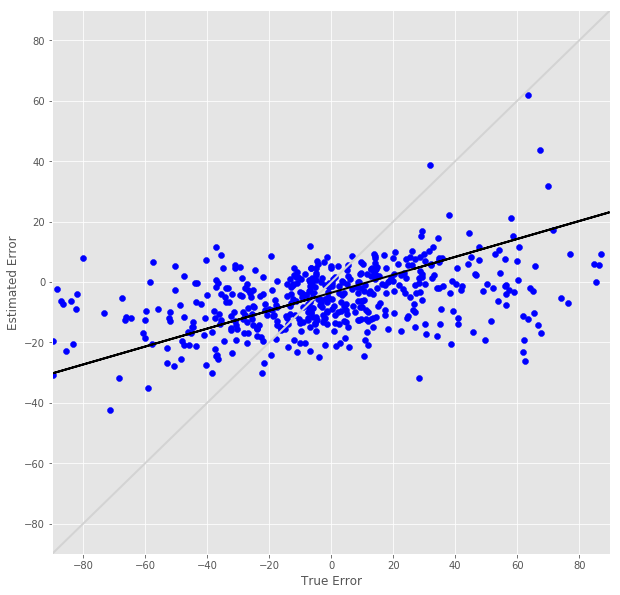

R^2 score for regression on RT: 0.0046
k = 0.0591


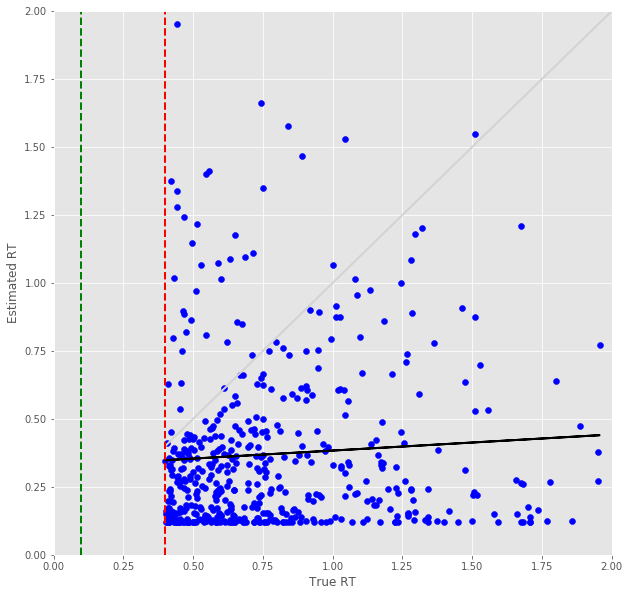

Error Prediction Score: 0.5122 RMSE
RT Prediction Score: 0.5916 RMSE
Error Prediction Corr: 0.4730
RT Prediction Corr: 0.1942
R^2 score for regression on Error: 0.2237
k = 0.3234


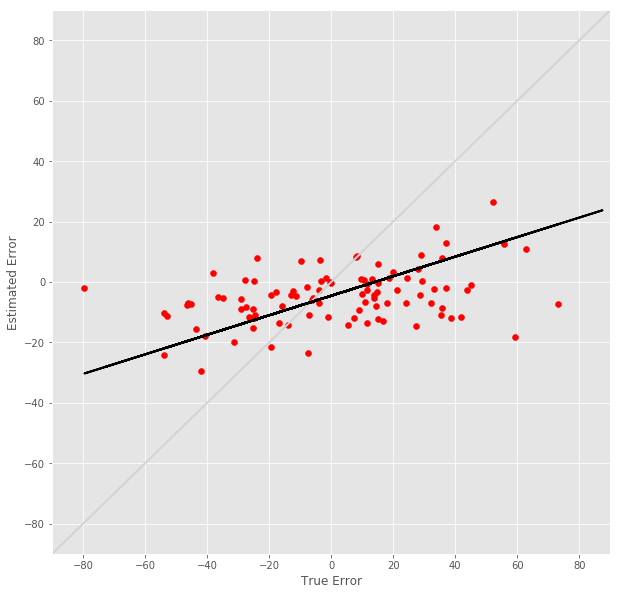

R^2 score for regression on RT: 0.0377
k = 0.2527


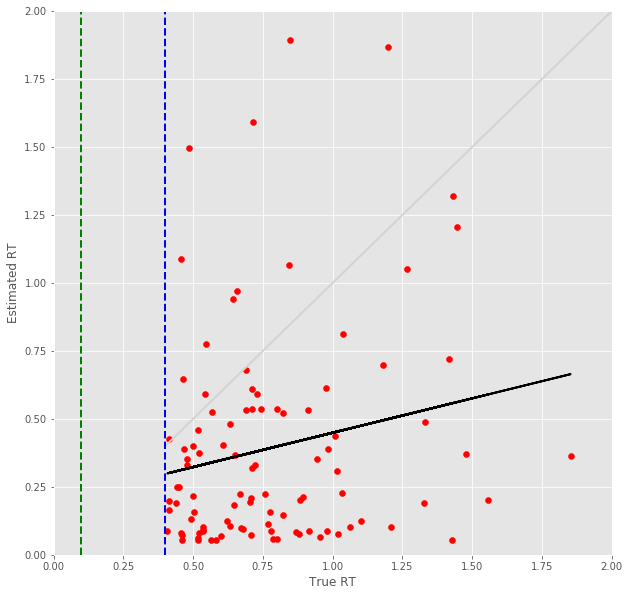

24 -step(s) forecast:
Test Score for 24 -steps forecast: 0.4548 RMSE
Predict Score for 24 -steps forecast: 0.4552 RMSE
Error Test Score for 24 -steps forecast: 0.5782 RMSE
RT Test Score for 24 -steps forecast: 0.6245 RMSE
Error Test Corr for 24 -steps forecast: 0.4502
RT Test Corr for 24 -steps forecast: 0.0621


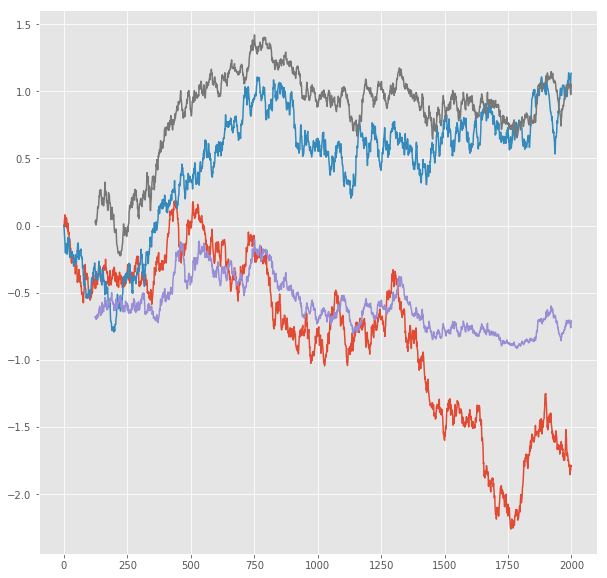

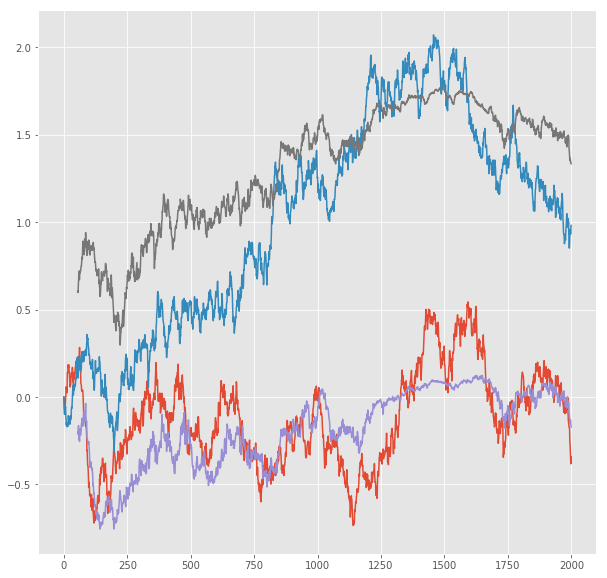

R^2 score for regression on Error: 0.2026
k = 0.3314


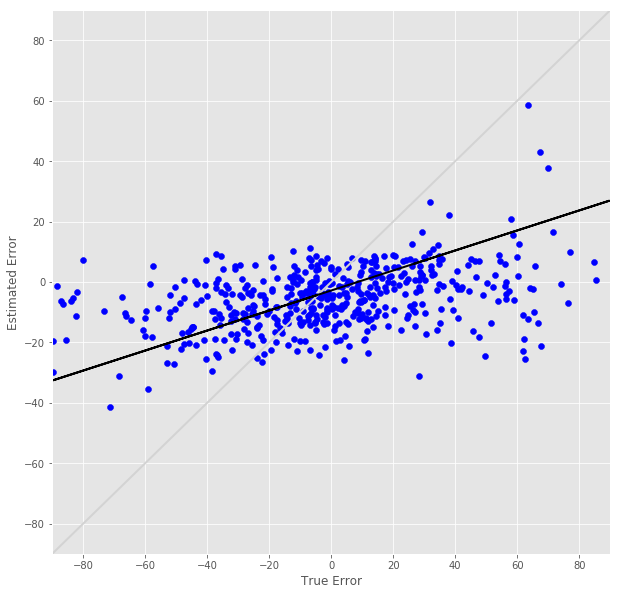

R^2 score for regression on RT: 0.0039
k = 0.0529


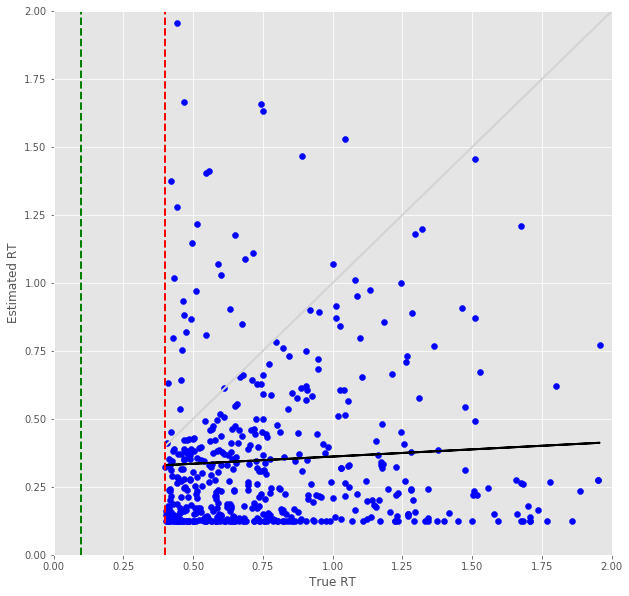

Error Prediction Score: 0.5122 RMSE
RT Prediction Score: 0.5974 RMSE
Error Prediction Corr: 0.4770
RT Prediction Corr: 0.2066
R^2 score for regression on Error: 0.2275
k = 0.3321


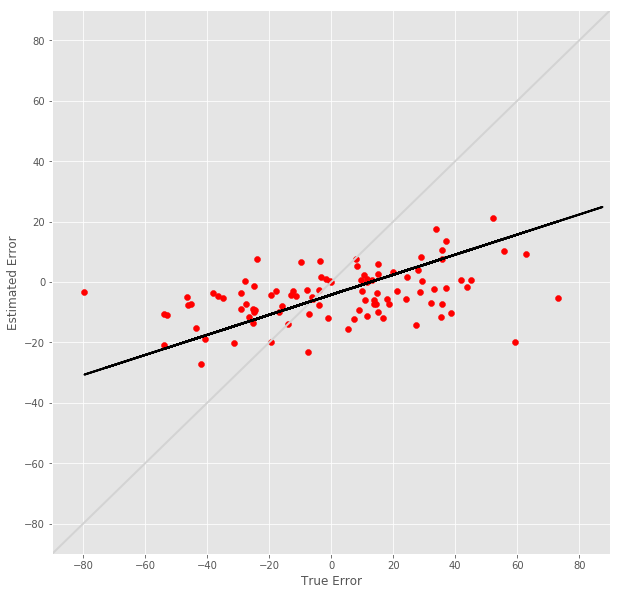

R^2 score for regression on RT: 0.0427
k = 0.2731


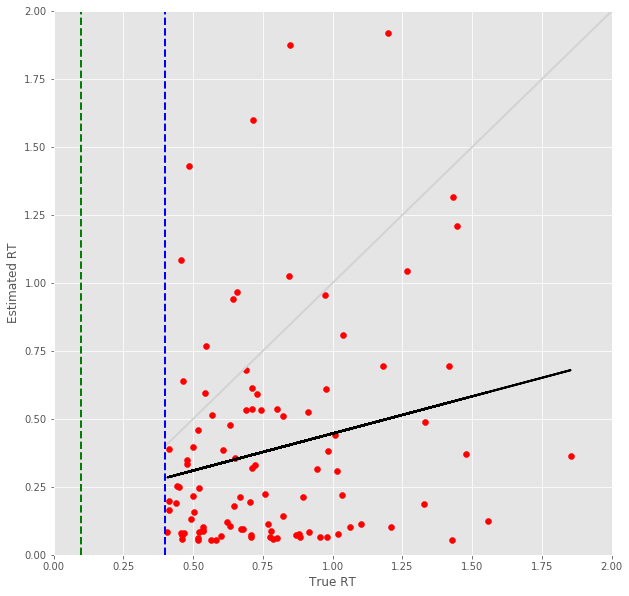

25 -step(s) forecast:
Test Score for 25 -steps forecast: 0.4682 RMSE
Predict Score for 25 -steps forecast: 0.4687 RMSE
Error Test Score for 25 -steps forecast: 0.5809 RMSE
RT Test Score for 25 -steps forecast: 0.6354 RMSE
Error Test Corr for 25 -steps forecast: 0.4242
RT Test Corr for 25 -steps forecast: 0.0636


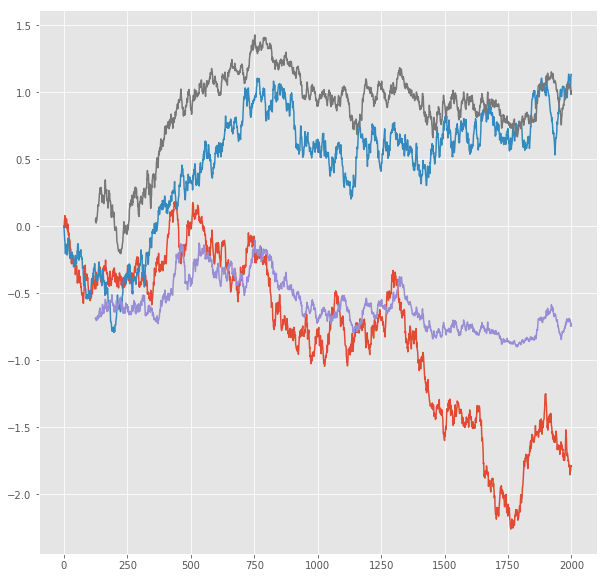

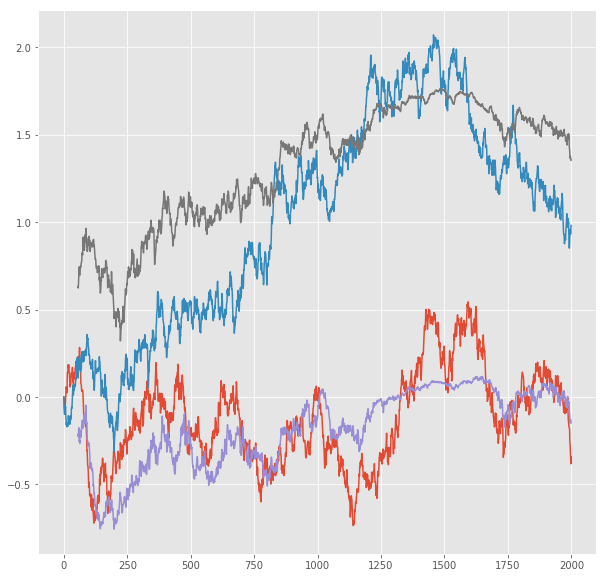

R^2 score for regression on Error: 0.1800
k = 0.2934


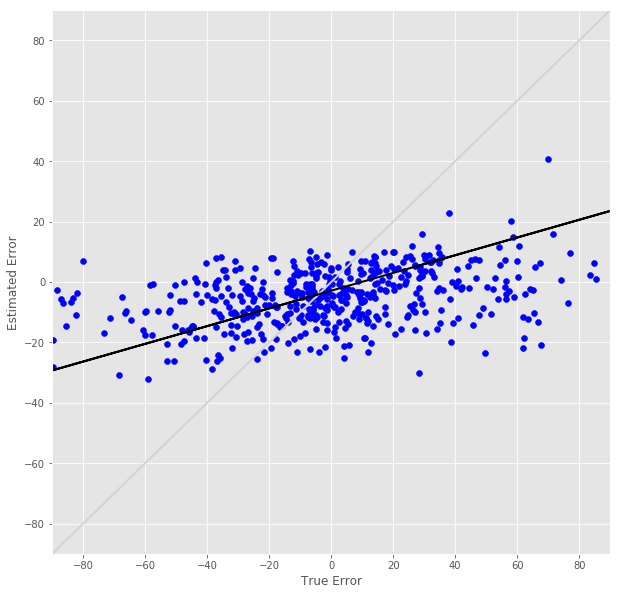

R^2 score for regression on RT: 0.0040
k = 0.0507


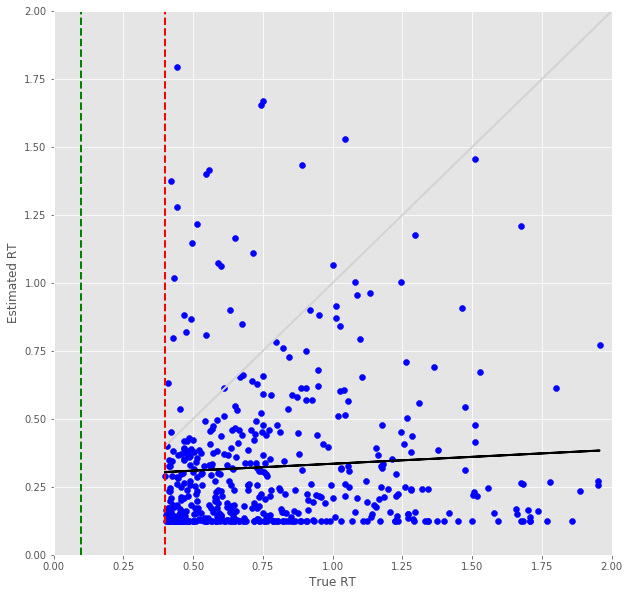

Error Prediction Score: 0.5082 RMSE
RT Prediction Score: 0.6043 RMSE
Error Prediction Corr: 0.4833
RT Prediction Corr: 0.2020
R^2 score for regression on Error: 0.2335
k = 0.3342


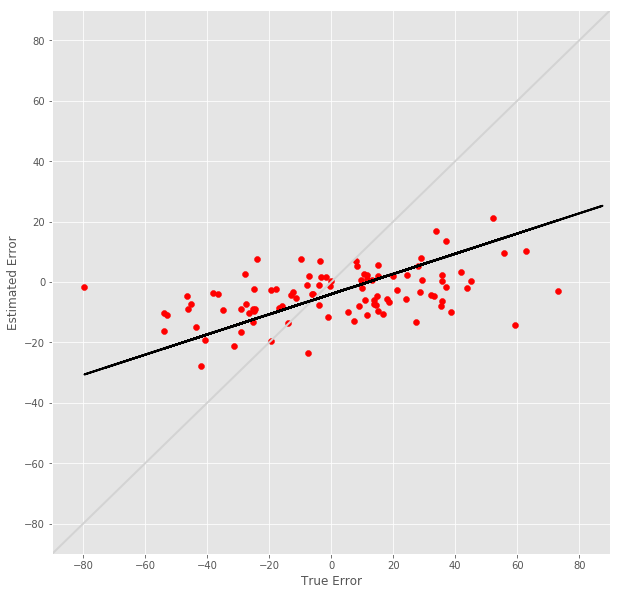

R^2 score for regression on RT: 0.0408
k = 0.2668


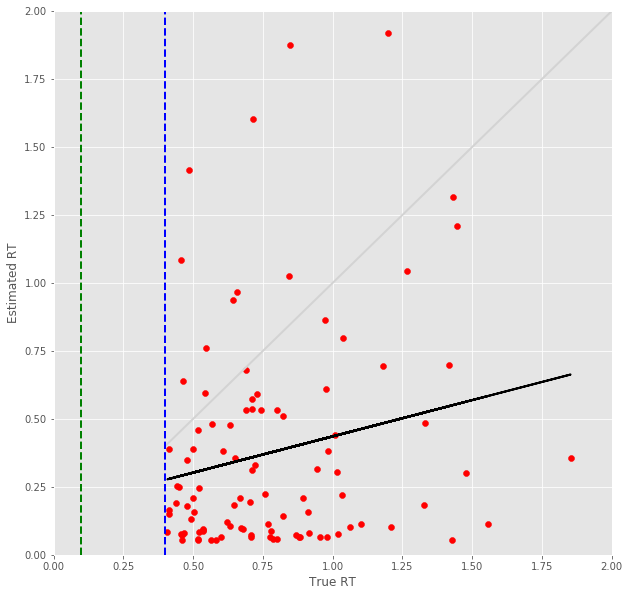

26 -step(s) forecast:
Test Score for 26 -steps forecast: 0.4815 RMSE
Predict Score for 26 -steps forecast: 0.4819 RMSE
Error Test Score for 26 -steps forecast: 0.5826 RMSE
RT Test Score for 26 -steps forecast: 0.6431 RMSE
Error Test Corr for 26 -steps forecast: 0.4199
RT Test Corr for 26 -steps forecast: 0.0635


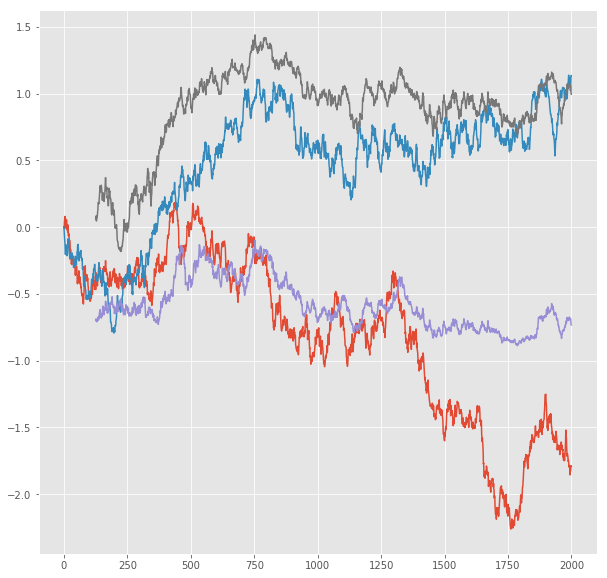

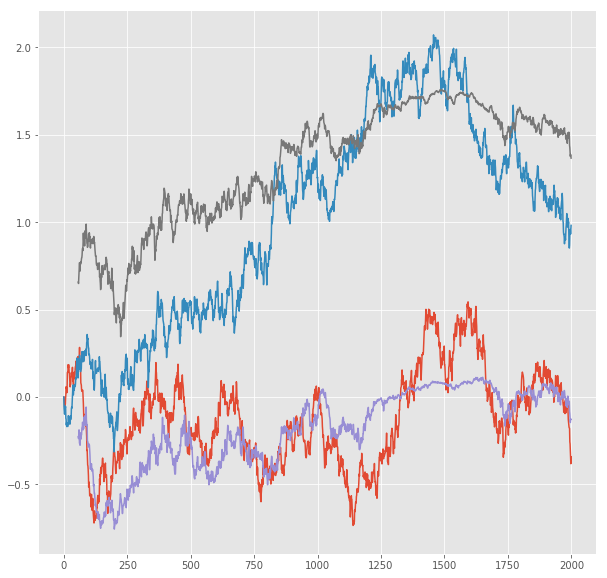

R^2 score for regression on Error: 0.1763
k = 0.2883


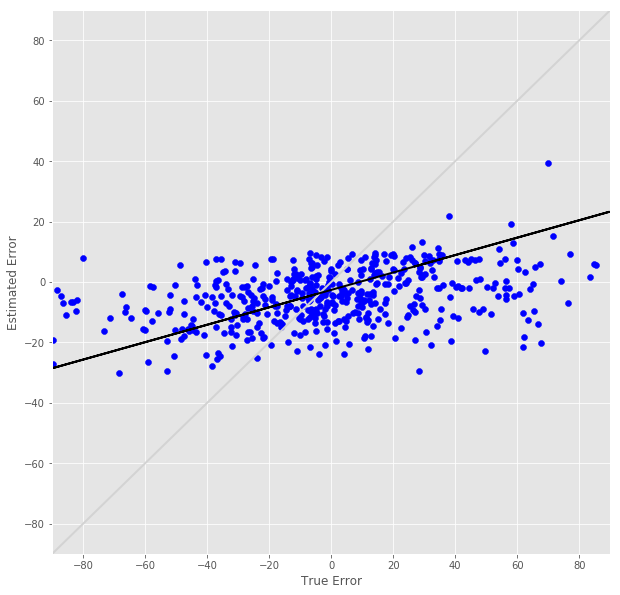

R^2 score for regression on RT: 0.0040
k = 0.0489


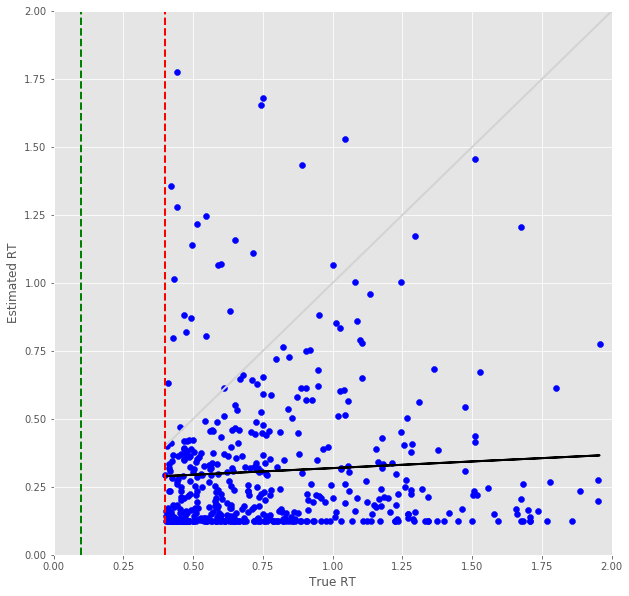

Error Prediction Score: 0.5028 RMSE
RT Prediction Score: 0.6019 RMSE
Error Prediction Corr: 0.4348
RT Prediction Corr: 0.2358
R^2 score for regression on Error: 0.1891
k = 0.2585


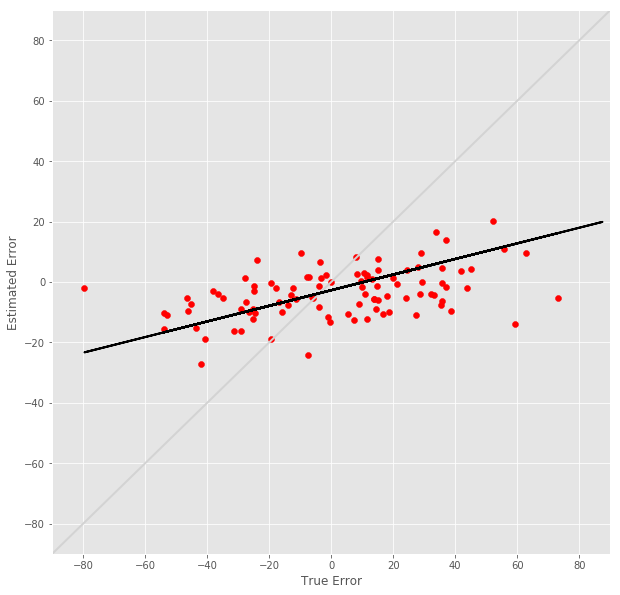

R^2 score for regression on RT: 0.0556
k = 0.2699


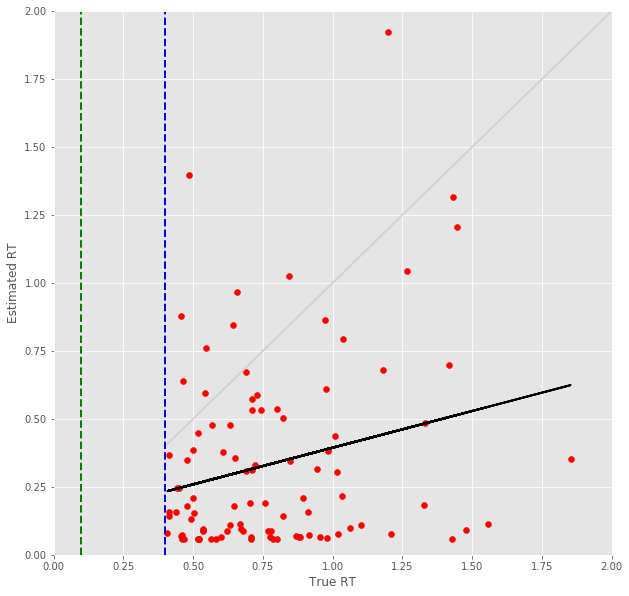

27 -step(s) forecast:
Test Score for 27 -steps forecast: 0.4944 RMSE
Predict Score for 27 -steps forecast: 0.4948 RMSE
Error Test Score for 27 -steps forecast: 0.5853 RMSE
RT Test Score for 27 -steps forecast: 0.6503 RMSE
Error Test Corr for 27 -steps forecast: 0.3980
RT Test Corr for 27 -steps forecast: 0.0588


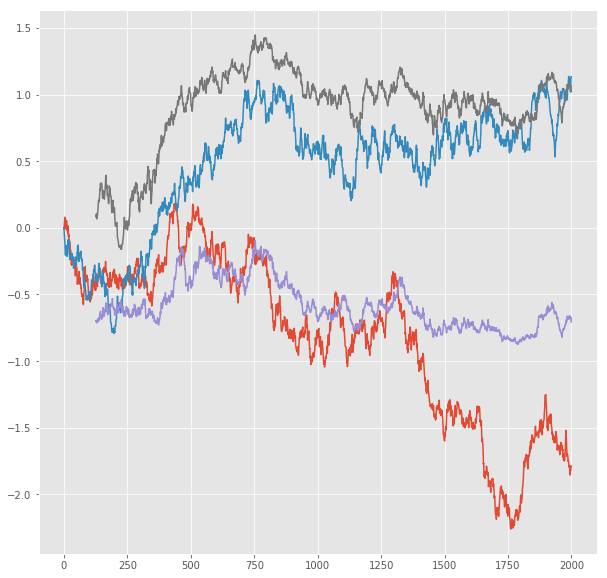

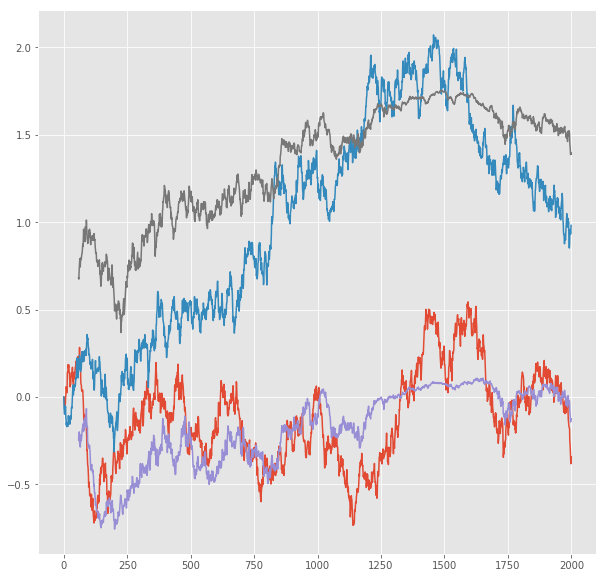

R^2 score for regression on Error: 0.1584
k = 0.2600


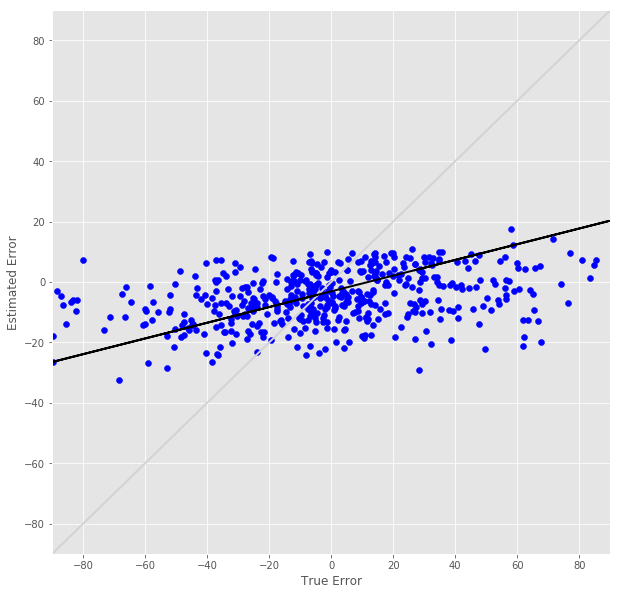

R^2 score for regression on RT: 0.0035
k = 0.0407


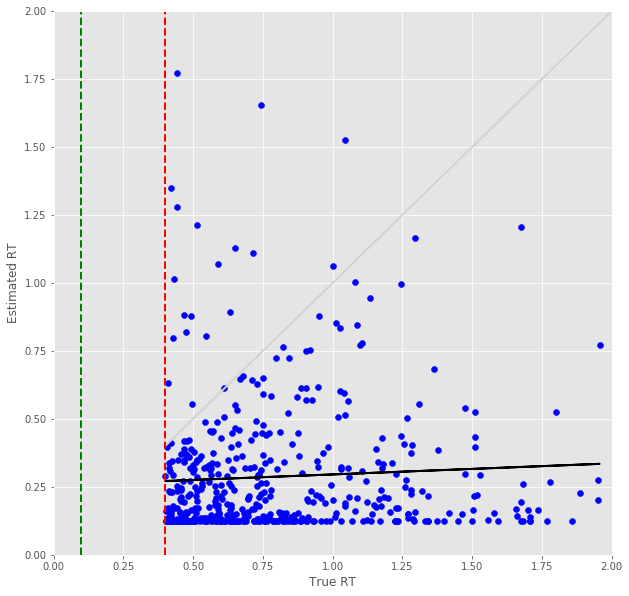

Error Prediction Score: 0.4973 RMSE
RT Prediction Score: 0.6301 RMSE
Error Prediction Corr: 0.4496
RT Prediction Corr: 0.2052
R^2 score for regression on Error: 0.2022
k = 0.2655


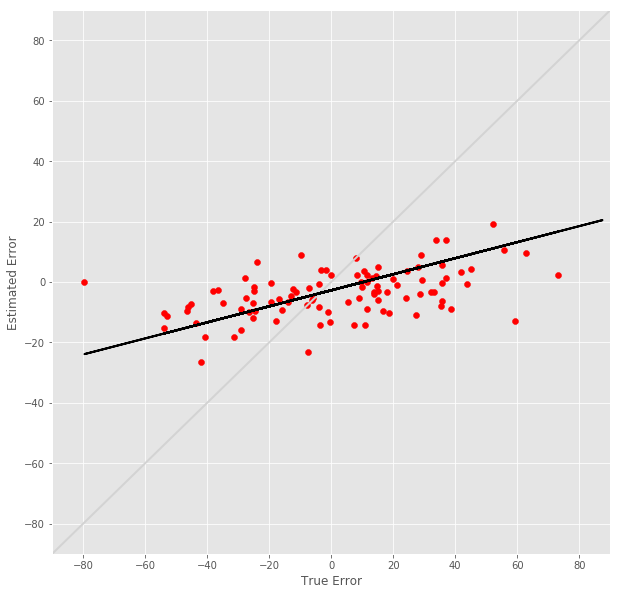

R^2 score for regression on RT: 0.0421
k = 0.2148


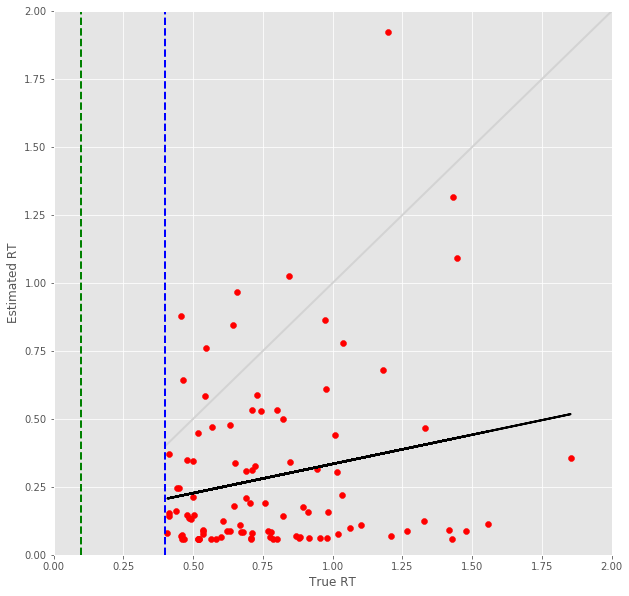

28 -step(s) forecast:
Test Score for 28 -steps forecast: 0.5071 RMSE
Predict Score for 28 -steps forecast: 0.5075 RMSE
Error Test Score for 28 -steps forecast: 0.5882 RMSE
RT Test Score for 28 -steps forecast: 0.6621 RMSE
Error Test Corr for 28 -steps forecast: 0.3907
RT Test Corr for 28 -steps forecast: 0.0197


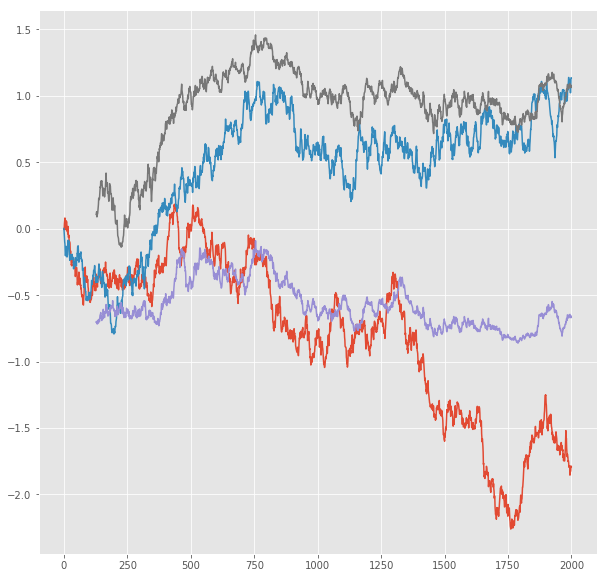

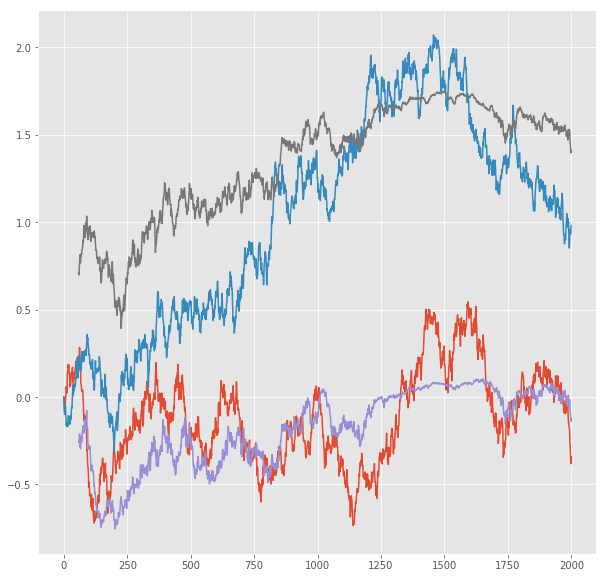

R^2 score for regression on Error: 0.1526
k = 0.2554


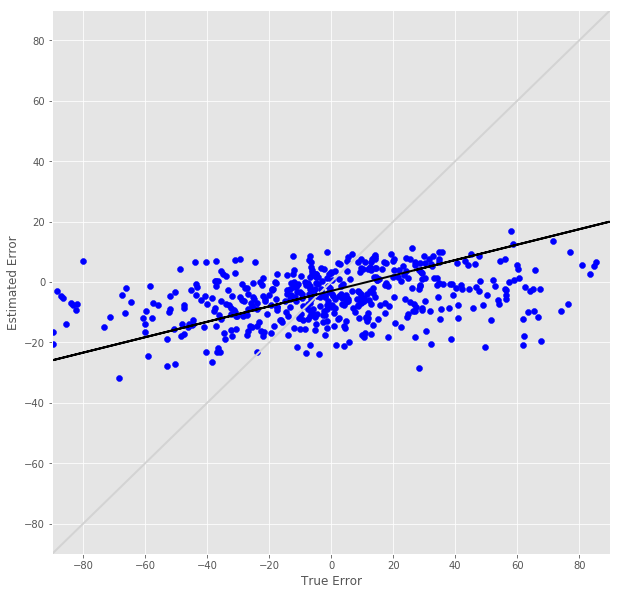

R^2 score for regression on RT: 0.0004
k = 0.0129


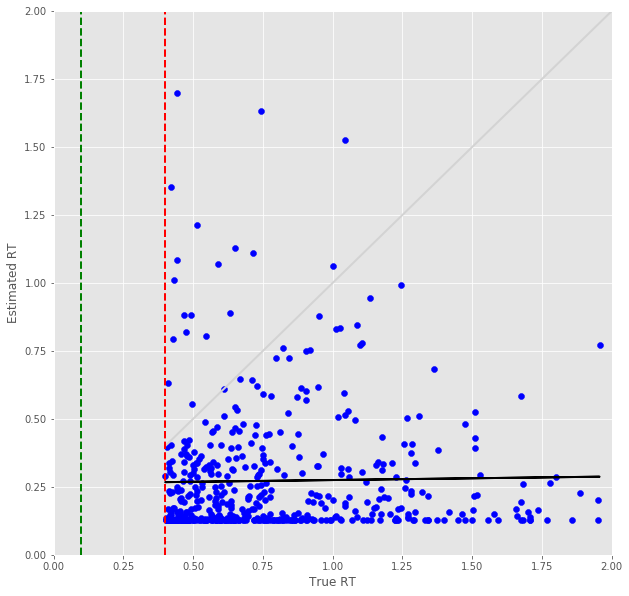

Error Prediction Score: 0.5126 RMSE
RT Prediction Score: 0.6588 RMSE
Error Prediction Corr: 0.4370
RT Prediction Corr: 0.1704
R^2 score for regression on Error: 0.1910
k = 0.2594


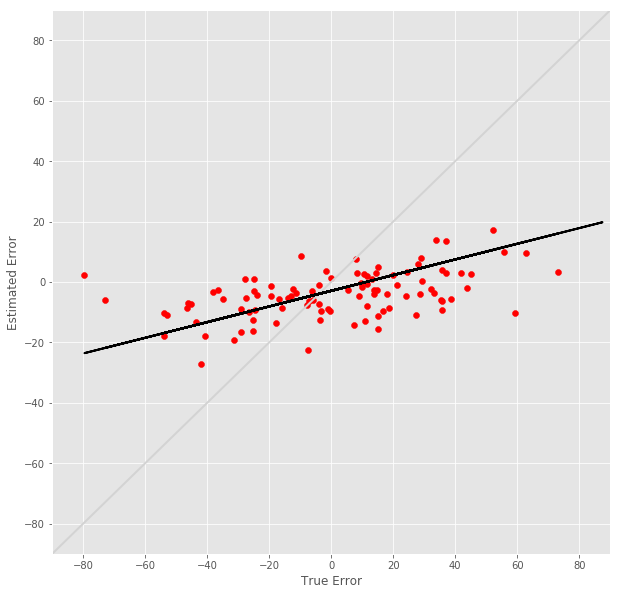

R^2 score for regression on RT: 0.0290
k = 0.1811


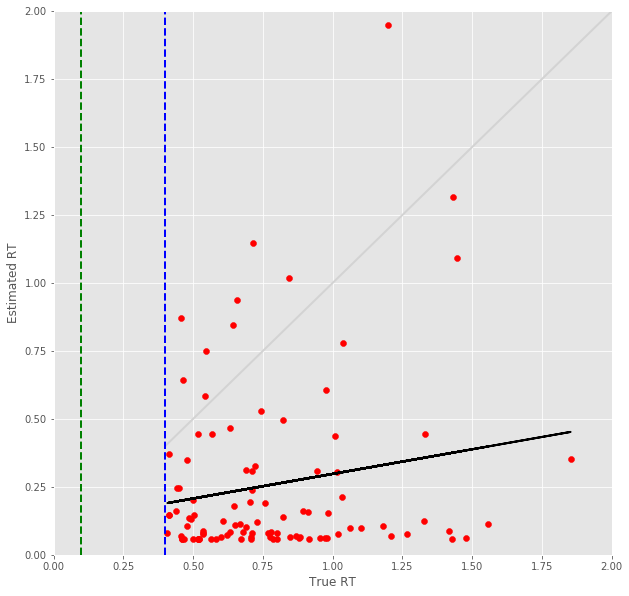

29 -step(s) forecast:
Test Score for 29 -steps forecast: 0.5196 RMSE
Predict Score for 29 -steps forecast: 0.5200 RMSE
Error Test Score for 29 -steps forecast: 0.5917 RMSE
RT Test Score for 29 -steps forecast: 0.6652 RMSE
Error Test Corr for 29 -steps forecast: 0.3664
RT Test Corr for 29 -steps forecast: 0.0296


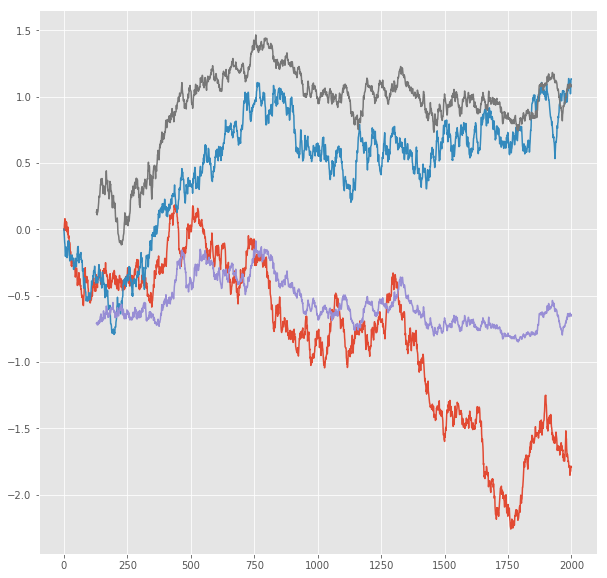

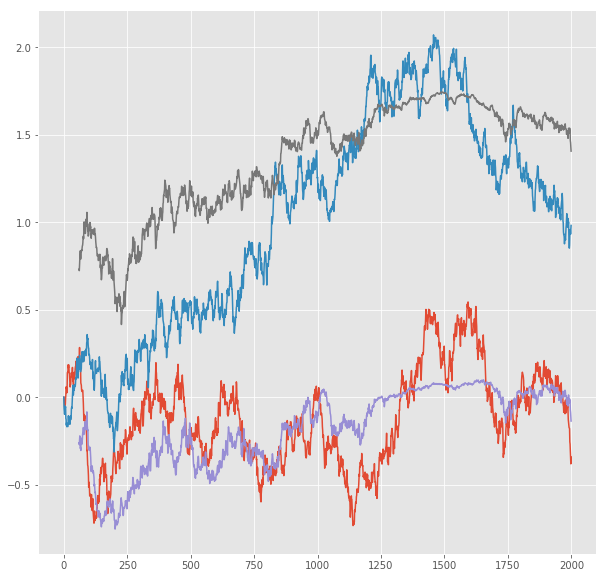

R^2 score for regression on Error: 0.1343
k = 0.2244


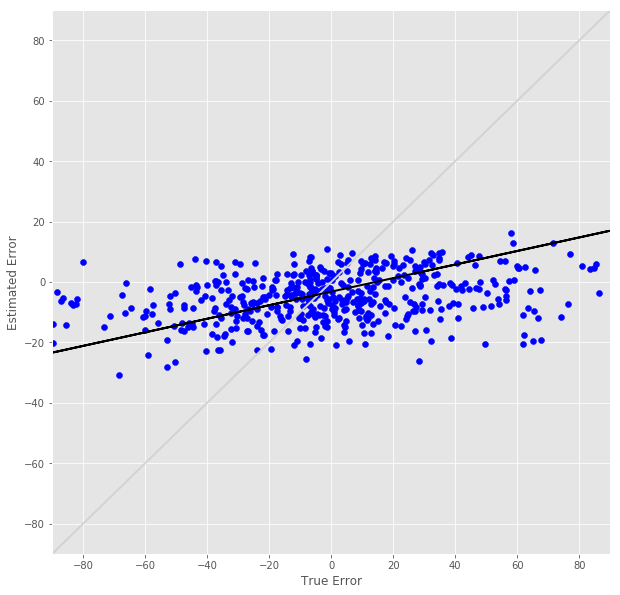

R^2 score for regression on RT: 0.0009
k = 0.0178


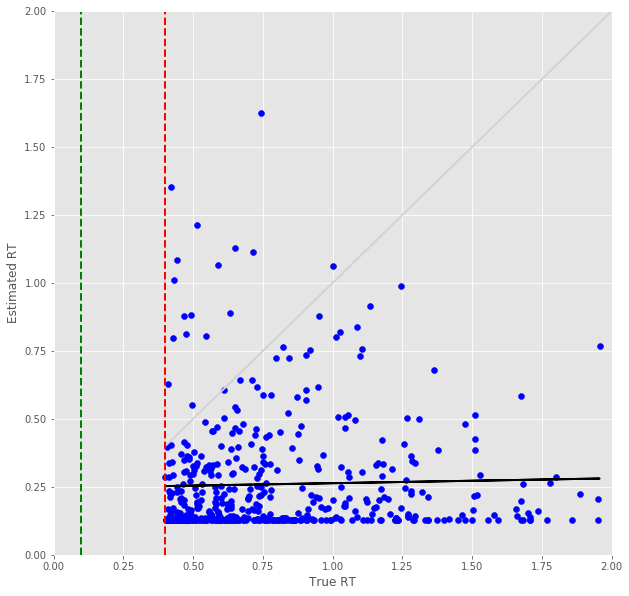

Error Prediction Score: 0.5288 RMSE
RT Prediction Score: 0.6800 RMSE
Error Prediction Corr: 0.3913
RT Prediction Corr: 0.1544
R^2 score for regression on Error: 0.1531
k = 0.2314


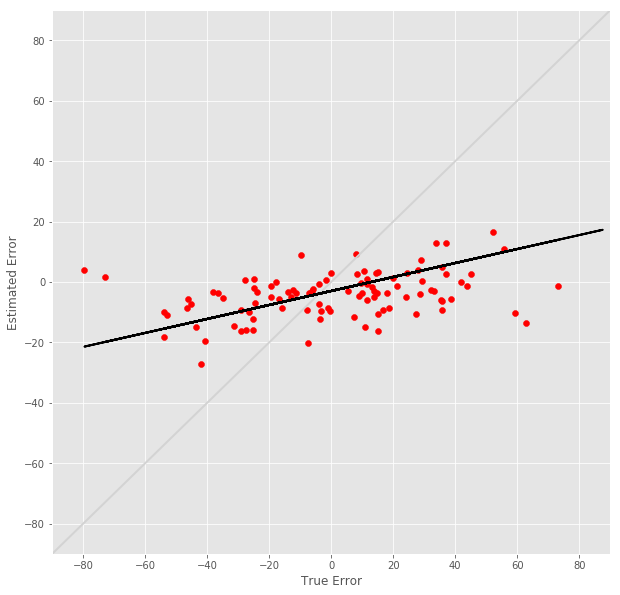

R^2 score for regression on RT: 0.0239
k = 0.1476


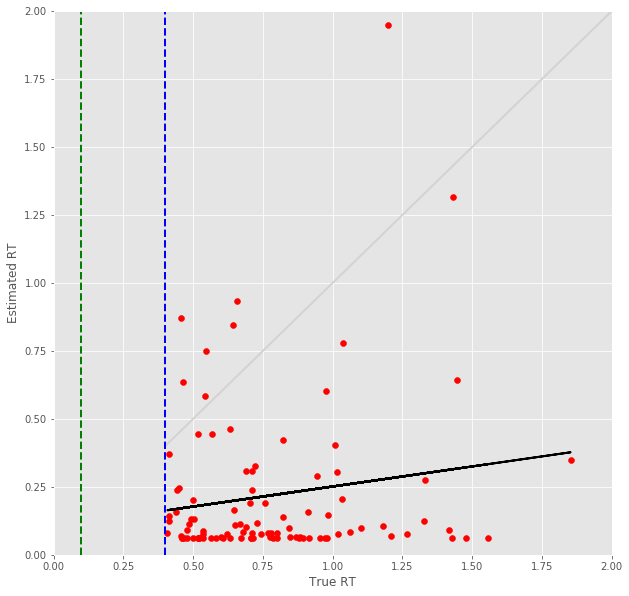

30 -step(s) forecast:
Test Score for 30 -steps forecast: 0.5318 RMSE
Predict Score for 30 -steps forecast: 0.5322 RMSE
Error Test Score for 30 -steps forecast: 0.5916 RMSE
RT Test Score for 30 -steps forecast: 0.6732 RMSE
Error Test Corr for 30 -steps forecast: 0.3650
RT Test Corr for 30 -steps forecast: 0.0187


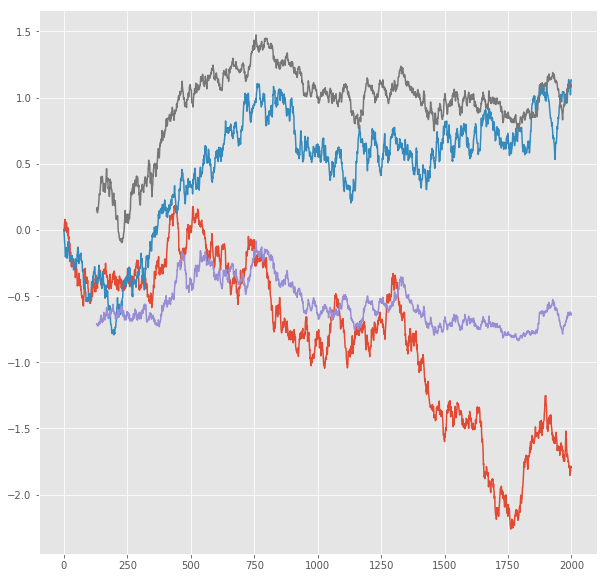

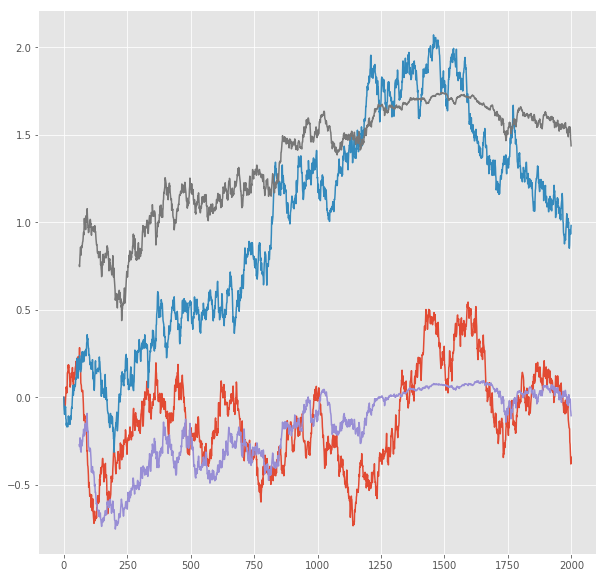

R^2 score for regression on Error: 0.1332
k = 0.2225


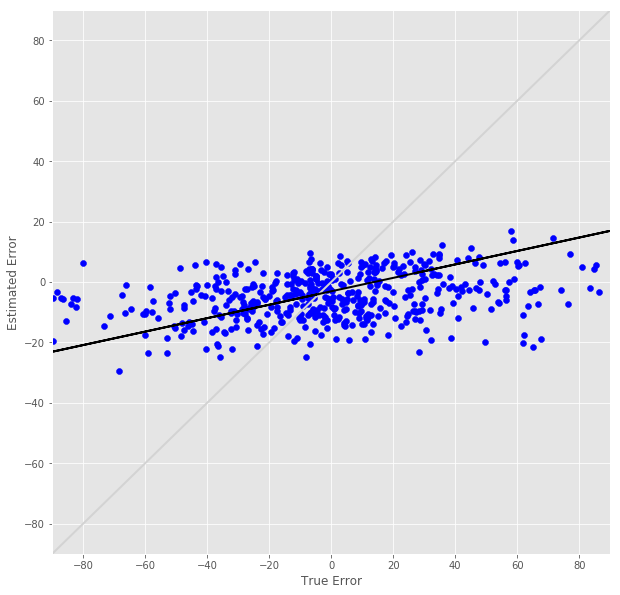

R^2 score for regression on RT: 0.0004
k = 0.0110


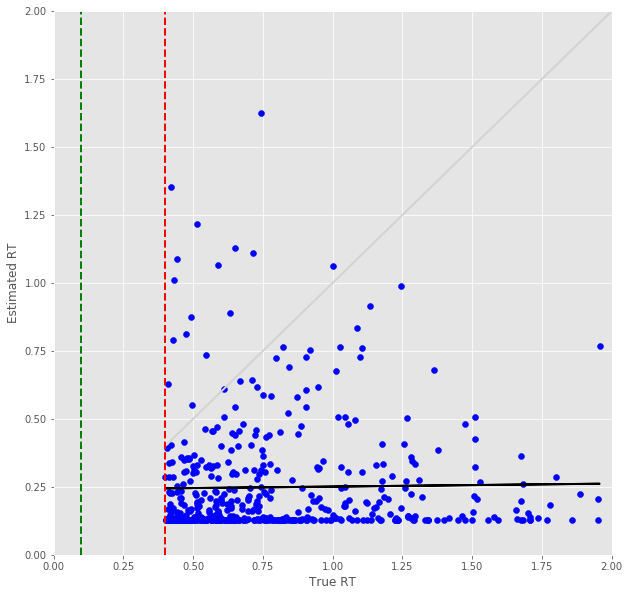

Error Prediction Score: 0.5256 RMSE
RT Prediction Score: 0.6921 RMSE
Error Prediction Corr: 0.3958
RT Prediction Corr: 0.1481
R^2 score for regression on Error: 0.1567
k = 0.2317


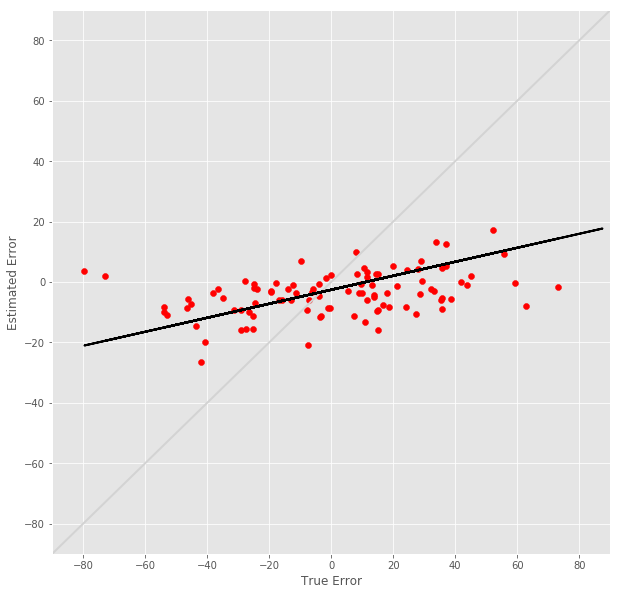

R^2 score for regression on RT: 0.0219
k = 0.1314


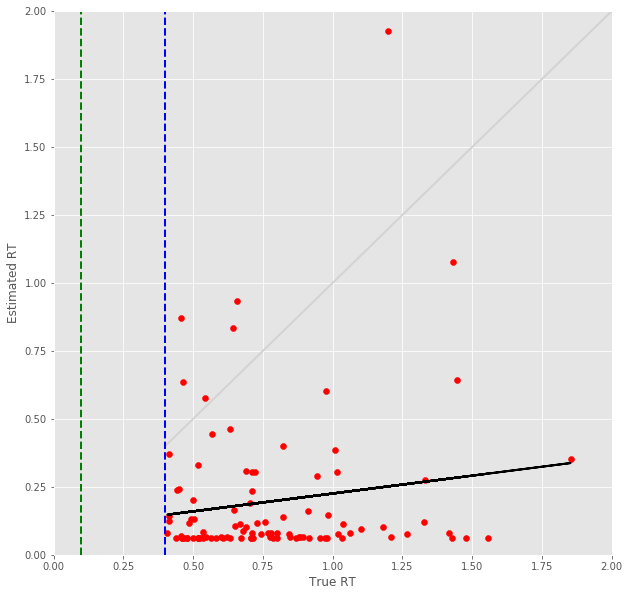

31 -step(s) forecast:
Test Score for 31 -steps forecast: 0.5438 RMSE
Predict Score for 31 -steps forecast: 0.5441 RMSE
Error Test Score for 31 -steps forecast: 0.5931 RMSE
RT Test Score for 31 -steps forecast: 0.6801 RMSE
Error Test Corr for 31 -steps forecast: 0.3453
RT Test Corr for 31 -steps forecast: 0.0344


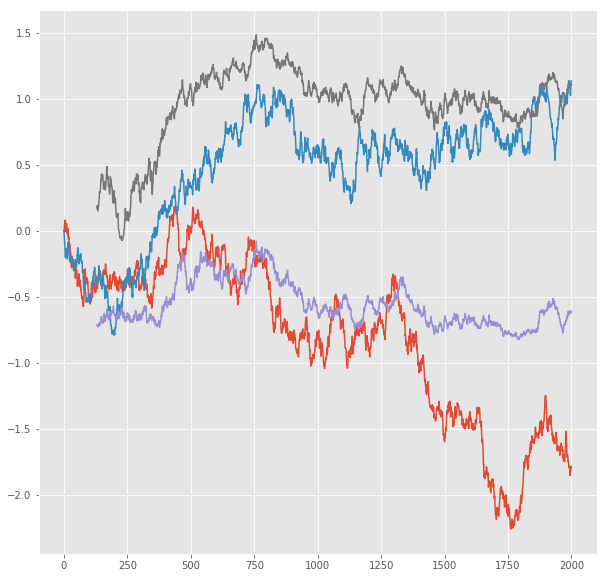

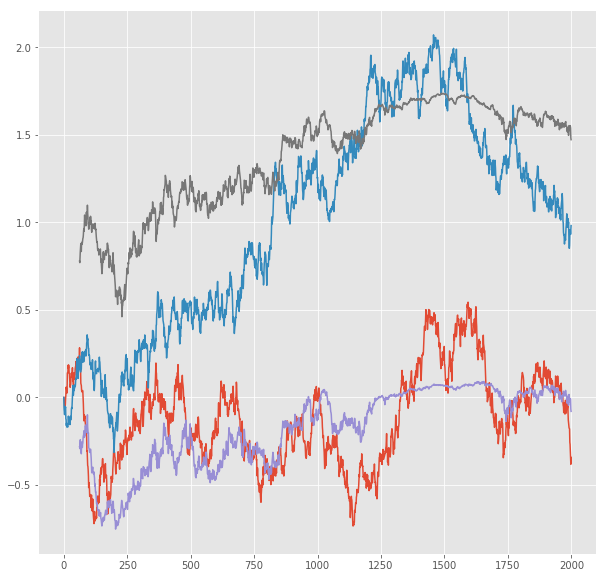

R^2 score for regression on Error: 0.1192
k = 0.1956


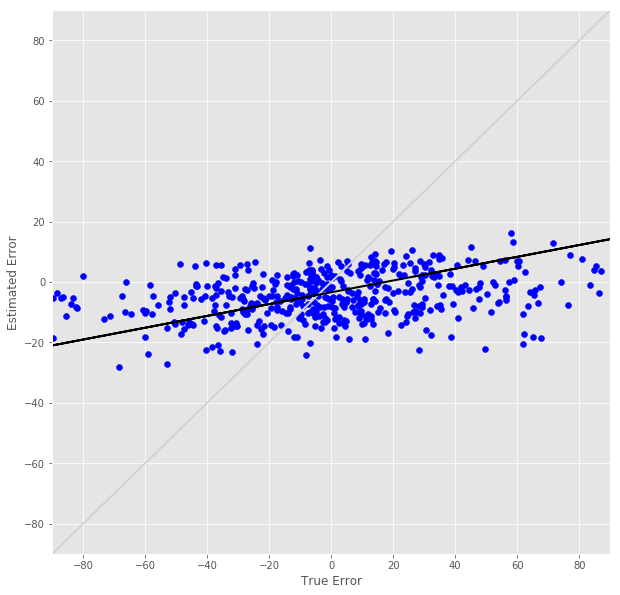

R^2 score for regression on RT: 0.0012
k = 0.0189


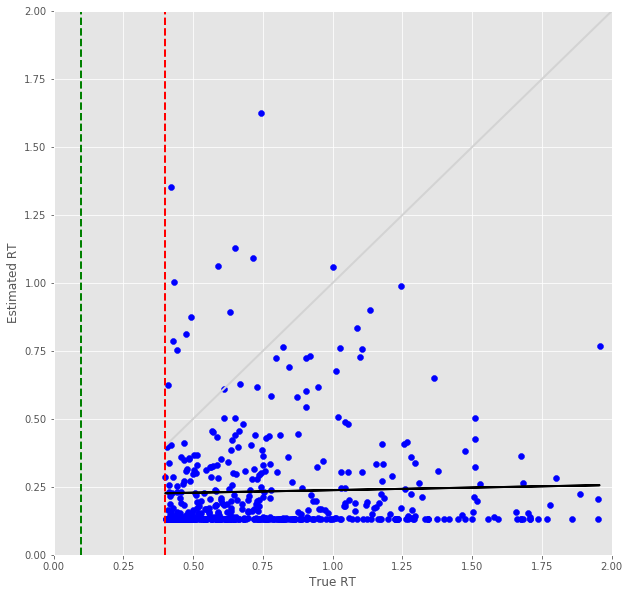

Error Prediction Score: 0.5228 RMSE
RT Prediction Score: 0.7101 RMSE
Error Prediction Corr: 0.4046
RT Prediction Corr: 0.0798
R^2 score for regression on Error: 0.1637
k = 0.2380


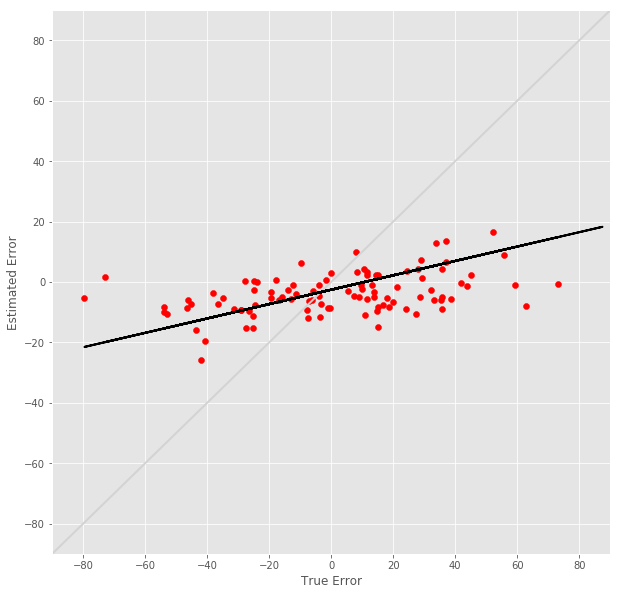

R^2 score for regression on RT: 0.0064
k = 0.0659


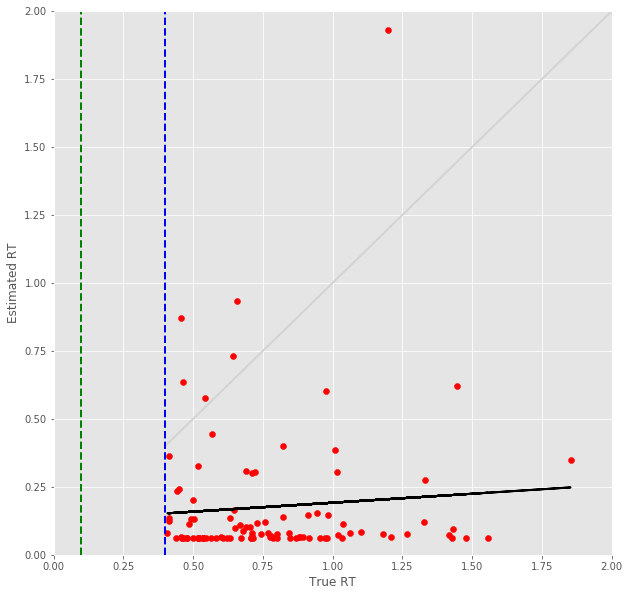

32 -step(s) forecast:
Test Score for 32 -steps forecast: 0.5555 RMSE
Predict Score for 32 -steps forecast: 0.5558 RMSE
Error Test Score for 32 -steps forecast: 0.5939 RMSE
RT Test Score for 32 -steps forecast: 0.6869 RMSE
Error Test Corr for 32 -steps forecast: 0.3413
RT Test Corr for 32 -steps forecast: 0.0502


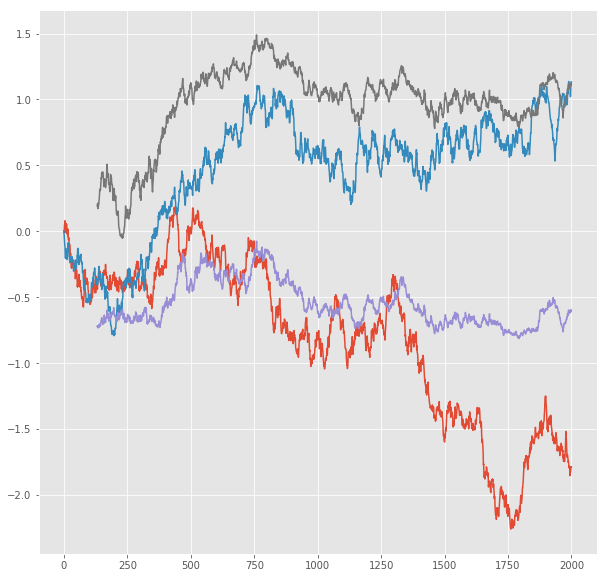

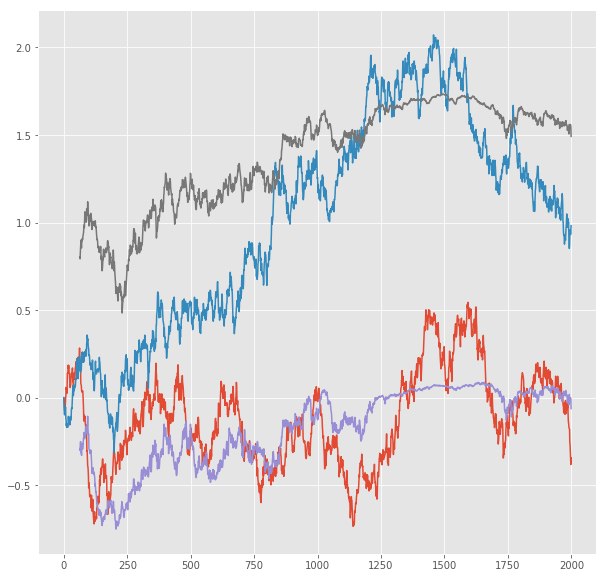

R^2 score for regression on Error: 0.1165
k = 0.1924


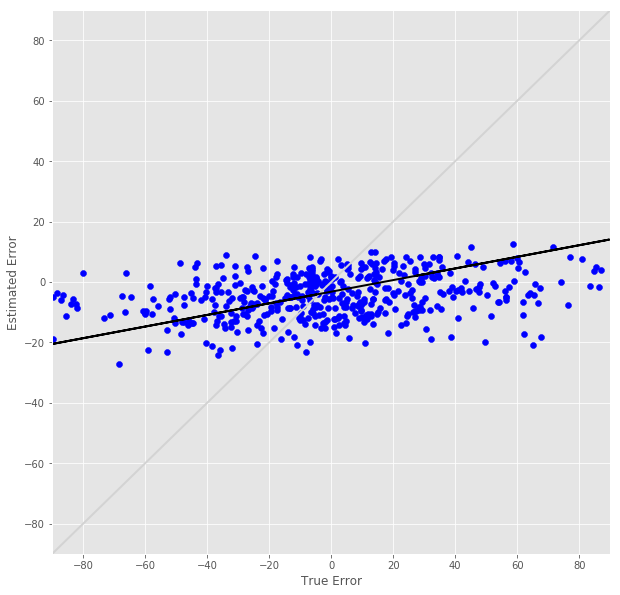

R^2 score for regression on RT: 0.0025
k = 0.0259


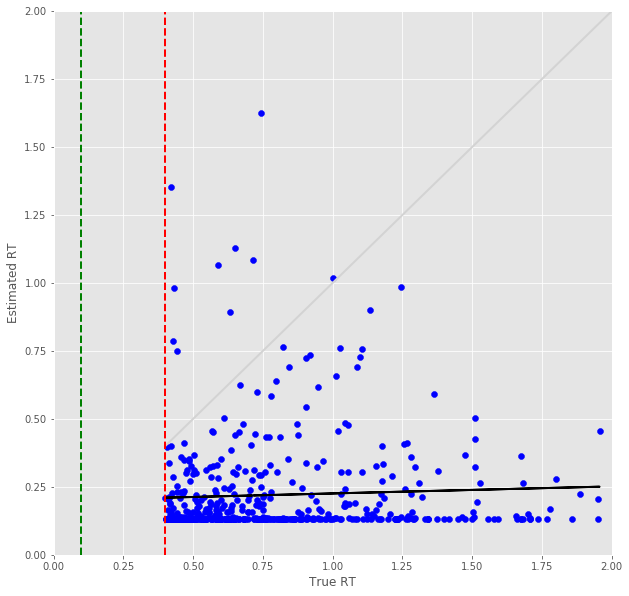

Error Prediction Score: 0.5229 RMSE
RT Prediction Score: 0.7161 RMSE
Error Prediction Corr: 0.4053
RT Prediction Corr: 0.1067
R^2 score for regression on Error: 0.1643
k = 0.2377


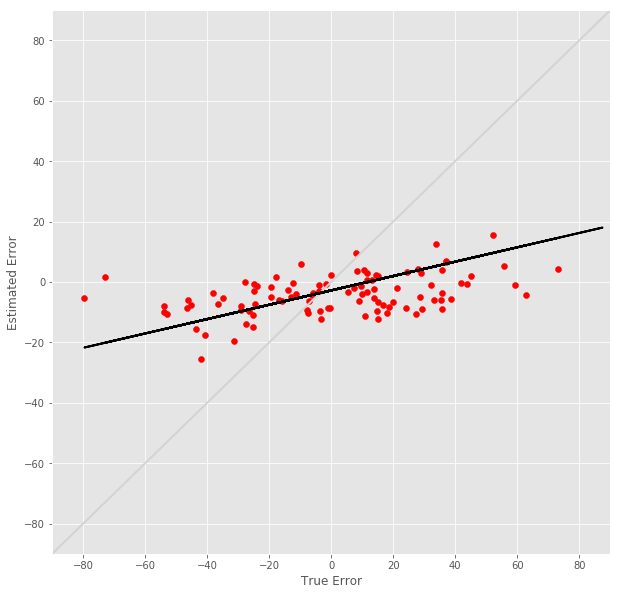

R^2 score for regression on RT: 0.0114
k = 0.0823


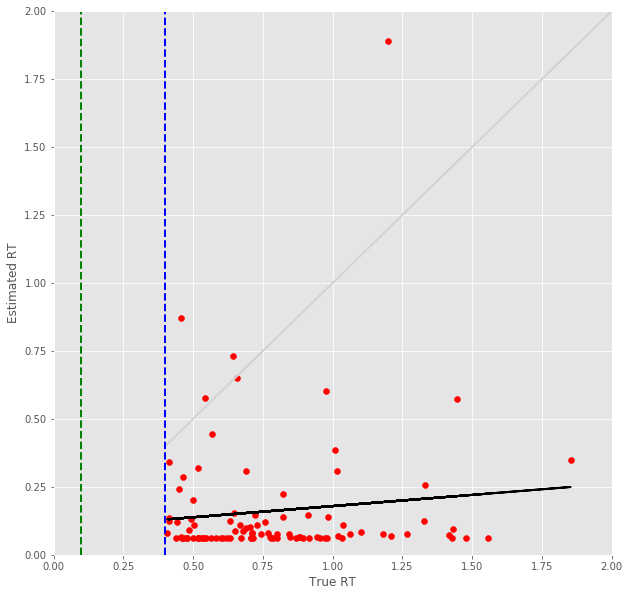

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

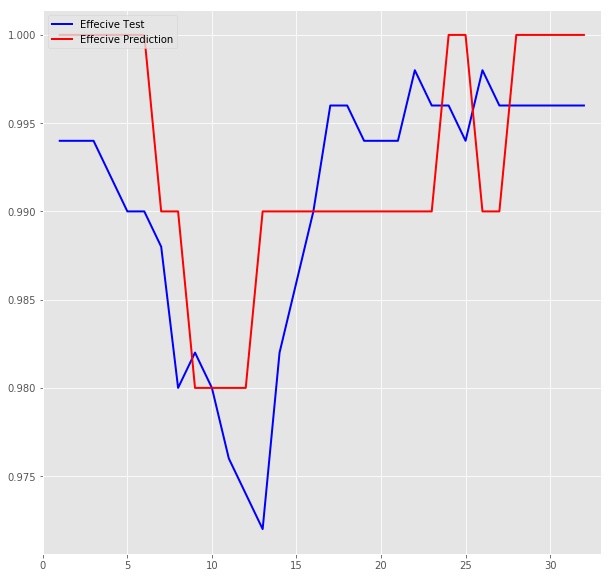

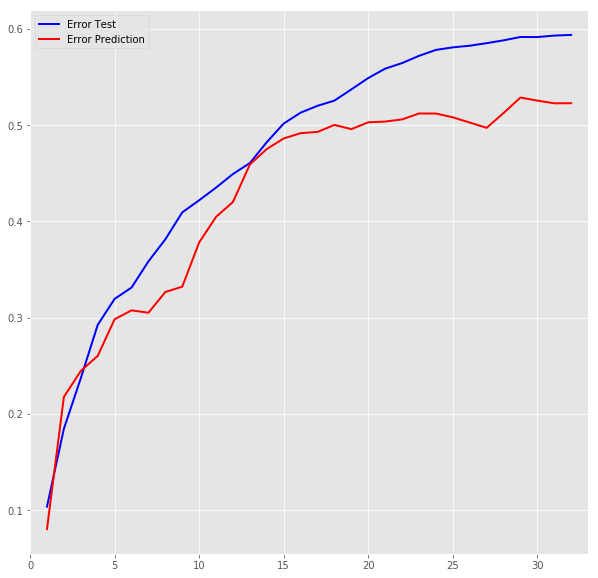

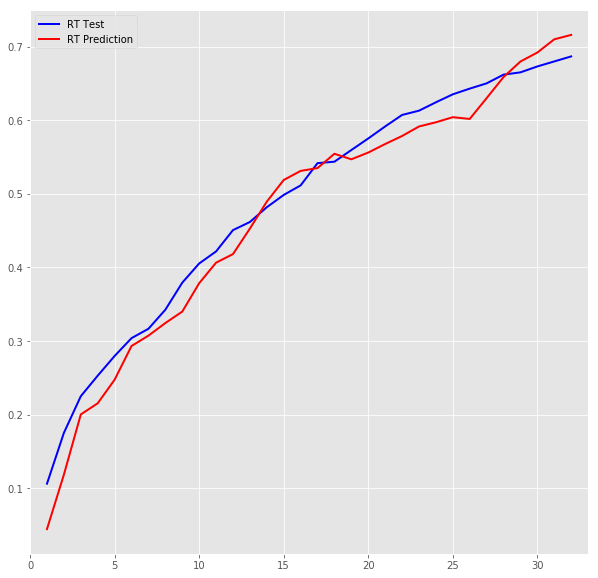

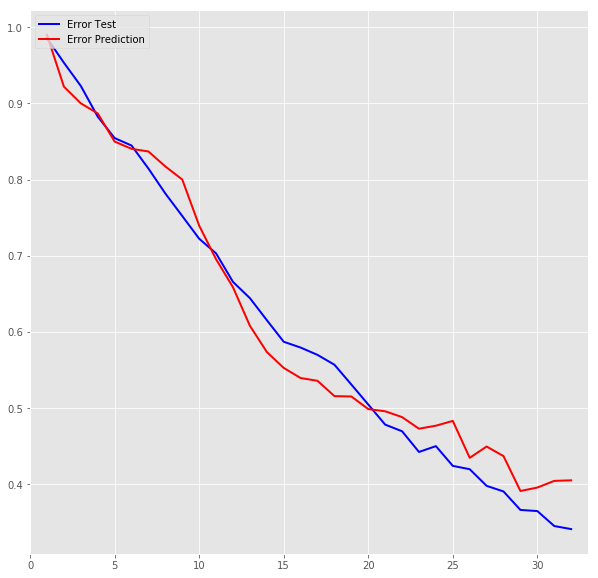

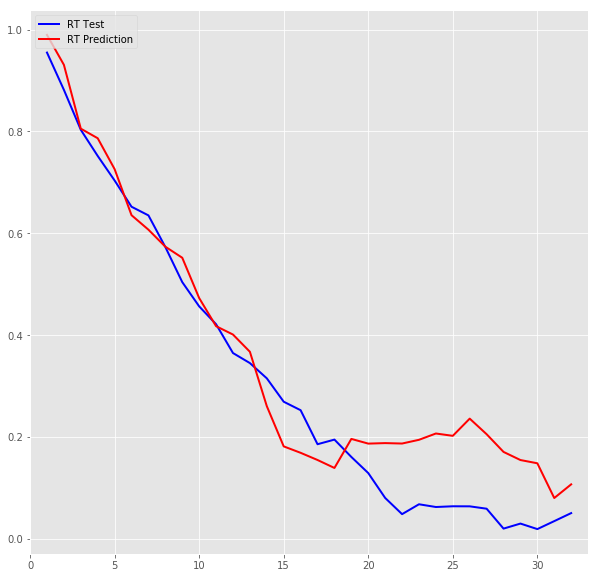

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
